# 5G Drive Test + PCI/RSI Planning Exploratory Data Analysis

This notebook is designed for your **large drive-test pickle file** and the uploaded **NR5G PCI/RSI planning Excel file**.

The goal is not to build the final ML model yet. The goal is to become familiar with the data, understand the headers, identify useful telecom features, and prepare clean outputs for later work such as:

- anomaly detection,
- root cause analysis,
- planning verification,
- PCI/RSI/mod4 clash investigation,
- coverage and quality analytics,
- machine learning feature extraction.

## Expected folder structure

Place this notebook beside a folder named `Raw_Data`:

```text
Project_Folder/
├── Drive_Test_Planning_EDA.ipynb
└── Raw_Data/
    ├── Network_Drive_Test.pkl
    └── NR5G_PCI_RSI_Planning.xlsx
```

The notebook also supports the pickle file being named `Network_Drive_Test` without the `.pkl` extension.

## Notebook workflow

1. Configure paths and display settings.
2. Load the drive-test pickle safely and inspect its object structure.
3. Display headers, data types, sample rows, memory usage, and column groups.
4. Build a data dictionary for the drive-test data.
5. Explore missing values, duplicate rows, numeric/categorical fields, timestamps, coordinates, and telecom KPIs.
6. Load and profile the planning workbook.
7. Run planning-specific checks: PCI, RSI, Mod4, missing planned values, and sector/site structure.
8. Compare drive-test observations against planning data using common fields and optional nearest-site spatial matching.
9. Generate project ideas and feature candidates for later ML/RCA phases.

## Recommended packages

The notebook mainly uses `pandas`, `numpy`, and `matplotlib`. For the Excel file, `openpyxl` is usually needed by pandas. Optional features use `folium` for interactive maps and `scikit-learn` for faster nearest-site search.

```bash
pip install pandas numpy matplotlib openpyxl folium scikit-learn psutil
```

In [1]:
# Core imports
from pathlib import Path
import os
import re
import math
import pickle
import warnings
from typing import Dict, List, Optional, Tuple, Any

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from IPython.display import display, HTML

warnings.filterwarnings("ignore")

# Clear, wide display for telecom data with many columns
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 120)
pd.set_option("display.max_colwidth", 140)
pd.set_option("display.width", 240)

# Matplotlib defaults only; no special colors/styles are forced.
plt.rcParams["figure.figsize"] = (12, 5)
plt.rcParams["axes.grid"] = True

print("Setup complete.")
print("Pandas version:", pd.__version__)

Setup complete.
Pandas version: 2.3.3


# 1. Configuration

Update only this section if your file names or folder names change.

The planning workbook uploaded here contains two sheets based on inspection:

- `Planning`: main planning table with columns such as `site_sector_ID`, `siteID`, `sectors_count`, `sectorID`, `Requires_Planning`, `Azimuth`, `Latitude`, `Longitude`, `Freq Band`, `Cell Radius`, `RSI`, `PCI`, and `Mod4`.
- `Stats`: clash statistics with before/after counts.

In [2]:
DATA_DIR = Path("Raw_Data")
OUTPUT_DIR = Path("EDA_Outputs")
OUTPUT_DIR.mkdir(exist_ok=True)

DRIVE_TEST_CANDIDATES = [
    DATA_DIR / "Network_Drive_Test.pkl",
    DATA_DIR / "Network_Drive_Test",
    DATA_DIR / "Network_Drive_Test.PKL",
]

PLANNING_XLSX = DATA_DIR / "NR5G_PCI_RSI_Planning.xlsx"

# Use samples for expensive exploration so the notebook stays responsive on a large pickle file.
RANDOM_SEED = 42
EDA_SAMPLE_ROWS = 50_000        # general statistics and plotting sample
MAP_SAMPLE_ROWS = 10_000        # map/scatter sample
PROFILE_SAMPLE_ROWS = 100_000   # data dictionary sample for expensive fields
RUN_FULL_DUPLICATE_CHECK = False  # set True if you want exact full duplicate checks; can be heavy on large files

# Planning/drive comparison search radius.
# Start with 7 km because your planning file has Cell Radius = 7000 meters for many N41 cells.
DEFAULT_PLANNING_RADIUS_KM = 7.0

print("Data folder:", DATA_DIR.resolve())
print("Output folder:", OUTPUT_DIR.resolve())
print("Planning file expected at:", PLANNING_XLSX)

Data folder: D:\ITI 9 Months\Graduation Project\Raw_Data
Output folder: D:\ITI 9 Months\Graduation Project\EDA_Outputs
Planning file expected at: Raw_Data\NR5G_PCI_RSI_Planning.xlsx


# 2. Helper functions

These functions make the notebook safer and easier to reuse:

- resolve file paths,
- summarize memory usage,
- handle pickle objects that may be DataFrames, dictionaries, lists, or nested structures,
- create data dictionaries,
- detect telecom columns automatically,
- produce simple plots,
- calculate geographic distance and nearest planning sites.

In [3]:
def resolve_existing_path(candidates: List[Path]) -> Path:
    """
    Return the first file path that actually exists on your machine.

    Why this is useful:
    -------------------
    In notebooks, paths may differ depending on where you run the notebook.
    For example, sometimes the file may be in:
        Raw_Data/Network_Drive_Test.pkl
    or:
        ../Raw_Data/Network_Drive_Test.pkl

    Instead of manually changing the path every time, this function receives
    multiple possible paths and returns the first valid one.

    Parameters:
    -----------
    candidates : List[Path]
        A list of possible file locations.

    Returns:
    --------
    Path
        The first existing path.

    Raises:
    -------
    FileNotFoundError
        If none of the candidate paths exist.
    """

    # Loop over all possible paths one by one.
    for p in candidates:

        # Check whether this path exists on disk.
        if p.exists():

            # Once a valid path is found, return it immediately.
            return p

    # If the loop finishes without returning anything, it means none of
    # the paths were valid. We raise a clear error showing all attempted paths.
    raise FileNotFoundError(
        "None of these files were found:\n" +
        "\n".join(str(p) for p in candidates)
    )


def human_bytes(num_bytes: float) -> str:
    """
    Convert a raw byte value into a human-readable memory/file-size string.

    Example:
    --------
    Instead of showing:
        741343232 bytes

    This function shows something easier to understand, like:
        707.00 MB

    Why this is useful:
    -------------------
    Since the drive-test pickle file is very large, memory and file-size
    reporting should be readable. This helps you understand whether the file
    or DataFrame is using MBs or GBs of memory.

    Parameters:
    -----------
    num_bytes : float
        Size in bytes.

    Returns:
    --------
    str
        Friendly size string such as "12.50 MB" or "1.20 GB".
    """

    # If the input is missing or NaN, return a clear placeholder.
    if pd.isna(num_bytes):
        return "N/A"

    # Units are ordered from smallest to largest.
    units = ["B", "KB", "MB", "GB", "TB"]

    # Convert input to float so division works correctly.
    size = float(num_bytes)

    # Keep dividing by 1024 until the number becomes small enough
    # to fit naturally in the current unit.
    for unit in units:
        if size < 1024:
            return f"{size:,.2f} {unit}"
        size /= 1024

    # If the value is larger than TB, show it as PB.
    return f"{size:,.2f} PB"


def memory_report(label: str = "") -> None:
    """
    Print the current memory usage of the running Python process.

    Why this is useful:
    -------------------
    Pickle files are not usually read in chunks like CSV files.
    When loading a large .pkl file, Python may need to load the full object
    into RAM at once. This function helps you monitor RAM usage before and
    after loading the file.

    Parameters:
    -----------
    label : str
        Optional text to describe when the memory was measured.
        Example:
            memory_report("Before loading")
            memory_report("After loading")

    Notes:
    ------
    This function requires the psutil package.
    If psutil is not installed, the function will not crash the notebook.
    Instead, it prints an installation suggestion.
    """

    try:
        # psutil allows us to inspect system and process information.
        import psutil

        # Get the current Python process ID.
        process = psutil.Process(os.getpid())

        # RSS means Resident Set Size:
        # the amount of physical RAM currently used by this Python process.
        mem = process.memory_info().rss

        # Print the memory in a readable format.
        print(f"{label} process memory: {human_bytes(mem)}")

    except Exception:
        # Keep the notebook running even if psutil is not installed.
        print("Install psutil for process memory reporting: pip install psutil")


def df_memory(df: pd.DataFrame) -> pd.DataFrame:
    """
    Return a table showing memory usage per DataFrame column.

    Why this is useful:
    -------------------
    In large drive-test datasets, some columns may consume a lot of memory,
    especially object/string columns such as cell names, event names, logs,
    timestamps stored as text, or repeated categorical values.

    This function helps identify which columns are the heaviest so you can
    later optimize them if needed.

    Parameters:
    -----------
    df : pd.DataFrame
        The DataFrame to analyze.

    Returns:
    --------
    pd.DataFrame
        A table with:
        - column name
        - memory usage in bytes
        - memory usage in readable format
        - percentage of total DataFrame memory
    """

    # Calculate memory usage for each column.
    # deep=True gives a more accurate estimate for object/string columns.
    mem = df.memory_usage(deep=True).sort_values(ascending=False)

    # Convert the Series into a normal DataFrame.
    out = mem.reset_index()

    # Rename columns for clarity.
    out.columns = ["column", "memory_bytes"]

    # Add a readable memory column, e.g., "15.30 MB".
    out["memory"] = out["memory_bytes"].map(human_bytes)

    # Calculate each column's contribution to total DataFrame memory.
    # max(..., 1) avoids division by zero in case the DataFrame is empty.
    out["pct_of_df_memory"] = (
        out["memory_bytes"] / max(out["memory_bytes"].sum(), 1) * 100
    )

    return out


def sample_df(df: pd.DataFrame, n: int, seed: int = RANDOM_SEED) -> pd.DataFrame:
    """
    Return a reproducible random sample from a DataFrame.

    Why this is useful:
    -------------------
    Drive-test data can be very large. Instead of displaying or plotting the
    full dataset every time, we often work with a sample during exploration.

    The sample is deterministic because we use a fixed random seed.
    This means every time you run the notebook, you get the same sample rows,
    which makes your analysis easier to compare and debug.

    Parameters:
    -----------
    df : pd.DataFrame
        Input DataFrame.

    n : int
        Number of rows to sample.

    seed : int
        Random seed used for reproducibility.

    Returns:
    --------
    pd.DataFrame
        A sampled copy of the DataFrame.
    """

    # If df is None, return None instead of causing an error.
    # This is useful when the pickle loading step fails or no DataFrame is found.
    if df is None:
        return df

    # If the DataFrame has fewer rows than the requested sample size,
    # return the whole DataFrame instead of failing.
    if len(df) <= n:
        return df.copy()

    # Return a random but reproducible sample.
    return df.sample(n=n, random_state=seed).copy()


def normalize_col_name(col: Any) -> str:
    """
    Normalize a column name for easier matching and searching.

    Example:
    --------
    These column names:
        "Serving PCI"
        "serving_pci"
        "Serving-PCI"
        "SERVING PCI"

    all become:
        "servingpci"

    Why this is useful:
    -------------------
    Drive-test and planning files may use very different naming styles.
    For example, PCI may appear as:
        "PCI", "Physical Cell ID", "Serving PCI", "PCell PCI"

    Normalizing names makes it easier to search for telecom-related columns.

    Parameters:
    -----------
    col : Any
        Original column name.

    Returns:
    --------
    str
        Normalized column name with lowercase letters and numbers only.
    """

    # Convert the column name to string.
    # Strip spaces from beginning/end.
    # Convert to lowercase.
    # Remove anything that is not a letter or number.
    return re.sub(r"[^a-z0-9]+", "", str(col).strip().lower())


def clean_column_names_for_analysis(
    df: pd.DataFrame
) -> Tuple[pd.DataFrame, Dict[str, str]]:
    """
    Create a copy of the DataFrame with cleaner column names.

    Why this is useful:
    -------------------
    Real-world telecom files often contain column names with:
        - spaces
        - special characters
        - inconsistent capitalization
        - repeated names
        - empty/unnamed columns

    Clean column names are easier to use in Python code.

    Example:
    --------
    Original column:
        "Serving Cell PCI "

    Cleaned column:
        "Serving_Cell_PCI"

    Important:
    ----------
    This function does NOT permanently destroy the original names.
    It returns a mapping dictionary so you can always trace cleaned names
    back to the original file headers.

    Parameters:
    -----------
    df : pd.DataFrame
        Input DataFrame.

    Returns:
    --------
    Tuple[pd.DataFrame, Dict[str, str]]
        - cleaned DataFrame copy
        - mapping from original column names to cleaned column names
    """

    # This dictionary will store:
    # original_column_name -> cleaned_column_name
    mapping = {}

    # Used to avoid duplicate cleaned column names.
    # Example: "PCI" and "PCI!" may both become "PCI".
    used = set()

    for col in df.columns:

        # Start by converting the column name to string and removing
        # spaces from the beginning and end.
        new = str(col).strip()

        # Replace one or more spaces with a single underscore.
        new = re.sub(r"\s+", "_", new)

        # Remove special characters except letters, numbers, and underscores.
        new = re.sub(r"[^A-Za-z0-9_]+", "", new)

        # Replace repeated underscores with a single underscore.
        new = re.sub(r"_+", "_", new).strip("_")

        # If the column becomes empty after cleaning, give it a default name.
        if new == "":
            new = "unnamed"

        # Save the base name in case we need to create a unique version.
        base = new
        i = 2

        # If the cleaned name already exists, append _2, _3, etc.
        while new.lower() in used:
            new = f"{base}_{i}"
            i += 1

        # Mark this cleaned name as used.
        used.add(new.lower())

        # Store the original-to-cleaned mapping.
        mapping[col] = new

    # Rename the columns and return a copy to avoid modifying the original df.
    return df.rename(columns=mapping).copy(), mapping


def show_basic_df_overview(df: pd.DataFrame, name: str) -> None:
    """
    Print and display the most important first-level information about a DataFrame.

    Why this is useful:
    -------------------
    This is usually the first function to run after loading a dataset.
    It gives a quick understanding of:
        - dataset size
        - number of rows
        - number of columns
        - memory usage
        - duplicate rows
        - column names
        - data types
        - missing values

    For drive-test data, this helps you quickly identify useful fields such as:
        - coordinates
        - timestamps
        - PCI
        - RSRP
        - RSRQ
        - SINR
        - throughput
        - serving cell
        - neighbor cells

    Parameters:
    -----------
    df : pd.DataFrame
        Input DataFrame.

    name : str
        Friendly dataset name to print in the output.
    """

    print(f"===== {name} =====")

    # Shape is shown as: (number_of_rows, number_of_columns)
    print("Shape:", df.shape)

    # Print row and column counts with commas for readability.
    print("Rows:", f"{len(df):,}")
    print("Columns:", f"{df.shape[1]:,}")

    # Estimate total memory usage of the DataFrame.
    print("Memory:", human_bytes(df.memory_usage(deep=True).sum()))

    # Duplicate checking can be expensive for large datasets.
    # Therefore, it is controlled by the RUN_FULL_DUPLICATE_CHECK flag.
    if RUN_FULL_DUPLICATE_CHECK:
        print("Duplicate rows:", f"{df.duplicated().sum():,}")
    else:
        print(
            "Duplicate rows: skipped for speed "
            "(set RUN_FULL_DUPLICATE_CHECK=True to run exact check)"
        )

    # Display a compact data dictionary-like table.
    display(pd.DataFrame({
        "column_index": range(1, len(df.columns) + 1),
        "column_name": df.columns,
        "dtype": df.dtypes.astype(str).values,
        "non_null_count": df.notna().sum().values,
        "missing_count": df.isna().sum().values,
        "missing_pct": (df.isna().mean().values * 100).round(2),
    }))


def display_rows_transposed(
    df: pd.DataFrame,
    rows: int = 5,
    title: str = "Sample rows transposed"
) -> None:
    """
    Display the first few rows in transposed format.

    Why this is useful:
    -------------------
    Drive-test files are often very wide, meaning they may contain tens or
    hundreds of columns. Normal display becomes hard to read because columns
    stretch horizontally.

    By transposing the sample:
        - columns become rows
        - each original row becomes a displayed column
        - it becomes much easier to inspect headers and sample values

    Parameters:
    -----------
    df : pd.DataFrame
        Input DataFrame.

    rows : int
        Number of rows to display from the top of the DataFrame.

    title : str
        Title printed before the displayed table.
    """

    print(title)

    # df.head(rows) selects the first few rows.
    # .T transposes the table for easier inspection.
    display(df.head(rows).T)


def find_dataframe_candidates(
    obj: Any,
    prefix: str = "obj",
    max_depth: int = 3
) -> List[Tuple[str, pd.DataFrame]]:
    """
    Recursively search inside a loaded pickle object to find DataFrames.

    Why this is useful:
    -------------------
    A pickle file does not always contain a single DataFrame directly.
    It may contain:
        - a DataFrame
        - a dictionary of DataFrames
        - a list of DataFrames
        - nested dictionaries/lists containing DataFrames

    This function searches inside the loaded object and returns any DataFrames
    it finds.

    Parameters:
    -----------
    obj : Any
        The loaded pickle object.

    prefix : str
        Text path showing where the object was found.
        Example:
            obj['drive_test']
            obj[0]

    max_depth : int
        Maximum recursion depth.
        This prevents the function from going too deep into very complex objects.

    Returns:
    --------
    List[Tuple[str, pd.DataFrame]]
        A list of:
            - candidate path as text
            - DataFrame object
    """

    # This list will store all discovered DataFrames.
    found = []

    # Case 1: the object itself is already a DataFrame.
    if isinstance(obj, pd.DataFrame):
        found.append((prefix, obj))

    # Case 2: the object is not a DataFrame, but we are still allowed
    # to search deeper.
    elif max_depth > 0:

        # If the object is a dictionary, search inside its values.
        if isinstance(obj, dict):

            # Limit to first 100 items to avoid very slow exploration
            # if the dictionary is extremely large.
            for k, v in list(obj.items())[:100]:

                # Build a readable path showing where this value was found.
                child_prefix = f"{prefix}[{repr(k)}]"

                # Search inside this value.
                found.extend(
                    find_dataframe_candidates(
                        v,
                        child_prefix,
                        max_depth - 1
                    )
                )

        # If the object is a list or tuple, search inside its elements.
        elif isinstance(obj, (list, tuple)):

            # Limit to first 100 elements for performance safety.
            for i, v in enumerate(obj[:100]):

                # Build a readable path like obj[0], obj[1], etc.
                child_prefix = f"{prefix}[{i}]"

                # Search inside this element.
                found.extend(
                    find_dataframe_candidates(
                        v,
                        child_prefix,
                        max_depth - 1
                    )
                )

    return found


def summarize_pickle_object(obj: Any, name: str = "pickle_object") -> None:
    """
    Print a compact summary of a loaded pickle object.

    Why this is useful:
    -------------------
    Before analyzing a pickle file, we need to understand what was actually
    stored inside it.

    The pickle may contain:
        - one DataFrame
        - a dictionary
        - a list
        - a tuple
        - a custom object

    This function gives a quick readable summary so you know what you are
    working with before selecting the main drive-test DataFrame.

    Parameters:
    -----------
    obj : Any
        Loaded pickle object.

    name : str
        Friendly name to print in the output.
    """

    print(f"Object name: {name}")
    print("Type:", type(obj))

    # If the object is a DataFrame, show its shape directly.
    if isinstance(obj, pd.DataFrame):
        print("DataFrame shape:", obj.shape)

    # If the object is a dictionary, show the first keys and value types.
    elif isinstance(obj, dict):
        print("Dictionary keys count:", len(obj))

        # Show only the first 50 keys to keep the notebook output readable.
        display(pd.DataFrame({
            "key": list(obj.keys())[:50],
            "value_type": [
                type(v).__name__
                for v in list(obj.values())[:50]
            ]
        }))

    # If the object is a list or tuple, show length and element types.
    elif isinstance(obj, (list, tuple)):
        print("Sequence length:", len(obj))

        # Show only the first 50 elements.
        display(pd.DataFrame({
            "index": list(range(min(len(obj), 50))),
            "value_type": [
                type(v).__name__
                for v in obj[:50]
            ]
        }))

    # For any other object type, show a short text preview.
    else:
        print("Representation preview:")

        # repr(obj) may be very long, so only show the first 1000 characters.
        print(repr(obj)[:1000])


def load_drive_test_pickle(path: Path) -> Tuple[Any, Optional[pd.DataFrame]]:
    """
    Load the drive-test pickle file and try to extract the main DataFrame.

    Why this function exists:
    -------------------------
    The drive-test file is large and stored as .pkl. Unlike CSV files, pickle
    files are generally not chunk-readable. This means the object must usually
    be loaded into memory at once.

    After loading, this function:
        1. Prints file size.
        2. Prints memory usage before loading.
        3. Loads the pickle object.
        4. Prints memory usage after loading.
        5. Summarizes the object type.
        6. If the object is already a DataFrame, returns it.
        7. If not, searches inside the object for DataFrame candidates.
        8. Selects the largest DataFrame candidate as the likely main dataset.

    Parameters:
    -----------
    path : Path
        Path to the .pkl file.

    Returns:
    --------
    Tuple[Any, Optional[pd.DataFrame]]
        - The raw loaded pickle object.
        - The selected DataFrame, or None if no DataFrame was found.
    """

    print("Loading pickle file:", path)

    # Show the physical file size before loading.
    print("File size:", human_bytes(path.stat().st_size))

    # Check Python memory before reading the pickle.
    memory_report("Before loading")

    # Load the pickle.
    # Important:
    # This can consume a lot of RAM for a 707 MB file.
    obj = pd.read_pickle(path)

    # Check Python memory after loading the pickle.
    memory_report("After loading")

    # Print a compact summary of what was loaded.
    summarize_pickle_object(obj, "drive_test_pickle")

    # If the loaded object is already a DataFrame, we are done.
    if isinstance(obj, pd.DataFrame):
        return obj, obj

    # If the object is not directly a DataFrame, search inside it.
    # max_depth=4 means the function can search nested dictionaries/lists
    # up to 4 levels deep.
    candidates = find_dataframe_candidates(obj, max_depth=4)

    print(f"Found {len(candidates)} DataFrame candidate(s) inside the pickle.")

    # If one or more DataFrames were found, summarize them.
    if candidates:

        # Build a summary table for all discovered DataFrames.
        cand_summary = pd.DataFrame([
            {
                "candidate_path": path_txt,
                "rows": df.shape[0],
                "columns": df.shape[1],
                "memory": human_bytes(df.memory_usage(deep=True).sum())
            }
            for path_txt, df in candidates
        ])

        display(cand_summary)

        # Select the largest DataFrame by total number of cells.
        # This is a reasonable default because the main drive-test table
        # is usually the largest table inside the pickle.
        selected_path, selected_df = max(
            candidates,
            key=lambda x: x[1].shape[0] * x[1].shape[1]
        )

        print("Selected DataFrame candidate:", selected_path)

        return obj, selected_df

    # If no DataFrame was found, return the raw object and None.
    # The user can then inspect the object manually.
    print(
        "No DataFrame was found automatically. "
        "Inspect the object above and manually create drive_df from it."
    )

    return obj, None

In [4]:
# ============================================================
# Telecom-aware column detection helpers
# ============================================================
#
# Purpose of this section:
# ------------------------
# Drive-test and planning files usually do not follow the same naming convention.
#
# Example:
# One file may call PCI:
#     "PCI"
# Another may call it:
#     "Physical Cell ID"
# Another may call it:
#     "Serving PCI"
#
# So instead of manually searching column names every time, we define keyword
# patterns that help us automatically detect important telecom-related columns.
#
# These helpers do NOT change the DataFrame.
# They only inspect column names and try to group them by telecom meaning.


COLUMN_PATTERNS = {
    # --------------------------------------------------------
    # Time / Date columns
    # --------------------------------------------------------
    # These are useful for:
    # - time-series analysis
    # - drive route ordering
    # - detecting when anomalies happened
    # - checking performance before/after an event
    "time/date": [
        r"\btime\b",
        r"timestamp",
        r"date",
        r"datetime",
        r"starttime",
        r"endtime"
    ],

    # --------------------------------------------------------
    # Latitude columns
    # --------------------------------------------------------
    # These are required for:
    # - plotting drive-test samples on a map
    # - comparing measured points to planned site locations
    # - calculating distance from serving/planned cell
    "latitude": [
        r"\blat\b",
        r"latitude",
        r"gps.*lat"
    ],

    # --------------------------------------------------------
    # Longitude columns
    # --------------------------------------------------------
    # These are required together with latitude for geographic analysis.
    "longitude": [
        r"\blon\b",
        r"\blng\b",
        r"longitude",
        r"gps.*lon",
        r"gps.*lng"
    ],

    # --------------------------------------------------------
    # Site / Cell identity columns
    # --------------------------------------------------------
    # These fields help identify the serving cell, site, sector, gNB/eNB,
    # CGI, NCI, ECI, Cell ID, or other network identifiers.
    #
    # Useful for:
    # - grouping KPIs by site/cell/sector
    # - root cause analysis
    # - comparing drive-test serving cell with planned site data
    "site/cell identity": [
        r"site",
        r"cell",
        r"gnb",
        r"enb",
        r"nodeb",
        r"sector",
        r"cgi",
        r"nci",
        r"eci",
        r"cid"
    ],

    # --------------------------------------------------------
    # PCI: Physical Cell ID
    # --------------------------------------------------------
    # PCI is very important in LTE/NR optimization.
    #
    # Useful for:
    # - PCI planning verification
    # - PCI collision/confusion checks
    # - PCI Mod3/Mod4 analysis
    # - identifying serving/neighbor cells
    "PCI": [
        r"\bpci\b",
        r"physical.*cell",
        r"physicalcellid"
    ],

    # --------------------------------------------------------
    # RSI: Root Sequence Index
    # --------------------------------------------------------
    # RSI is related to PRACH planning.
    #
    # Useful for:
    # - PRACH root sequence planning validation
    # - detecting RSI reuse issues
    # - identifying possible access problems
    "RSI": [
        r"\brsi\b",
        r"root.*sequence",
        r"rach.*root"
    ],

    # --------------------------------------------------------
    # Mod4
    # --------------------------------------------------------
    # PCI Mod4 is commonly used in 5G NR planning checks, especially
    # for SSB-related planning consistency.
    #
    # Example:
    #     Mod4 = PCI % 4
    #
    # Useful for:
    # - checking whether planned Mod4 matches actual PCI
    # - identifying planning mistakes
    "Mod4": [
        r"mod4",
        r"mod_4",
        r"pci.*mod"
    ],

    # --------------------------------------------------------
    # ARFCN / Frequency / Band
    # --------------------------------------------------------
    # These columns describe the carrier/frequency layer.
    #
    # Useful for:
    # - separating analysis by band
    # - identifying LTE/NR carriers
    # - filtering specific NR-ARFCN or EARFCN layers
    "ARFCN/frequency/band": [
        r"arfcn",
        r"freq",
        r"frequency",
        r"band",
        r"nrarfcn",
        r"earfcn"
    ],

    # --------------------------------------------------------
    # RSRP: Reference Signal Received Power
    # --------------------------------------------------------
    # RSRP measures signal strength.
    #
    # Typical use:
    # - coverage analysis
    # - weak coverage detection
    # - serving cell dominance checks
    "RSRP": [
        r"rsrp",
        r"ss.*rsrp",
        r"csi.*rsrp"
    ],

    # --------------------------------------------------------
    # RSRQ: Reference Signal Received Quality
    # --------------------------------------------------------
    # RSRQ reflects signal quality and load/interference impact.
    #
    # Typical use:
    # - quality degradation detection
    # - interference/load investigation
    "RSRQ": [
        r"rsrq",
        r"ss.*rsrq",
        r"csi.*rsrq"
    ],

    # --------------------------------------------------------
    # SINR / SNR
    # --------------------------------------------------------
    # SINR is one of the most important quality KPIs.
    #
    # Useful for:
    # - interference analysis
    # - poor radio quality detection
    # - throughput/root cause analysis
    "SINR/SNR": [
        r"sinr",
        r"snr",
        r"ss.*sinr",
        r"csi.*sinr"
    ],

    # --------------------------------------------------------
    # RSSI
    # --------------------------------------------------------
    # RSSI is received signal strength including useful signal,
    # interference, and noise.
    "RSSI": [
        r"rssi"
    ],

    # --------------------------------------------------------
    # Throughput / Speed
    # --------------------------------------------------------
    # These columns describe user experience and data performance.
    #
    # Useful for:
    # - DL/UL throughput analysis
    # - low throughput anomaly detection
    # - correlation with RSRP/RSRQ/SINR
    "throughput/speed": [
        r"throughput",
        r"thr",
        r"speed",
        r"dl.*rate",
        r"ul.*rate",
        r"bitrate",
        r"mbps",
        r"kbps"
    ],

    # --------------------------------------------------------
    # Handover / Events
    # --------------------------------------------------------
    # These columns may contain mobility or session event information.
    #
    # Useful for:
    # - drop analysis
    # - handover failure analysis
    # - retainability checks
    # - event-based anomaly detection
    "handover/events": [
        r"handover",
        r"\bho\b",
        r"event",
        r"drop",
        r"failure",
        r"release",
        r"retainability"
    ],

    # --------------------------------------------------------
    # Beam / SSB
    # --------------------------------------------------------
    # Important in 5G NR because users may connect through different beams
    # or SSB indexes.
    #
    # Useful for:
    # - beam-level coverage analysis
    # - SSB dominance checks
    # - beam planning validation
    "beam/SSB": [
        r"beam",
        r"ssb",
        r"beamid",
        r"ssbindex"
    ],

    # --------------------------------------------------------
    # Azimuth / Angle
    # --------------------------------------------------------
    # These are usually planning-side columns.
    #
    # Useful for:
    # - checking whether a drive-test point is located inside the expected
    #   sector direction
    # - comparing measured coverage with planned antenna direction
    "azimuth/angle": [
        r"azimuth",
        r"bearing",
        r"angle",
        r"direction"
    ],

    # --------------------------------------------------------
    # Distance / Radius
    # --------------------------------------------------------
    # These columns may already exist in planning/drive-test files,
    # or can be calculated later.
    #
    # Useful for:
    # - distance-to-site analysis
    # - overshooting detection
    # - coverage footprint validation
    "distance/radius": [
        r"distance",
        r"radius",
        r"range"
    ],
}


def find_columns_by_patterns(df: pd.DataFrame, patterns: List[str]) -> List[str]:
    """
    Find DataFrame columns whose names match one or more regex patterns.

    Why this is useful:
    -------------------
    Telecom datasets often have inconsistent column names.

    For example, the same concept may appear as:
        - "PCI"
        - "Serving PCI"
        - "Physical Cell ID"
        - "PCell_PCI"

    This function searches through all column names and returns the columns
    that match the provided patterns.

    Parameters:
    -----------
    df : pd.DataFrame
        The DataFrame whose columns we want to inspect.

    patterns : List[str]
        A list of regular expression patterns used to detect column names.

    Returns:
    --------
    List[str]
        A list of matching column names.
    """

    # This list will store all columns that match at least one pattern.
    matches = []

    # Loop over each column in the DataFrame.
    for col in df.columns:

        # Convert column name to lowercase text.
        # This helps match names regardless of capitalization.
        #
        # Example:
        #     "Serving PCI" becomes "serving pci"
        col_text = str(col).strip().lower()

        # Also create a normalized version of the column name.
        #
        # Example:
        #     "Serving PCI" becomes "servingpci"
        #     "Serving-PCI" also becomes "servingpci"
        #
        # This improves matching when the file uses spaces, underscores,
        # dashes, or special characters differently.
        col_norm = normalize_col_name(col)

        # Check the column against every pattern in the provided pattern list.
        for pat in patterns:

            # We test both:
            # 1. the lowercase text version
            # 2. the normalized version
            #
            # This makes detection more flexible.
            if (
                re.search(pat, col_text, flags=re.IGNORECASE)
                or re.search(pat, col_norm, flags=re.IGNORECASE)
            ):

                # If the column matches any pattern, save it.
                matches.append(col)

                # Stop checking more patterns for this column.
                # This prevents adding the same column multiple times.
                break

    return matches


def infer_telecom_columns(df: pd.DataFrame) -> Dict[str, List[str]]:
    """
    Automatically group DataFrame columns by telecom meaning.

    Why this is useful:
    -------------------
    Instead of manually searching for columns like PCI, RSRP, SINR, latitude,
    longitude, timestamp, and throughput, this function applies all predefined
    telecom patterns in COLUMN_PATTERNS.

    Example output:
    ---------------
    {
        "PCI": ["Serving PCI", "Neighbor PCI"],
        "RSRP": ["SS-RSRP", "CSI-RSRP"],
        "latitude": ["Latitude"],
        "longitude": ["Longitude"]
    }

    Parameters:
    -----------
    df : pd.DataFrame
        The DataFrame to inspect.

    Returns:
    --------
    Dict[str, List[str]]
        Dictionary where:
        - key   = telecom group name
        - value = list of matched columns
    """

    # For each telecom group, search for matching columns using its patterns.
    return {
        group: find_columns_by_patterns(df, patterns)
        for group, patterns in COLUMN_PATTERNS.items()
    }


def display_column_groups(df: pd.DataFrame, name: str) -> Dict[str, List[str]]:
    """
    Display telecom-related column groups in a readable summary table.

    Why this is useful:
    -------------------
    After loading a new drive-test or planning file, you usually want to know:

        - Which columns look like PCI?
        - Which columns look like RSRP?
        - Which columns look like coordinates?
        - Which columns look like throughput?
        - Which columns look like timestamps?

    This function gives a clear first look at the columns detected by category.

    Parameters:
    -----------
    df : pd.DataFrame
        The DataFrame to inspect.

    name : str
        Friendly dataset name used in the printed title.
        Example:
            "Drive Test Data"
            "Planning Data"

    Returns:
    --------
    Dict[str, List[str]]
        Same dictionary returned by infer_telecom_columns().
        Returning it allows later notebook cells to reuse the detected columns.
    """

    # Detect telecom-related columns and group them.
    groups = infer_telecom_columns(df)

    # This list will be converted into a display DataFrame.
    rows = []

    # Loop over every detected group.
    for group, cols in groups.items():

        # Store a summary row for this group.
        rows.append({
            "group": group,

            # Number of matched columns in this group.
            "matched_columns_count": len(cols),

            # Show only the first 20 matched columns to avoid very wide output.
            # If there are more than 20, they are still stored in the returned
            # groups dictionary, but not all displayed in this summary table.
            "matched_columns": ", ".join(map(str, cols[:20]))
        })

    print(f"Telecom-aware column groups for {name}")

    # Display the groups sorted by number of matched columns.
    # Groups with more detected columns appear first.
    display(
        pd.DataFrame(rows)
        .sort_values("matched_columns_count", ascending=False)
    )

    # Return the full detected dictionary for later use.
    return groups


def choose_first_column(
    groups: Dict[str, List[str]],
    group_name: str
) -> Optional[str]:
    """
    Select the first detected column from a specific telecom group.

    Why this is useful:
    -------------------
    Some later analysis cells need a single column to start with.

    Example:
    --------
    If the detected PCI columns are:
        ["Serving PCI", "Neighbor PCI"]

    and we call:
        choose_first_column(groups, "PCI")

    the function returns:
        "Serving PCI"

    This is useful as a quick default, especially in early EDA.

    Important:
    ----------
    The first detected column is not always guaranteed to be the best one.
    For serious analysis, you should inspect the detected columns and manually
    confirm which one represents the correct field.

    Parameters:
    -----------
    groups : Dict[str, List[str]]
        Output from infer_telecom_columns() or display_column_groups().

    group_name : str
        Name of the group to select from.
        Example:
            "PCI"
            "RSRP"
            "latitude"
            "longitude"

    Returns:
    --------
    Optional[str]
        - First column name if the group has at least one match.
        - None if the group has no matched columns.
    """

    # Get the list of columns for the requested group.
    # If the group does not exist, return an empty list.
    cols = groups.get(group_name, [])

    # Return the first column if available.
    # Otherwise, return None.
    return cols[0] if cols else None

In [5]:
def build_data_dictionary(
    df: pd.DataFrame,
    sample: Optional[pd.DataFrame] = None,
    name: str = "dataset",
    expensive_on_sample: bool = True,
) -> pd.DataFrame:
    """
    Build a practical data dictionary for a DataFrame.

    What is a data dictionary?
    --------------------------
    A data dictionary is a summary table that describes every column in the dataset.

    It usually answers questions like:
        - What is the column name?
        - What is the data type?
        - How many missing values does it have?
        - How many unique values does it have?
        - What are example values?
        - What are the min/max/mean/std values for numeric columns?
        - What are the most common values for categorical columns?

    Why this is important for this project:
    ---------------------------------------
    Drive-test data can contain hundreds of columns, many of which may not be
    immediately understandable.

    This function helps you quickly discover:
        - KPI columns such as RSRP, RSRQ, SINR, throughput
        - ID columns such as PCI, cell name, gNB ID, sector ID
        - coordinate columns such as latitude and longitude
        - time/date columns
        - columns with too many missing values
        - columns that may be useful for anomaly detection or ML

    Parameters:
    -----------
    df : pd.DataFrame
        The full DataFrame we want to describe.

    sample : Optional[pd.DataFrame]
        Optional sample of the DataFrame.

        For large datasets, calculating unique counts and top values on the
        full DataFrame can be slow. So we can use a sample for faster profiling.

        If sample is None, the function automatically creates a sample using
        sample_df(df, PROFILE_SAMPLE_ROWS).

    name : str
        Friendly name of the dataset.

        Example:
            "Drive Test"
            "Planning"
            "Stats Sheet"

        This is useful when combining dictionaries from multiple datasets.

    expensive_on_sample : bool
        Controls whether expensive calculations are done on a sample or on
        the full DataFrame.

        True:
            Use sample for slower calculations like:
                - unique count
                - top values
                - numeric statistics

            This is faster and safer for very large files.

        False:
            Use full DataFrame for all calculations.

            This is more accurate but may be slower and memory-heavy.

    Returns:
    --------
    pd.DataFrame
        A data dictionary table where each row describes one column.
    """

    # --------------------------------------------------------
    # Step 1: Create a sample if the user did not provide one
    # --------------------------------------------------------
    # For very large drive-test datasets, it is usually safer to calculate
    # expensive statistics on a sample instead of the full DataFrame.
    if sample is None:
        sample = sample_df(df, PROFILE_SAMPLE_ROWS)

    # --------------------------------------------------------
    # Step 2: Decide which DataFrame to use for expensive profiling
    # --------------------------------------------------------
    # Missing values are always calculated on the full DataFrame because they
    # are important and usually not too expensive compared to unique/top-value
    # calculations.
    #
    # Expensive statistics can be calculated either on:
    # - sample
    # - full DataFrame
    scan = sample if expensive_on_sample else df

    # --------------------------------------------------------
    # Step 3: Calculate missing-value statistics on the full DataFrame
    # --------------------------------------------------------
    # missing_count:
    #     Number of NaN/null values in each column.
    #
    # missing_pct:
    #     Percentage of missing values in each column.
    missing_count = df.isna().sum()
    missing_pct = df.isna().mean() * 100

    # This list will store one dictionary per column.
    # Later, we convert it into a DataFrame.
    records = []

    # --------------------------------------------------------
    # Step 4: Loop over every column and collect its metadata
    # --------------------------------------------------------
    for col in df.columns:

        # Full column from the original DataFrame.
        # This is used for accurate dtype and missing-value calculations.
        s_full = df[col]

        # Column from the sample/profile DataFrame.
        # Usually this is faster than analyzing the full column.
        #
        # The condition "if col in scan.columns" is a safety check in case
        # the provided sample does not contain all columns.
        s = scan[col] if col in scan.columns else s_full

        # Store the column data type as text.
        #
        # Examples:
        #     int64
        #     float64
        #     object
        #     datetime64[ns]
        dtype = str(s_full.dtype)

        # Check whether the column is numeric.
        #
        # Numeric columns can have min, max, mean, and standard deviation.
        is_num = pd.api.types.is_numeric_dtype(s_full)

        # Check whether the column is datetime.
        #
        # Datetime columns can have earliest and latest timestamp.
        is_dt = pd.api.types.is_datetime64_any_dtype(s_full)

        # ----------------------------------------------------
        # Step 5: Build the basic record shared by all columns
        # ----------------------------------------------------
        rec = {
            # Dataset name, useful when comparing multiple files.
            "dataset": name,

            # Original column name.
            "column": col,

            # Pandas data type of the column.
            "dtype": dtype,

            # Number of non-missing values in the full dataset.
            "full_non_null_count": int(s_full.notna().sum()),

            # Number of missing values in the full dataset.
            "full_missing_count": int(missing_count[col]),

            # Percentage of missing values in the full dataset.
            "full_missing_pct": round(float(missing_pct[col]), 3),

            # Number of unique values in the sample/profile data.
            #
            # dropna=True means missing values are not counted as unique values.
            "sample_unique_count": (
                int(s.nunique(dropna=True)) if len(s) else 0
            ),

            # Percentage of unique values among non-null sampled values.
            #
            # A high percentage may mean:
            # - ID column
            # - timestamp column
            # - coordinate column
            # - continuous numeric KPI
            #
            # A low percentage may mean:
            # - categorical column
            # - status/event column
            # - technology/band/sector category
            "sample_unique_pct": round(
                float(
                    s.nunique(dropna=True)
                    / max(s.notna().sum(), 1)
                    * 100
                ),
                3
            ),

            # First 5 non-null example values.
            #
            # This is extremely useful when you are trying to understand what
            # an unknown column actually contains.
            "sample_non_null_examples": (
                s.dropna()
                .astype(str)
                .head(5)
                .tolist()
            ),

            # Tells whether statistics came from the sample or full DataFrame.
            "stats_source": "sample" if expensive_on_sample else "full",
        }

        # ----------------------------------------------------
        # Step 6A: Add numeric statistics for numeric columns
        # ----------------------------------------------------
        if is_num:

            # Convert to numeric safely.
            #
            # errors="coerce" means invalid values become NaN instead of
            # crashing the notebook.
            numeric_s = pd.to_numeric(s, errors="coerce")

            rec.update({
                # Minimum value in the sampled/profiled data.
                "sample_min": numeric_s.min(),

                # Maximum value in the sampled/profiled data.
                "sample_max": numeric_s.max(),

                # Average value.
                "sample_mean": numeric_s.mean(),

                # Standard deviation.
                #
                # A high std means values are widely spread.
                # A low std means values are more stable.
                "sample_std": numeric_s.std(),
            })

        # ----------------------------------------------------
        # Step 6B: Add date/time statistics for datetime columns
        # ----------------------------------------------------
        elif is_dt:

            rec.update({
                # Earliest timestamp/date in the sampled/profiled data.
                "sample_min": s.min(),

                # Latest timestamp/date in the sampled/profiled data.
                "sample_max": s.max(),

                # Mean and std are not very useful here in this notebook,
                # so we keep them as None.
                "sample_mean": None,
                "sample_std": None,
            })

        # ----------------------------------------------------
        # Step 6C: Add categorical/text statistics for other columns
        # ----------------------------------------------------
        else:
            # For non-numeric and non-datetime columns, calculate the most
            # common values.
            #
            # Example:
            #     Technology: {"NR": 1000, "LTE": 500}
            #     Event: {"Normal": 2000, "Drop": 10}
            vc = (
                s.dropna()
                .astype(str)
                .value_counts()
                .head(5)
            )

            rec.update({
                # Top 5 most common values and their counts.
                "sample_top_values": dict(vc),

                # These fields are not meaningful for text/categorical columns.
                "sample_min": None,
                "sample_max": None,
                "sample_mean": None,
                "sample_std": None,
            })

        # Add this column's record to the full records list.
        records.append(rec)

    # --------------------------------------------------------
    # Step 7: Convert records into a DataFrame
    # --------------------------------------------------------
    dictionary = pd.DataFrame(records)

    # --------------------------------------------------------
    # Step 8: Sort the dictionary for easier inspection
    # --------------------------------------------------------
    # Sorting logic:
    # 1. Columns with highest missing percentage appear first.
    # 2. If missing percentage is equal, columns with higher unique count appear first.
    #
    # This helps quickly identify:
    # - empty/useless columns
    # - sparse columns
    # - ID-like columns
    # - timestamp-like columns
    dictionary = (
        dictionary
        .sort_values(
            ["full_missing_pct", "sample_unique_count"],
            ascending=[False, False]
        )
        .reset_index(drop=True)
    )

    return dictionary


def save_table(df: pd.DataFrame, filename: str) -> Path:
    """
    Save a DataFrame as a CSV file inside the output folder.

    Why this is useful:
    -------------------
    During EDA, we generate many useful summary tables, such as:
        - data dictionary
        - missing-value report
        - memory report
        - planning validation output
        - PCI/RSI checks
        - anomaly candidates

    Saving these outputs allows you to:
        - review them later
        - open them in Excel
        - attach them to a report
        - compare outputs after changing the analysis
        - keep clean project deliverables

    Parameters:
    -----------
    df : pd.DataFrame
        The table to save.

    filename : str
        Name of the output CSV file.

        Example:
            "drive_test_data_dictionary.csv"
            "planning_data_dictionary.csv"

    Returns:
    --------
    Path
        The full path of the saved CSV file.
    """

    # Build the full output file path.
    #
    # Example:
    #     OUTPUT_DIR = Path("Outputs")
    #     filename = "drive_dictionary.csv"
    #
    # Result:
    #     Outputs/drive_dictionary.csv
    path = OUTPUT_DIR / filename

    # Save the DataFrame as CSV.
    #
    # index=False:
    #     Do not save the pandas row index as an extra column.
    #
    # encoding="utf-8-sig":
    #     Makes the CSV more Excel-friendly, especially if column names or
    #     values contain special characters.
    df.to_csv(path, index=False, encoding="utf-8-sig")

    # Print confirmation so the user knows where the file was saved.
    print("Saved:", path)

    # Return the path in case another cell wants to reuse it.
    return path

In [6]:
# Plots and visualizations
def plot_missingness(profile: pd.DataFrame, title: str, top_n: int = 30) -> None:
    """Plot the most missing columns using a horizontal bar chart."""
    if profile.empty:
        print("Profile is empty.")
        return
    top = profile.sort_values("full_missing_pct", ascending=False).head(top_n).sort_values("full_missing_pct")
    plt.figure(figsize=(12, max(5, 0.35 * len(top))))
    plt.barh(top["column"].astype(str), top["full_missing_pct"])
    plt.xlabel("Missing %")
    plt.title(title)
    plt.tight_layout()
    plt.show()


def plot_numeric_distributions(df: pd.DataFrame, columns: List[str], bins: int = 60, max_cols: int = 12) -> None:
    """Plot histograms for selected numeric columns."""
    usable = [c for c in columns if c in df.columns and pd.api.types.is_numeric_dtype(df[c])]
    if not usable:
        print("No numeric columns available for distribution plotting.")
        return
    for col in usable[:max_cols]:
        values = pd.to_numeric(df[col], errors="coerce").dropna()
        if values.empty:
            continue
        plt.figure(figsize=(12, 4))
        plt.hist(values, bins=bins)
        plt.title(f"Distribution: {col}")
        plt.xlabel(col)
        plt.ylabel("Count")
        plt.tight_layout()
        plt.show()


def plot_categorical_top_values(df: pd.DataFrame, columns: List[str], top_n: int = 20, max_cols: int = 8) -> None:
    """Plot top values for selected categorical/object columns."""
    usable = [c for c in columns if c in df.columns]
    if not usable:
        print("No categorical columns available.")
        return
    for col in usable[:max_cols]:
        vc = df[col].dropna().astype(str).value_counts().head(top_n).sort_values()
        if vc.empty:
            continue
        plt.figure(figsize=(12, max(4, 0.3 * len(vc))))
        plt.barh(vc.index, vc.values)
        plt.title(f"Top {top_n} values: {col}")
        plt.xlabel("Count")
        plt.tight_layout()
        plt.show()


def plot_correlation_heatmap(df: pd.DataFrame, numeric_cols: Optional[List[str]] = None, max_cols: int = 25) -> pd.DataFrame:
    """Plot a simple correlation heatmap using matplotlib only."""
    if numeric_cols is None:
        numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    numeric_cols = [c for c in numeric_cols if c in df.columns][:max_cols]
    if len(numeric_cols) < 2:
        print("Need at least two numeric columns for correlation.")
        return pd.DataFrame()
    corr = df[numeric_cols].corr(numeric_only=True)
    plt.figure(figsize=(max(8, 0.45 * len(numeric_cols)), max(6, 0.45 * len(numeric_cols))))
    plt.imshow(corr, aspect="auto")
    plt.colorbar(label="Correlation")
    plt.xticks(range(len(numeric_cols)), numeric_cols, rotation=90)
    plt.yticks(range(len(numeric_cols)), numeric_cols)
    plt.title("Correlation heatmap")
    plt.tight_layout()
    plt.show()
    return corr

In [7]:
# ============================================================
# Geographic helpers
# ============================================================
#
# Purpose of this section:
# ------------------------
# These functions help us work with latitude and longitude coordinates.
#
# In this project, they are useful for comparing:
#     - drive-test measurement points
#     - planned site locations
#     - planned sector directions
#
# Example use cases:
# ------------------
# 1. Find the nearest planned site/sector to each drive-test point.
# 2. Calculate how far each drive-test sample is from the nearest planned cell.
# 3. Calculate bearing/direction from a planned site to a drive-test point.
# 4. Compare that bearing with planned antenna azimuth.
# 5. Detect possible overshooting or wrong serving cell behavior.
#
# Important note:
# ---------------
# Latitude and longitude are angles on the Earth's surface, not flat x/y
# coordinates. Because of that, we should not use normal Euclidean distance.
# Instead, we use geographic formulas like the Haversine formula.


# Mean Earth radius in kilometers.
#
# This value is commonly used in geographic distance calculations.
# It is not perfect because Earth is not a perfect sphere, but it is accurate
# enough for telecom drive-test/site-distance analysis.
EARTH_RADIUS_KM = 6371.0088


def haversine_km(lat1, lon1, lat2, lon2):
    """
    Calculate the Haversine distance between two geographic points.

    What is Haversine distance?
    ---------------------------
    The Haversine formula calculates the shortest distance between two points
    on the surface of a sphere using latitude and longitude.

    Why not use normal distance?
    ----------------------------
    Latitude and longitude are angular coordinates, not flat Cartesian
    coordinates.

    For example:
        Distance between:
            lat1, lon1
            lat2, lon2

    cannot be calculated accurately using:
        sqrt((lat2 - lat1)^2 + (lon2 - lon1)^2)

    because Earth is curved.

    Why this is useful in telecom:
    ------------------------------
    This function helps calculate:
        - distance from drive-test point to planned site
        - distance from user location to serving cell
        - nearest planned sector/site
        - possible overshooting cells
        - coverage radius behavior

    Parameters:
    -----------
    lat1, lon1:
        Latitude and longitude of the first point or group of points.

    lat2, lon2:
        Latitude and longitude of the second point or group of points.

    Returns:
    --------
    Distance in kilometers.

    Notes:
    ------
    This function is vectorized using NumPy.
    That means it can work with:
        - single values
        - arrays
        - pandas Series
        - 2D broadcasted arrays

    This makes it useful for calculating many distances efficiently.
    """

    # Convert latitude and longitude from degrees to radians.
    #
    # Trigonometric functions in NumPy, such as sin and cos, expect radians.
    lat1 = np.radians(lat1)
    lon1 = np.radians(lon1)
    lat2 = np.radians(lat2)
    lon2 = np.radians(lon2)

    # Difference between the two points in radians.
    dlat = lat2 - lat1
    dlon = lon2 - lon1

    # Haversine formula part 1.
    #
    # This calculates the square of half the chord length between the points.
    a = (
        np.sin(dlat / 2) ** 2
        + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2) ** 2
    )

    # Haversine formula part 2.
    #
    # This converts the intermediate value into an angular distance in radians.
    c = 2 * np.arcsin(np.sqrt(a))

    # Convert angular distance to physical distance in kilometers.
    return EARTH_RADIUS_KM * c


def bearing_degrees(lat1, lon1, lat2, lon2):
    """
    Calculate the bearing direction from point 1 to point 2.

    What is bearing?
    ----------------
    Bearing is the direction angle from one point to another, measured in
    degrees clockwise from North.

    Direction convention:
    ---------------------
        0°   = North
        90°  = East
        180° = South
        270° = West

    Example:
    --------
    If the bearing from a site to a drive-test point is 90°, then the
    drive-test point is located east of the site.

    Why this is useful in telecom:
    ------------------------------
    Planning files often contain antenna azimuth.

    Antenna azimuth tells us where the sector is physically pointing.

    By calculating the bearing from the site to the drive-test point, we can
    compare:

        calculated bearing to user
        vs
        planned antenna azimuth

    This helps answer questions like:
        - Is the user located in the expected direction of the serving sector?
        - Is the serving cell covering outside its planned direction?
        - Is there possible overshooting?
        - Is there possible wrong sector dominance?

    Parameters:
    -----------
    lat1, lon1:
        Latitude and longitude of the starting point.

        In telecom analysis, this is often the site location.

    lat2, lon2:
        Latitude and longitude of the destination point.

        In telecom analysis, this is often the drive-test sample location.

    Returns:
    --------
    Bearing angle in degrees from 0 to 360.
    """

    # Convert latitudes from degrees to radians.
    lat1 = np.radians(lat1)
    lat2 = np.radians(lat2)

    # Difference in longitude converted to radians.
    dlon = np.radians(lon2 - lon1)

    # Formula components for bearing calculation.
    #
    # x and y are used with arctan2 to calculate the angle.
    x = np.sin(dlon) * np.cos(lat2)

    y = (
        np.cos(lat1) * np.sin(lat2)
        - np.sin(lat1) * np.cos(lat2) * np.cos(dlon)
    )

    # arctan2 returns the angle in radians.
    # np.degrees converts it to degrees.
    brng = np.degrees(np.arctan2(x, y))

    # Normalize the bearing to be between 0 and 360 degrees.
    #
    # Example:
    #     -10° becomes 350°
    #     370° becomes 10°
    return (brng + 360) % 360


def angular_difference_deg(a, b):
    """
    Calculate the smallest absolute difference between two angles.

    Why this is needed:
    -------------------
    Angles wrap around at 360 degrees.

    Example:
    --------
    The difference between 350° and 10° should be:
        20°

    not:
        340°

    A normal absolute difference would incorrectly give:
        abs(350 - 10) = 340

    This function handles circular angle behavior correctly.

    Why this is useful in telecom:
    ------------------------------
    We can use this function to compare:

        bearing from site to drive-test point
        vs
        planned sector azimuth

    Example:
        planned azimuth = 350°
        user bearing    = 10°

    The user is actually only 20° away from the antenna direction.

    This helps detect whether a drive-test point is:
        - inside the expected antenna direction
        - near the sector edge
        - behind the sector
        - possibly served by a wrong/overshooting sector

    Parameters:
    -----------
    a, b:
        Angles in degrees.

    Returns:
    --------
    Smallest absolute angular difference in degrees.
    The result is always between 0 and 180.
    """

    # This formula correctly handles the 0/360 wrap-around problem.
    return np.abs((a - b + 180) % 360 - 180)


def nearest_neighbor_haversine(
    left_df: pd.DataFrame,
    right_df: pd.DataFrame,
    left_lat: str,
    left_lon: str,
    right_lat: str,
    right_lon: str,
    right_prefix: str = "nearest_plan",
) -> pd.DataFrame:
    """
    Match each row in left_df to the nearest row in right_df using GPS distance.

    Main idea:
    ----------
    For every point in left_df, find the closest point in right_df based on
    latitude and longitude.

    In this project:
    ----------------
    left_df is usually the drive-test data.
    right_df is usually the planning data.

    Example:
    --------
    For every drive-test sample, find the nearest planned site/sector.

    This allows us to create analysis like:
        - nearest planned site to each measurement point
        - distance from measurement point to nearest planned site
        - comparison between measured serving cell and nearest planned cell
        - possible overshooting detection
        - possible missing/wrong planning checks

    Parameters:
    -----------
    left_df : pd.DataFrame
        The DataFrame containing the points we want to match.

        Usually:
            drive-test samples

    right_df : pd.DataFrame
        The reference DataFrame containing candidate nearest points.

        Usually:
            planning sites/sectors

    left_lat : str
        Latitude column name in left_df.

    left_lon : str
        Longitude column name in left_df.

    right_lat : str
        Latitude column name in right_df.

    right_lon : str
        Longitude column name in right_df.

    right_prefix : str
        Prefix added to columns coming from right_df.

        Example:
            right_prefix = "nearest_plan"

        Then right-side columns become:
            nearest_plan_Site
            nearest_plan_PCI
            nearest_plan_Azimuth
            nearest_plan_distance_km

    Returns:
    --------
    pd.DataFrame
        A new DataFrame containing:
            - left_df rows with valid coordinates
            - nearest right_df row attached to each left row
            - calculated nearest distance in kilometers

    Performance note:
    -----------------
    The function first tries to use sklearn BallTree, which is efficient for
    nearest-neighbor search on geographic coordinates.

    If sklearn is not installed or BallTree fails, the function uses a slower
    NumPy fallback method.

    Important limitation:
    ---------------------
    This function finds the geographically nearest planned point.

    The geographically nearest site/sector is not always the actual serving
    cell, because serving depends on:
        - antenna azimuth
        - downtilt
        - transmit power
        - clutter/buildings
        - frequency layer
        - cell reselection/handover logic
        - load/interference
        - beam direction in 5G

    So this function is a starting point, not a final serving-cell decision.
    """

    # --------------------------------------------------------
    # Step 1: Remove rows with missing coordinates
    # --------------------------------------------------------
    # Distance cannot be calculated if latitude or longitude is missing.
    #
    # We create copies to avoid modifying the original DataFrames.
    left = left_df.dropna(subset=[left_lat, left_lon]).copy()
    right = right_df.dropna(subset=[right_lat, right_lon]).copy()

    # If either side becomes empty after dropping missing coordinates,
    # nearest-neighbor matching cannot be performed.
    if left.empty or right.empty:
        print(
            "Left or right coordinate table is empty after dropping missing coordinates."
        )
        return left

    # --------------------------------------------------------
    # Step 2: Convert coordinates to radians
    # --------------------------------------------------------
    # BallTree with metric="haversine" expects coordinates in radians.
    #
    # The coordinate order here is:
    #     latitude, longitude
    left_coords_rad = np.radians(
        left[[left_lat, left_lon]].astype(float).values
    )

    right_coords_rad = np.radians(
        right[[right_lat, right_lon]].astype(float).values
    )

    # --------------------------------------------------------
    # Step 3: Try fast nearest-neighbor search using BallTree
    # --------------------------------------------------------
    try:
        # BallTree is efficient for nearest-neighbor lookup.
        #
        # metric="haversine" means the tree understands that coordinates are
        # points on a sphere, not flat x/y points.
        from sklearn.neighbors import BallTree

        # Build a search tree using right-side coordinates.
        # These are the candidate planning points.
        tree = BallTree(right_coords_rad, metric="haversine")

        # Query the nearest right-side point for each left-side point.
        #
        # k=1 means:
        #     return only the nearest neighbor.
        #
        # dist_rad:
        #     distance in radians
        #
        # idx:
        #     index position of the nearest row in right_df
        dist_rad, idx = tree.query(left_coords_rad, k=1)

        # Extract nearest index and distance from returned 2D arrays.
        nearest_idx = idx[:, 0]

        # Convert angular distance from radians to kilometers.
        dist_km = dist_rad[:, 0] * EARTH_RADIUS_KM

    # --------------------------------------------------------
    # Step 4: Fallback method if BallTree is unavailable
    # --------------------------------------------------------
    except Exception as e:

        print("BallTree unavailable or failed; using slower fallback. Reason:", e)

        # These lists will store nearest row indexes and distances.
        nearest_idx = []
        dist_km = []

        # Batch size controls how many left-side points are processed at once.
        #
        # Why batching is needed:
        # ----------------------
        # Calculating all left-to-right distances at once can create a huge
        # matrix and consume too much memory.
        #
        # Example:
        #     100,000 drive-test points × 10,000 planning points
        #     = 1,000,000,000 distance values
        #
        # That is too large for memory.
        batch = 1000

        # Convert right-side coordinates once for efficiency.
        right_lat_values = right[right_lat].astype(float).values
        right_lon_values = right[right_lon].astype(float).values

        # Process left-side points in batches.
        for start in range(0, len(left), batch):

            # Select one chunk of left-side points.
            chunk = left.iloc[start:start + batch]

            # Calculate distance from every point in this chunk to every
            # point in the right-side planning table.
            #
            # Shape of d:
            #     rows in chunk × rows in right_df
            d = haversine_km(
                chunk[left_lat].astype(float).values[:, None],
                chunk[left_lon].astype(float).values[:, None],
                right_lat_values[None, :],
                right_lon_values[None, :],
            )

            # For every left-side point in this batch:
            # - find the index of the nearest right-side point
            # - find the minimum distance value
            nearest_idx.extend(np.argmin(d, axis=1).tolist())
            dist_km.extend(np.min(d, axis=1).tolist())

        # Convert lists to NumPy arrays for consistent behavior with BallTree output.
        nearest_idx = np.array(nearest_idx)
        dist_km = np.array(dist_km)

    # --------------------------------------------------------
    # Step 5: Extract nearest right-side rows
    # --------------------------------------------------------
    # Use nearest_idx to select the nearest planning row for each left row.
    nearest = (
        right
        .iloc[nearest_idx]
        .reset_index(drop=True)
        .add_prefix(f"{right_prefix}_")
    )

    # --------------------------------------------------------
    # Step 6: Combine left rows with nearest right rows
    # --------------------------------------------------------
    # Reset indexes so both tables align row-by-row during concatenation.
    result = pd.concat(
        [
            left.reset_index(drop=True),
            nearest
        ],
        axis=1
    )

    # --------------------------------------------------------
    # Step 7: Add nearest distance column
    # --------------------------------------------------------
    # This tells us how far each left-side point is from its nearest
    # right-side planning point.
    result[f"{right_prefix}_distance_km"] = dist_km

    return result

In [8]:
def detect_datetime_columns(df: pd.DataFrame, sample: Optional[pd.DataFrame] = None, max_object_cols: int = 40) -> pd.DataFrame:
    """Detect likely datetime columns from existing datetime dtypes and parseable object columns."""
    if sample is None:
        sample = sample_df(df, 20_000)
    records = []

    for col in df.columns:
        s = sample[col].dropna()
        if s.empty:
            continue
        dtype = str(df[col].dtype)
        name_hint = bool(re.search(r"time|date|timestamp", str(col), flags=re.IGNORECASE))

        if pd.api.types.is_datetime64_any_dtype(df[col]):
            parsed = pd.to_datetime(s, errors="coerce")
            records.append({
                "column": col,
                "dtype": dtype,
                "name_hint": name_hint,
                "parse_success_pct": 100.0,
                "sample_min": parsed.min(),
                "sample_max": parsed.max(),
            })
        elif pd.api.types.is_object_dtype(df[col]) or name_hint:
            # Avoid attempting too many arbitrary object columns unless their names suggest datetime.
            if not name_hint and len(records) >= max_object_cols:
                continue
            parsed = pd.to_datetime(s.astype(str), errors="coerce", infer_datetime_format=True)
            success_pct = parsed.notna().mean() * 100
            if success_pct >= 70 or name_hint:
                records.append({
                    "column": col,
                    "dtype": dtype,
                    "name_hint": name_hint,
                    "parse_success_pct": round(float(success_pct), 2),
                    "sample_min": parsed.min(),
                    "sample_max": parsed.max(),
                })
    return pd.DataFrame(records).sort_values(["name_hint", "parse_success_pct"], ascending=[False, False]) if records else pd.DataFrame()


def add_parsed_datetime(df: pd.DataFrame, col: str, new_col: Optional[str] = None) -> pd.DataFrame:
    """Return a copy with a parsed datetime column."""
    out = df.copy()
    if new_col is None:
        new_col = f"{col}_parsed"
    out[new_col] = pd.to_datetime(out[col], errors="coerce", infer_datetime_format=True)
    return out

# 3. Load the drive-test pickle

Because pickle is not naturally chunk-readable, the file must be loaded into memory once. After loading, the notebook immediately creates samples for plotting and expensive profiling.

Run this section first. If the pickle contains a dictionary/list rather than a direct DataFrame, the loader will search for DataFrame objects inside it and select the largest candidate.

In [ ]:
# Loading drive-test data
DRIVE_TEST_PATH = resolve_existing_path(DRIVE_TEST_CANDIDATES)
print("Resolved drive-test path:", DRIVE_TEST_PATH)

drive_obj, drive_df = load_drive_test_pickle(DRIVE_TEST_PATH)

# drive_obj is the original unprocessed object loaded from the pickle file.
# It may contain multiple DataFrames, metadata, or other structures depending on how the pickle was
if drive_df is None:
    raise ValueError("drive_df could not be selected automatically. Inspect drive_obj and manually assign drive_df.")

# At this point, drive_df should be the main DataFrame we want to analyze.
print("Selected drive_df shape:", drive_df.shape)

Resolved drive-test path: Raw_Data\Network_Drive_Test.pkl
Loading pickle file: Raw_Data\Network_Drive_Test.pkl
File size: 705.26 MB
Before loading process memory: 167.85 MB
After loading process memory: 1.17 GB
Object name: drive_test_pickle
Type: <class 'pandas.core.frame.DataFrame'>
DataFrame shape: (64949, 1365)
Selected drive_df shape: (64949, 1365)


In [10]:
# Create lightweight samples for exploration.
drive_sample = sample_df(drive_df, EDA_SAMPLE_ROWS)
drive_map_sample = sample_df(drive_df, MAP_SAMPLE_ROWS)
drive_profile_sample = sample_df(drive_df, PROFILE_SAMPLE_ROWS)

print("Full drive_df shape:", drive_df.shape)
print("EDA sample shape:", drive_sample.shape)
print("Map sample shape:", drive_map_sample.shape)
print("Profile sample shape:", drive_profile_sample.shape)
print("Full drive_df memory:", human_bytes(drive_df.memory_usage(deep=True).sum()))

Full drive_df shape: (64949, 1365)
EDA sample shape: (50000, 1365)
Map sample shape: (10000, 1365)
Profile sample shape: (64949, 1365)
Full drive_df memory: 983.28 MB


# 4. First look at the drive-test data

This section focuses on **seeing the data clearly**, especially because drive-test exports can be very wide.

Recommended things to inspect manually here:

- Which columns identify technology: NR, LTE, NSA, SA, EN-DC?
- Which columns identify serving/neighbor cells?
- Are measurements per sample, per event, per layer, or per scanner result?
- Are there timestamp and GPS fields?
- Are RSRP/RSRQ/SINR columns named differently for SS/CSI/serving/neighbor layers?

In [11]:
show_basic_df_overview(drive_df, "Drive Test - Full DataFrame")

===== Drive Test - Full DataFrame =====
Shape: (64949, 1365)
Rows: 64,949
Columns: 1,365
Memory: 983.28 MB
Duplicate rows: skipped for speed (set RUN_FULL_DUPLICATE_CHECK=True to run exact check)


,column_index,column_name,dtype,non_null_count,missing_count,missing_pct
0,1,id,object,64949,0,0.00
1,2,timestamp,"datetime64[ns, UTC+02:00]",64949,0,0.00
2,3,imsi,int64,64949,0,0.00
3,4,LTE - PrimaryCell - PCell_CQI,float64,37341,27608,42.51
4,5,LTE - PrimaryCell - PCell_PCI,float64,37588,27361,42.13
...,...,...,...,...,...,...
1360,1361,LTE - NeighborCells(42) - Mod3,float64,0,64949,100.00
1361,1362,LTE - NeighborCells(42) - RSRP,float64,0,64949,100.00
1362,1363,LTE - NeighborCells(42) - RSRQ,float64,0,64949,100.00
1363,1364,LTE - NeighborCells(42) - EARFCN,float64,0,64949,100.00


In [12]:
print("First rows, normal view:")
display(drive_df.head(10))

print("First rows, transposed view for wide tables:")
display_rows_transposed(drive_df, rows=5, title="Drive-test first 5 rows transposed")

print("Random sample rows, transposed view:")
display(sample_df(drive_df, 5).T)

First rows, normal view:


id                 timestamp             imsi  LTE - PrimaryCell - PCell_CQI  LTE - PrimaryCell - PCell_PCI  LTE - PrimaryCell - PCell_BLER  LTE - PrimaryCell - PCell_Band  \
116423  542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533 2025-08-25 02:13:29+02:00  542020041221088                            NaN                            NaN                             NaN                             NaN   
116424  542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533 2025-08-25 02:13:31+02:00  542020041221088                            9.0                          351.0                        3.773585                             3.0   
116425  542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533 2025-08-25 02:13:30+02:00  542020041221088                            9.0                          351.0                        0.000000                             3.0   
116426  542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533 2025-08-25 02:13:34+02:00  542020041221088                            8.0                          351.0                       15.476191                             3.0   
116427  542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533 2025-08-25 02:13:37+02:00  542020041221088                            9.0                          351.0                       25.000000                             3.0   
116428  542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533 2025-08-25 02:13:35+02:00  542020041221088                            9.0                          351.0                        6.779661                             3.0   
116429  542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533 2025-08-25 02:13:32+02:00  542020041221088                           13.0                          351.0                       14.893617                             3.0   
116430  542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533 2025-08-25 02:13:39+02:00  542020041221088                            9.0                          351.0                        9.523809                             3.0   
116431  542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533 2025-08-25 02:13:33+02:00  542020041221088                            8.0                          351.0                       21.333334                             3.0   
116432  542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533 2025-08-25 02:13:36+02:00  542020041221088                            8.0                          351.0                        0.000000                             3.0   

        LTE - PrimaryCell - PCell_CQI_CW0  LTE - PrimaryCell - PCell_CQI_CW1  LTE - PrimaryCell - PCell_MCS_CW0  LTE - PrimaryCell - PCell_MCS_CW1  LTE - PrimaryCell - PCell_LayerNum  LTE - PrimaryCell - PCell_RxAntNum  \
116423                                NaN                                NaN                                NaN                                NaN                                 NaN                                 NaN   
116424                                9.0                                NaN                               14.0                                NaN                                 1.0                                 2.0   
116425                                9.0                                NaN                               17.0                                NaN                                 1.0                                 2.0   
116426                               11.0                                6.0                               16.0                               18.0                                 2.0                                 4.0   
116427                               10.0                                9.0                               18.0                               20.0                                 1.0                                 2.0   
116428                               10.0                                8.0      

First rows, transposed view for wide tables:
Drive-test first 5 rows transposed


,116423,116424,116425,116426,116427
id,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533,542020041221088+20250825121610+Fiji-Nadi-MO-D!20250825121533
timestamp,2025-08-25 02:13:29+02:00,2025-08-25 02:13:31+02:00,2025-08-25 02:13:30+02:00,2025-08-25 02:13:34+02:00,2025-08-25 02:13:37+02:00
imsi,542020041221088,542020041221088,542020041221088,542020041221088,542020041221088
LTE - PrimaryCell - PCell_CQI,NaN,9.0,9.0,8.0,9.0
LTE - PrimaryCell - PCell_PCI,NaN,351.0,351.0,351.0,351.0
...,...,...,...,...,...
LTE - NeighborCells(42) - Mod3,NaN,NaN,NaN,NaN,NaN
LTE - NeighborCells(42) - RSRP,NaN,NaN,NaN,NaN,NaN
LTE - NeighborCells(42) - RSRQ,NaN,NaN,NaN,NaN,NaN
LTE - NeighborCells(42) - EARFCN,NaN,NaN,NaN,NaN,NaN


Random sample rows, transposed view:


,123850,178859,116696,172627,117993
id,542020041221088+20250825155527+Fiji-Nadi-MO-D!20250825142302,542020041221088+20250828143859+Fiji-Nadi-LTE-DL-D!20250828143815,542020041221088+20250825122951+Fiji-Nadi-MO-D!20250825122134,542020041221088+20250828124303+Fiji-Nadi-LTE-DL-D!20250828124223,542020041221088+20250825134223+Fiji-Nadi-MO-D!20250825124219
timestamp,2025-08-25 04:22:27+02:00,2025-08-28 04:37:32+02:00,2025-08-25 02:19:34+02:00,2025-08-28 02:41:54+02:00,2025-08-25 02:41:36+02:00
imsi,542020041221088,542020041221088,542020041221088,542020041221088,542020041221088
LTE - PrimaryCell - PCell_CQI,NaN,11.0,13.0,11.0,NaN
LTE - PrimaryCell - PCell_PCI,NaN,345.0,145.0,345.0,NaN
...,...,...,...,...,...
LTE - NeighborCells(42) - Mod3,NaN,NaN,NaN,NaN,NaN
LTE - NeighborCells(42) - RSRP,NaN,NaN,NaN,NaN,NaN
LTE - NeighborCells(42) - RSRQ,NaN,NaN,NaN,NaN,NaN
LTE - NeighborCells(42) - EARFCN,NaN,NaN,NaN,NaN,NaN


In [13]:
# Header list with indexes: useful when discussing columns later.
drive_headers = pd.DataFrame({
    "column_index": range(1, len(drive_df.columns) + 1),
    "column_name": drive_df.columns,
    "dtype": drive_df.dtypes.astype(str).values,
})
display(drive_headers)
save_table(drive_headers, "drive_test_headers.csv")

,column_index,column_name,dtype
0,1,id,object
1,2,timestamp,"datetime64[ns, UTC+02:00]"
2,3,imsi,int64
3,4,LTE - PrimaryCell - PCell_CQI,float64
4,5,LTE - PrimaryCell - PCell_PCI,float64
...,...,...,...
1360,1361,LTE - NeighborCells(42) - Mod3,float64
1361,1362,LTE - NeighborCells(42) - RSRP,float64
1362,1363,LTE - NeighborCells(42) - RSRQ,float64
1363,1364,LTE - NeighborCells(42) - EARFCN,float64


Saved: EDA_Outputs\drive_test_headers.csv


WindowsPath('EDA_Outputs/drive_test_headers.csv')

In [14]:
# Telecom-aware grouping of headers.
drive_column_groups = display_column_groups(drive_df, "Drive Test")

Telecom-aware column groups for Drive Test


,group,matched_columns_count,matched_columns
3,site/cell identity,980,"LTE - PrimaryCell - PCell_CQI, LTE - PrimaryCell - PCell_PCI, LTE - PrimaryCell - PCell_BLER, LTE - PrimaryCell - PCell_Band, LTE - Prim..."
7,ARFCN/frequency/band,243,"LTE - PrimaryCell - PCell_Band, LTE - PrimaryCell - PCell_EARFCN_DL, LTE - PrimaryCell - PCell_EARFCN_UL, LTE - PrimaryCell - PCell_Band..."
12,throughput/speed,92,"LTE - PrimaryCell - PCell_Throughput, LTE - PrimaryCell - PCell_ThroughputStream0, LTE - PrimaryCell - PCell_ThroughputStream1, LTE - Pr..."
8,RSRP,64,"LTE - SecondaryCell 1 Radio - SCell1_RSRP, LTE - SecondaryCell 2 Radio - SCell2_RSRP, LTE - NeighborCells(0) - RSRP, LTE - NeighborCells..."
9,RSRQ,64,"LTE - SecondaryCell 1 Radio - SCell1_RSRQ, LTE - SecondaryCell 2 Radio - SCell2_RSRQ, LTE - NeighborCells(0) - RSRQ, LTE - NeighborCells..."
4,PCI,59,"LTE - NeighborCells(0) - PCI, LTE - NeighborCells(1) - PCI, LTE - Serving - PCI, LTE - NeighborCells(2) - PCI, LTE - NeighborCells(3) - ..."
0,time/date,33,"timestamp, YouTube.Freezing Time, YouTube.Video Start Time, YouTube.Video Loaded Time, YouTube.Video Ready to Start Time, Browsing.DNS T..."
14,beam/SSB,26,"NR5G - PrimaryCell - PCell_GSCN_SSB, NR5G - PrimaryCell - PCell_ARFCN_SSB, NR5G - PrimaryCell - PCell_GSCN_SSB_UL, NR5G - PrimaryCell - ..."
10,SINR/SNR,23,"LTE - SecondaryCell 1 Radio - SCell1_SINR, LTE - SecondaryCell 2 Radio - SCell2_SINR, LTE - PrimaryCell Radio - PCell_SINR, Activity.SIN..."
6,Mod4,15,"NR5G - Serving(0) - Mod4, NR5G - NeighborCells(0) - Mod4, NR5G - NeighborCells(1) - Mod4, NR5G - NeighborCells(2) - Mod4, NR5G - Neighbo..."


# 5. Drive-test data dictionary

The data dictionary is one of the most important EDA outputs. It helps you understand:

- data type of every column,
- missing percentage,
- approximate unique values,
- example values,
- numeric min/max/mean/std for candidate KPI columns.

For speed, some statistics are computed on a large sample while missing counts are computed on the full dataset.

In [15]:
drive_dictionary = build_data_dictionary(
    drive_df,
    sample=drive_profile_sample,
    name="drive_test",
    expensive_on_sample=True,
)

display(drive_dictionary)
save_table(drive_dictionary, "drive_test_data_dictionary.csv")

,dataset,column,dtype,full_non_null_count,full_missing_count,full_missing_pct,sample_unique_count,sample_unique_pct,sample_non_null_examples,stats_source,sample_top_values,sample_min,sample_max,sample_mean,sample_std
0,drive_test,Throughput.Physical_UL,float64,0,64949,100.0,0,0.000,[],sample,NaN,NaN,NaN,NaN,NaN
1,drive_test,Throughput.Session HTTP UL,float64,0,64949,100.0,0,0.000,[],sample,NaN,NaN,NaN,NaN,NaN
2,drive_test,NR5G.PrimaryCell_Radio_UL.PCell_RankIndicator_UL,object,0,64949,100.0,0,0.000,[],sample,{},None,None,NaN,NaN
3,drive_test,NR5G.PrimaryCell_Radio_DL.PCell_RankIndicator_DL,float64,0,64949,100.0,0,0.000,[],sample,NaN,NaN,NaN,NaN,NaN
4,drive_test,NR5G.UplinkMeasurements.Power_Tx_PUSCH,float64,0,64949,100.0,0,0.000,[],sample,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1360,drive_test,PCAP.duplicate_ack,int64,64949,0,0.0,1,0.002,"[0, 0, 0, 0, 0]",sample,NaN,0,0,0.0,0.0
1361,drive_test,PCAP.Connection_reset,int64,64949,0,0.0,1,0.002,"[0, 0, 0, 0, 0]",sample,NaN,0,0,0.0,0.0
1362,drive_test,PCAP.TCP_window_update,int64,64949,0,0.0,1,0.002,"[0, 0, 0, 0, 0]",sample,NaN,0,0,0.0,0.0
1363,drive_test,PCAP.fast_retransmission,int64,64949,0,0.0,1,0.002,"[0, 0, 0, 0, 0]",sample,NaN,0,0,0.0,0.0


Saved: EDA_Outputs\drive_test_data_dictionary.csv


WindowsPath('EDA_Outputs/drive_test_data_dictionary.csv')

In [16]:
# Most memory-heavy columns. These are useful if the notebook feels slow.
drive_memory = df_memory(drive_df)
display(drive_memory.head(30))
save_table(drive_memory, "drive_test_column_memory.csv")

,column,memory_bytes,memory,pct_of_df_memory
0,Events.description,18563459,17.70 MB,1.800445
1,id,7202222,6.87 MB,0.698534
2,Events.Timestamp,6125773,5.84 MB,0.594130
3,Events.titles,4334321,4.13 MB,0.420380
4,Events.category,3554858,3.39 MB,0.344781
5,Events.Tech,3208805,3.06 MB,0.311218
6,LTE - PrimaryCell - PCell_TransMode,3056081,2.91 MB,0.296405
7,Events.subject,3018057,2.88 MB,0.292717
8,LTE - PrimaryCell - PCell_Modulation_CW0,2901881,2.77 MB,0.281449
9,LTE - PrimaryCell - PCell_Modulation_CW1,2860029,2.73 MB,0.277390


Saved: EDA_Outputs\drive_test_column_memory.csv


WindowsPath('EDA_Outputs/drive_test_column_memory.csv')

# 6. Missingness and duplicates

Missingness is very important in drive-test data because some KPIs exist only for certain technologies, layers, scanners, or test modes.

Examples:

- NR serving-cell fields may be empty when the device is on LTE only.
- Neighbor fields may be empty when no neighbor was detected.
- Throughput fields may be empty outside speed-test phases.
- GPS fields may be empty indoors or during receiver problems.

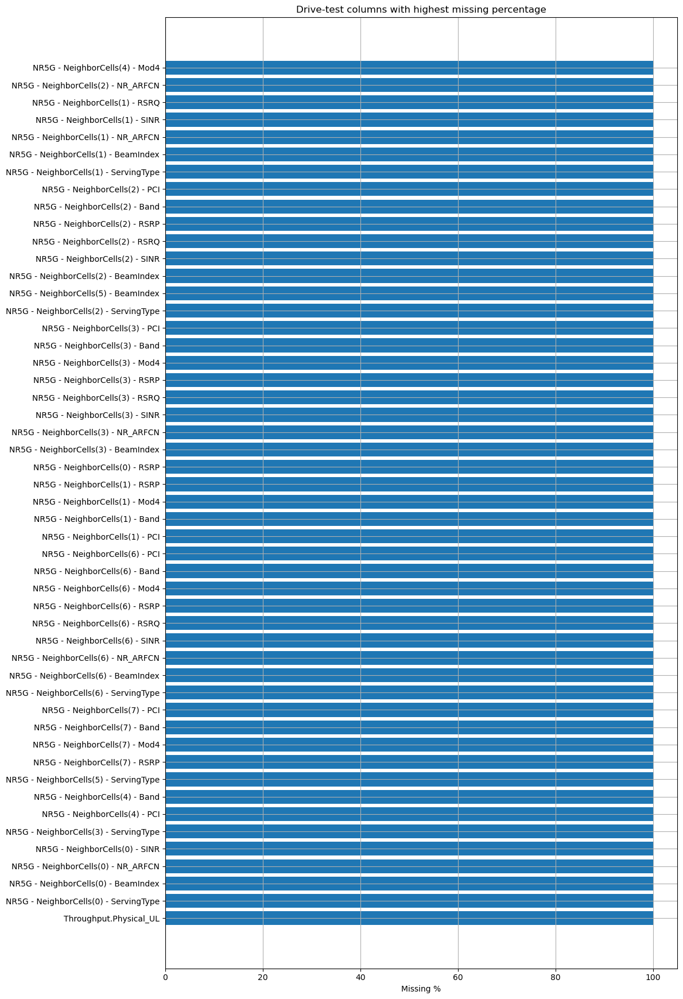

In [52]:
plot_missingness(drive_dictionary, "Drive-test columns with highest missing percentage", top_n=50)

In [18]:
# Duplicate-row overview.
# Exact full duplicate checks can be memory-heavy on a 707 MB file, so they are optional.
if RUN_FULL_DUPLICATE_CHECK:
    duplicate_count = drive_df.duplicated().sum()
    print("Duplicate full rows:", f"{duplicate_count:,}")
    print("Duplicate percentage:", round(duplicate_count / max(len(drive_df), 1) * 100, 4), "%")

    if duplicate_count > 0:
        display(drive_df[drive_df.duplicated(keep=False)].head(20))
else:
    duplicate_count_sample = drive_sample.duplicated().sum()
    print("Full duplicate check skipped for speed.")
    print("Duplicate rows in EDA sample:", f"{duplicate_count_sample:,}")
    print("Sample duplicate percentage:", round(duplicate_count_sample / max(len(drive_sample), 1) * 100, 4), "%")
    print("Set RUN_FULL_DUPLICATE_CHECK=True in the configuration cell if you need exact full duplicate counts.")

Full duplicate check skipped for speed.
Duplicate rows in EDA sample: 0
Sample duplicate percentage: 0.0 %
Set RUN_FULL_DUPLICATE_CHECK=True in the configuration cell if you need exact full duplicate counts.


# 7. Numeric and categorical exploration

This section separates numeric columns from categorical/object columns. For telecom drive-test data, numeric columns usually contain:

- radio KPIs: RSRP, RSRQ, SINR, RSSI,
- throughput and latency,
- frequency/ARFCN,
- PCI/RSI values,
- coordinates,
- distance/speed/altitude.

In [19]:
numeric_cols = drive_df.select_dtypes(include=[np.number]).columns.tolist()
non_numeric_cols = [c for c in drive_df.columns if c not in numeric_cols]

print("Numeric columns:", len(numeric_cols))
print("Non-numeric columns:", len(non_numeric_cols))

display(pd.DataFrame({"numeric_columns": numeric_cols}))
display(pd.DataFrame({"non_numeric_columns": non_numeric_cols}))

Numeric columns: 1187
Non-numeric columns: 178


,numeric_columns
0,imsi
1,LTE - PrimaryCell - PCell_CQI
2,LTE - PrimaryCell - PCell_PCI
3,LTE - PrimaryCell - PCell_BLER
4,LTE - PrimaryCell - PCell_Band
...,...
1182,LTE - NeighborCells(42) - Band
1183,LTE - NeighborCells(42) - Mod3
1184,LTE - NeighborCells(42) - RSRP
1185,LTE - NeighborCells(42) - RSRQ


,non_numeric_columns
0,id
1,timestamp
2,LTE - PrimaryCell - PCell_TransMode
3,LTE - PrimaryCell - PCell_Modulation_CW0
4,LTE - PrimaryCell - PCell_Modulation_CW1
...,...
173,NR5G - NeighborCells(13) - Band
174,NR5G - NeighborCells(13) - ServingType
175,WCDMA - WCDMACellsTable(23) - Set_Type
176,GSM - NeighborCells(12) - ServType


In [20]:
# Numeric summary on sample for speed.
numeric_summary = drive_sample[numeric_cols].describe(percentiles=[0.01, 0.05, 0.25, 0.5, 0.75, 0.95, 0.99]).T if numeric_cols else pd.DataFrame()
display(numeric_summary)
save_table(numeric_summary.reset_index().rename(columns={"index": "column"}), "drive_test_numeric_summary_sample.csv")

,count,mean,std,min,1%,5%,25%,50%,75%,95%,99%,max
imsi,50000.0,5.420200e+14,643.818938,5.420200e+14,5.420200e+14,5.420200e+14,5.420200e+14,5.420200e+14,5.420200e+14,5.420200e+14,5.420200e+14,5.420200e+14
LTE - PrimaryCell - PCell_CQI,28795.0,9.660566e+00,2.973117,1.000000e+00,4.000000e+00,5.000000e+00,7.000000e+00,1.000000e+01,1.200000e+01,1.400000e+01,1.500000e+01,1.500000e+01
LTE - PrimaryCell - PCell_PCI,28983.0,2.463790e+02,122.873886,0.000000e+00,5.000000e+01,1.130000e+02,1.450000e+02,1.840000e+02,3.510000e+02,4.690000e+02,4.950000e+02,4.970000e+02
LTE - PrimaryCell - PCell_BLER,28928.0,6.390089e+00,5.562488,0.000000e+00,0.000000e+00,0.000000e+00,2.645161e+00,5.513064e+00,9.123941e+00,1.484213e+01,2.500000e+01,1.000000e+02
LTE - PrimaryCell - PCell_Band,28983.0,2.912014e+01,17.341293,1.000000e+00,1.000000e+00,1.000000e+00,3.000000e+00,4.100000e+01,4.100000e+01,4.100000e+01,4.100000e+01,4.100000e+01
...,...,...,...,...,...,...,...,...,...,...,...,...
LTE - NeighborCells(42) - Band,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LTE - NeighborCells(42) - Mod3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LTE - NeighborCells(42) - RSRP,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LTE - NeighborCells(42) - RSRQ,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Saved: EDA_Outputs\drive_test_numeric_summary_sample.csv


WindowsPath('EDA_Outputs/drive_test_numeric_summary_sample.csv')

Likely numeric KPI columns selected for plotting:


,column
0,LTE - SecondaryCell 1 Radio - SCell1_RSRP
1,LTE - SecondaryCell 2 Radio - SCell2_RSRP
2,LTE - NeighborCells(0) - RSRP
3,LTE - NeighborCells(1) - RSRP
4,LTE - PrimaryCell Radio - RSRP
...,...
518,WCDMA - WCDMACellsTable(23) - UARFCN
519,GSM - NeighborCells(12) - Band
520,GSM - NeighborCells(12) - ARFCN
521,LTE - NeighborCells(42) - Band


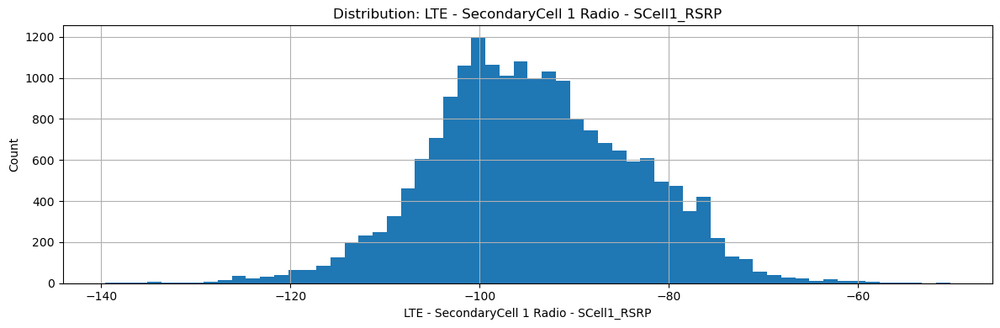

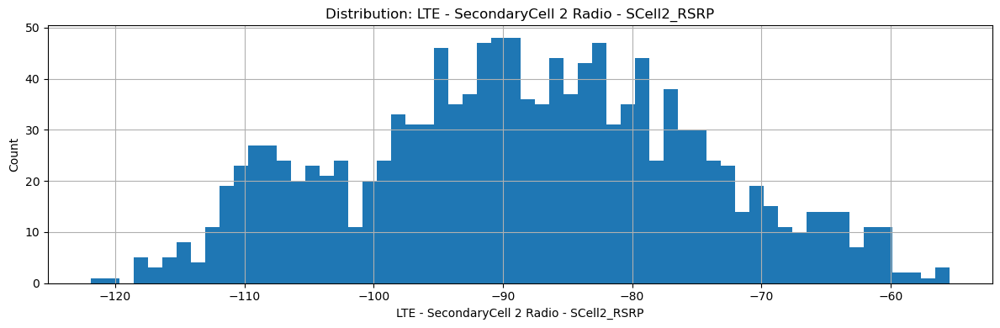

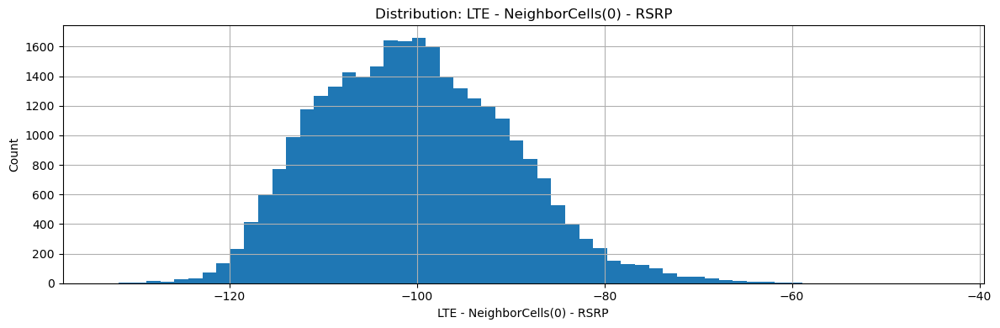

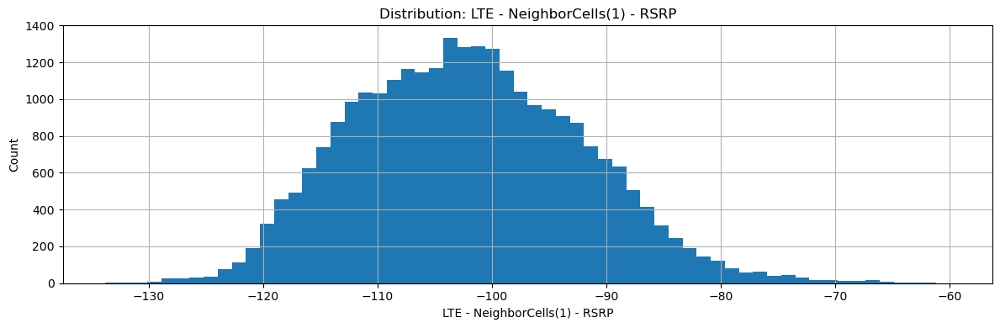

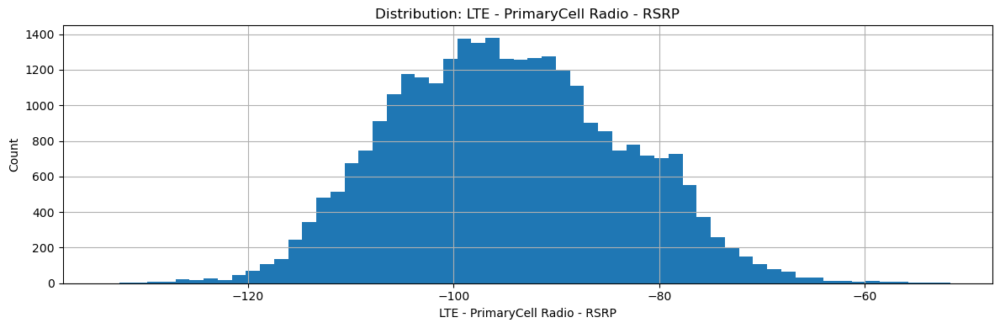

...

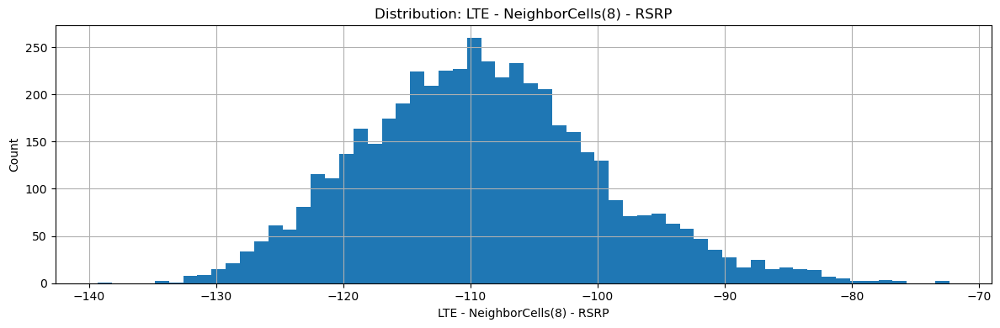

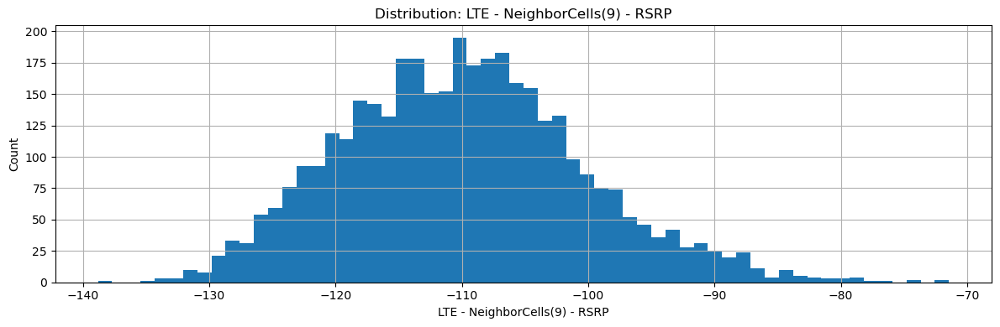

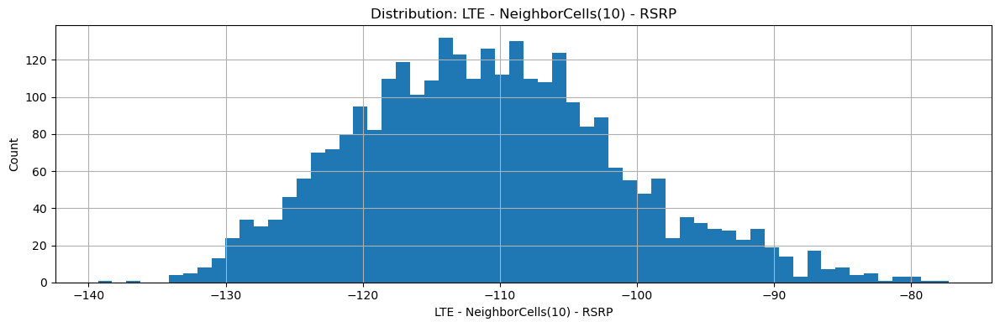

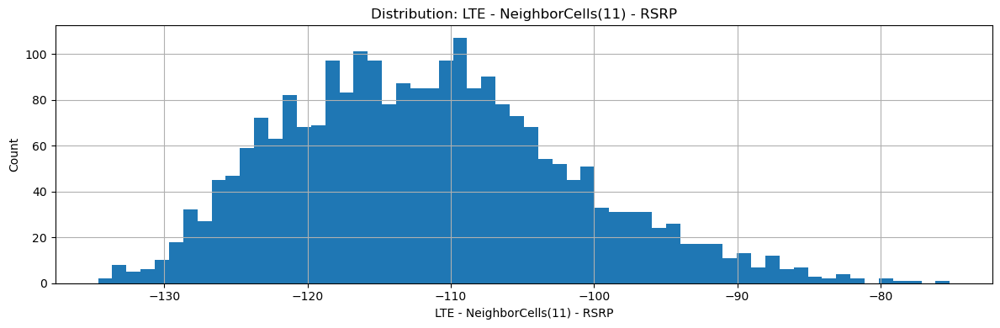

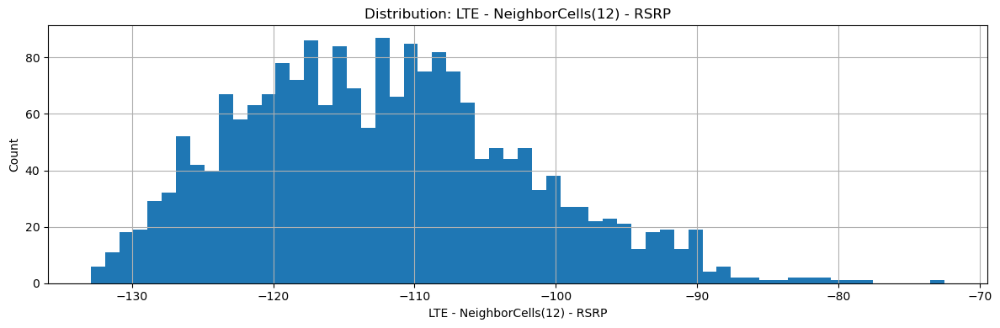

In [21]:
# Plot likely telecom KPI distributions first, then other numeric columns.
likely_kpi_cols = []
for group in ["RSRP", "RSRQ", "SINR/SNR", "RSSI", "throughput/speed", "PCI", "RSI", "ARFCN/frequency/band"]:
    likely_kpi_cols.extend([c for c in drive_column_groups.get(group, []) if c in numeric_cols])

# Preserve order and remove duplicates
likely_kpi_cols = list(dict.fromkeys(likely_kpi_cols))

print("Likely numeric KPI columns selected for plotting:")
display(pd.DataFrame({"column": likely_kpi_cols}))

plot_numeric_distributions(drive_sample, likely_kpi_cols if likely_kpi_cols else numeric_cols, bins=60, max_cols=16)

Likely categorical/identity columns selected for top-value plots:


,column
0,LTE - PrimaryCell - PCell_CQI
1,LTE - PrimaryCell - PCell_PCI
2,LTE - PrimaryCell - PCell_BLER
3,LTE - PrimaryCell - PCell_Band
4,LTE - PrimaryCell - PCell_CQI_CW0
...,...
1038,GSM - DedicatedChannels(4) - ARFCN
1039,NR5G - Serving(0) - Band
1040,NR5G - Serving(0) - NR_ARFCN
1041,NR5G - Data_Performance - Total_Bandwidth_DL


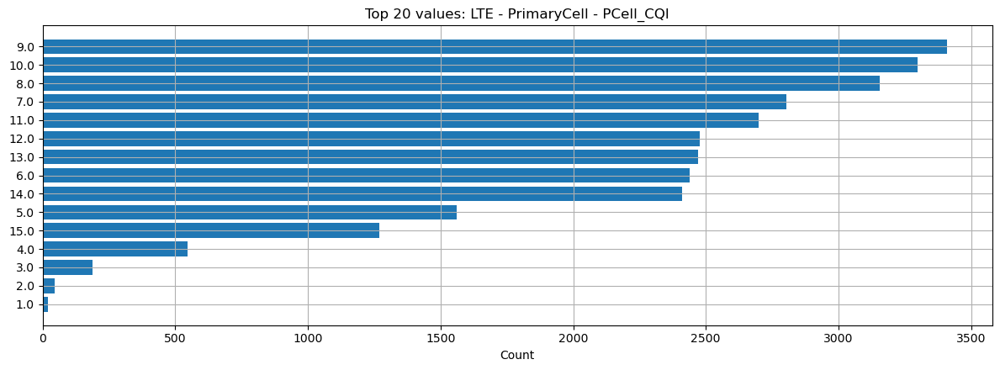

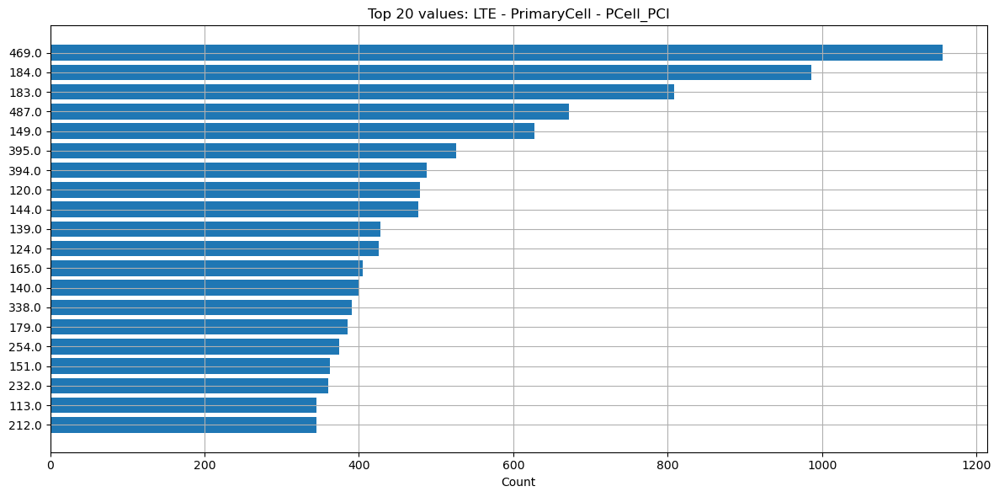

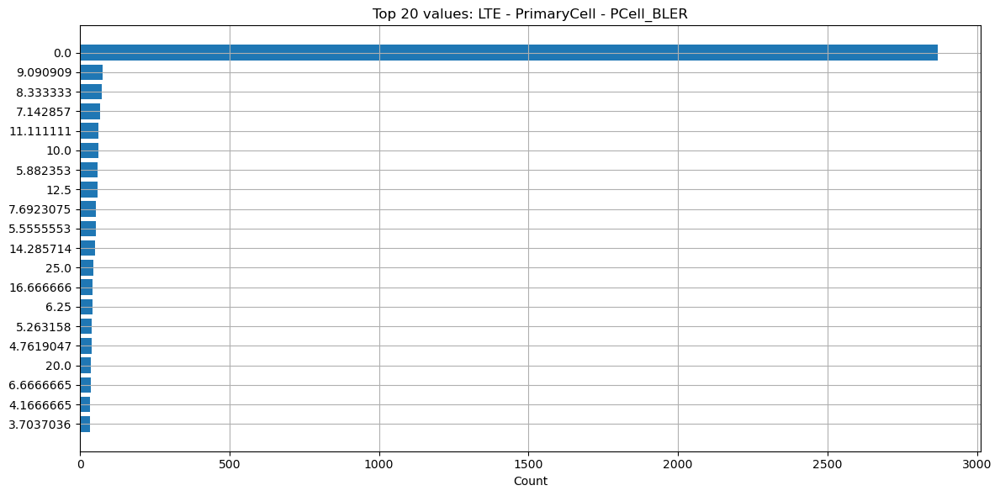

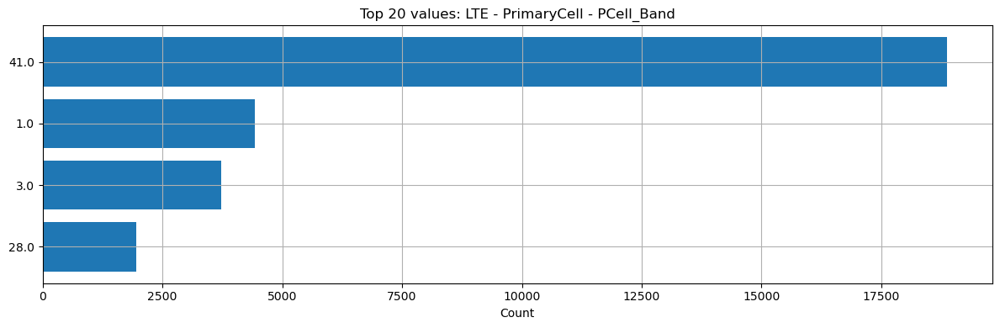

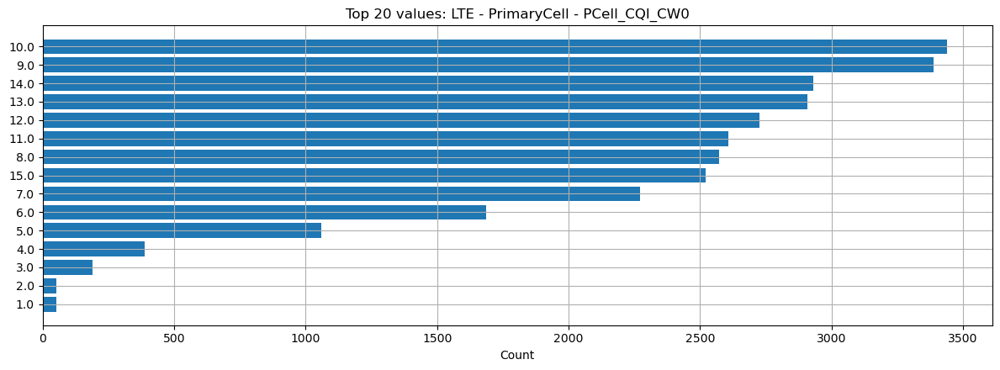

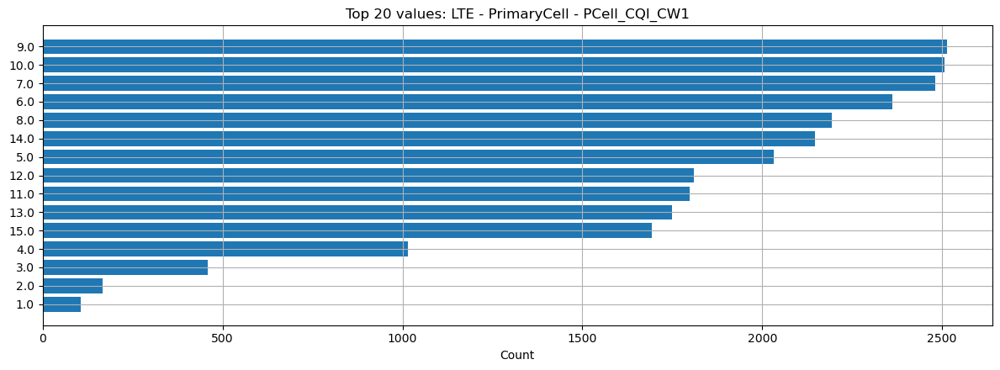

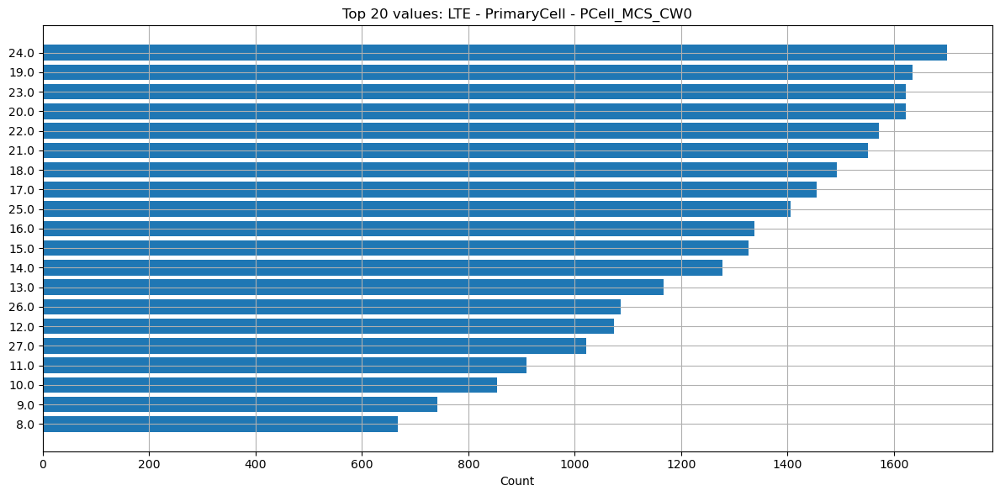

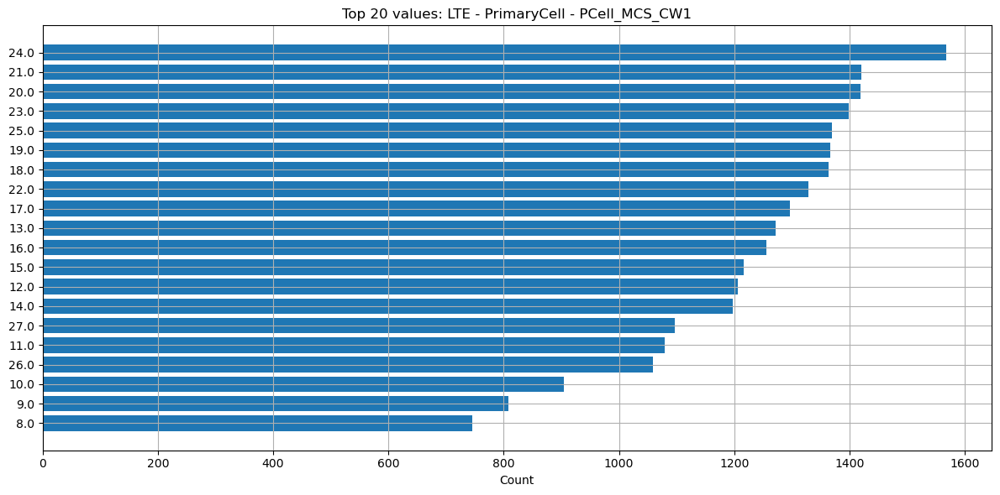

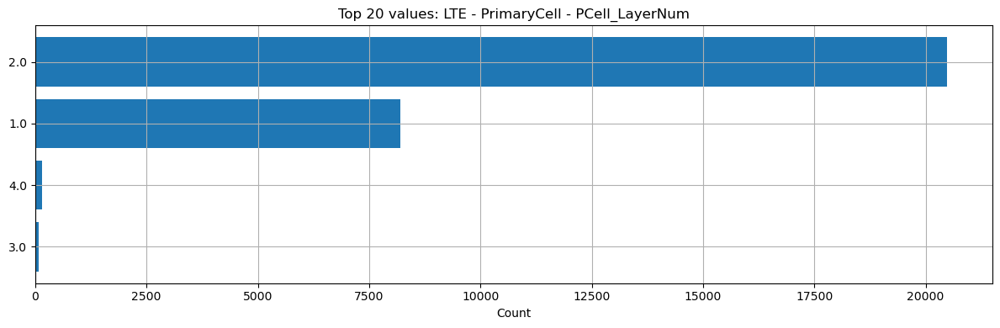

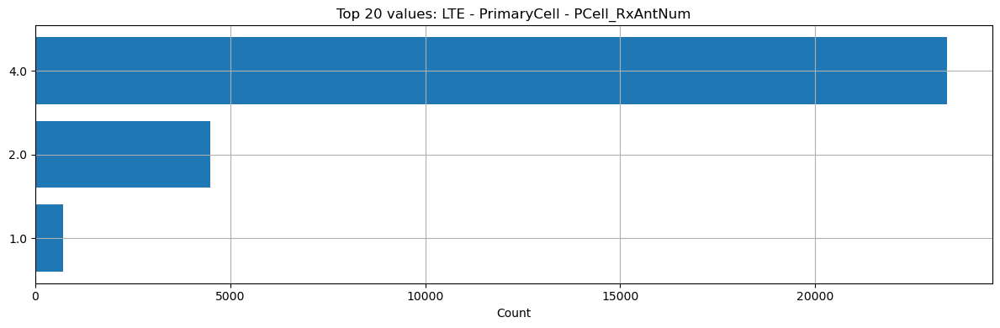

In [22]:
# Categorical top-value exploration for important identity/event columns.
likely_cat_cols = []
for group in ["site/cell identity", "handover/events", "time/date", "ARFCN/frequency/band"]:
    likely_cat_cols.extend([c for c in drive_column_groups.get(group, []) if c in drive_df.columns])
likely_cat_cols = list(dict.fromkeys(likely_cat_cols))

print("Likely categorical/identity columns selected for top-value plots:")
display(pd.DataFrame({"column": likely_cat_cols}))

plot_categorical_top_values(drive_sample, likely_cat_cols, top_n=20, max_cols=10)

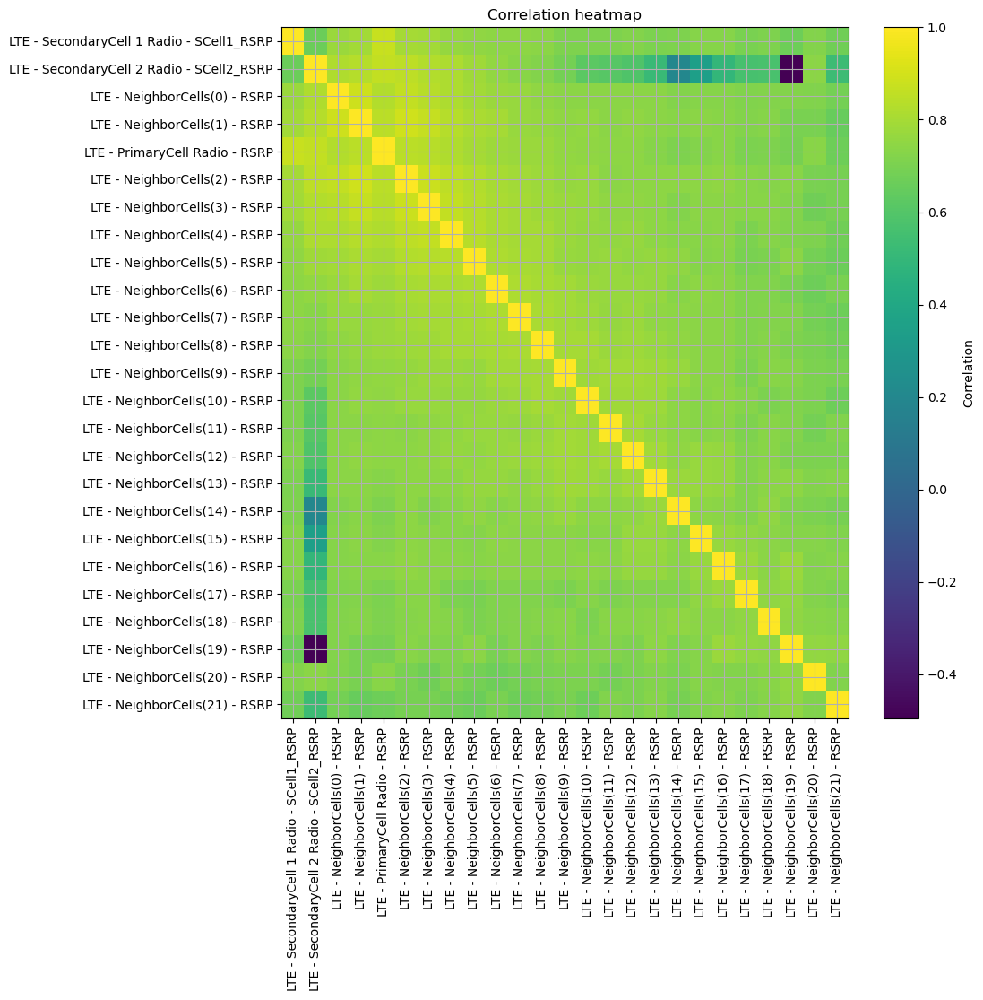

Saved: EDA_Outputs\drive_test_correlation_sample.csv


In [23]:
# Correlation between key numeric fields.
# This is useful for finding relationships such as RSRP vs SINR, throughput vs SINR, distance vs RSRP, etc.
corr_cols = likely_kpi_cols if len(likely_kpi_cols) >= 2 else numeric_cols
corr = plot_correlation_heatmap(drive_sample, corr_cols, max_cols=25)
if not corr.empty:
    save_table(corr.reset_index().rename(columns={"index": "column"}), "drive_test_correlation_sample.csv")

# 8. Timestamp and route exploration

Drive-test analysis becomes much more powerful when a timestamp column exists. It enables:

- time-series plots,
- route progression analysis,
- handover sequence analysis,
- before/after comparison,
- rolling window anomaly detection.

This section tries to detect timestamp columns automatically. After running it, choose the best timestamp column if multiple candidates appear.

In [24]:
datetime_candidates = detect_datetime_columns(drive_df, drive_sample)
display(datetime_candidates)
save_table(datetime_candidates, "drive_test_datetime_candidates.csv")

,column,dtype,name_hint,parse_success_pct,sample_min,sample_max
0,timestamp,"datetime64[ns, UTC+02:00]",True,100.00,2025-08-25 02:13:29+02:00,2025-08-29 00:36:44+02:00
5,Activity.Start TimeStamp,object,True,100.00,2025-08-25 02:13:41.754000+02:00,2025-08-29 00:34:47.709000+02:00
6,Activity.End TimeStamp,object,True,100.00,2025-08-25 02:15:24.901000+02:00,2025-08-29 00:36:44.778000+02:00
16,Events.Timestamp,object,True,36.29,2025-08-25 02:13:41.953000+02:00,2025-08-29 00:36:36.174000+02:00
4,Activity.DNS Resolution Time,float64,True,1.41,2174-01-01 00:00:00,2200-01-01 00:00:00
1,PCAP.dns_time,int64,True,0.00,NaT,NaT
2,PCAP.TCP_window_update,int64,True,0.00,NaT,NaT
3,Activity.TCP Window Update,float64,True,0.00,NaT,NaT
7,Extra_KPIs.MO Call Setup Time,float64,True,0.00,NaT,NaT
8,Extra_KPIs.MO CSFB Return Time,float64,True,0.00,NaT,NaT


Saved: EDA_Outputs\drive_test_datetime_candidates.csv


WindowsPath('EDA_Outputs/drive_test_datetime_candidates.csv')

In [25]:
# Choose the best timestamp column automatically, but review the result.
TIME_COL = datetime_candidates.iloc[0]["column"] if not datetime_candidates.empty else None
print("Selected TIME_COL:", TIME_COL)

if TIME_COL is not None:
    drive_time_sample = add_parsed_datetime(drive_sample, TIME_COL, "time_parsed")
    display(drive_time_sample[[TIME_COL, "time_parsed"]].head(10))
    print("Time coverage in sample:")
    print("Min:", drive_time_sample["time_parsed"].min())
    print("Max:", drive_time_sample["time_parsed"].max())
    print("Valid parsed %:", round(drive_time_sample["time_parsed"].notna().mean() * 100, 2), "%")
else:
    print("No timestamp column detected automatically. Set TIME_COL manually if needed.")

Selected TIME_COL: timestamp


,timestamp,time_parsed
123850,2025-08-25 04:22:27+02:00,2025-08-25 04:22:27+02:00
178859,2025-08-28 04:37:32+02:00,2025-08-28 04:37:32+02:00
116696,2025-08-25 02:19:34+02:00,2025-08-25 02:19:34+02:00
172627,2025-08-28 02:41:54+02:00,2025-08-28 02:41:54+02:00
117993,2025-08-25 02:41:36+02:00,2025-08-25 02:41:36+02:00
157678,2025-08-27 02:54:16+02:00,2025-08-27 02:54:16+02:00
180694,2025-08-29 00:24:12+02:00,2025-08-29 00:24:12+02:00
154661,2025-08-27 01:49:20+02:00,2025-08-27 01:49:20+02:00
153588,2025-08-27 01:30:27+02:00,2025-08-27 01:30:27+02:00
157987,2025-08-27 02:59:21+02:00,2025-08-27 02:59:21+02:00


Time coverage in sample:
Min: 2025-08-25 02:13:29+02:00
Max: 2025-08-29 00:36:44+02:00
Valid parsed %: 100.0 %


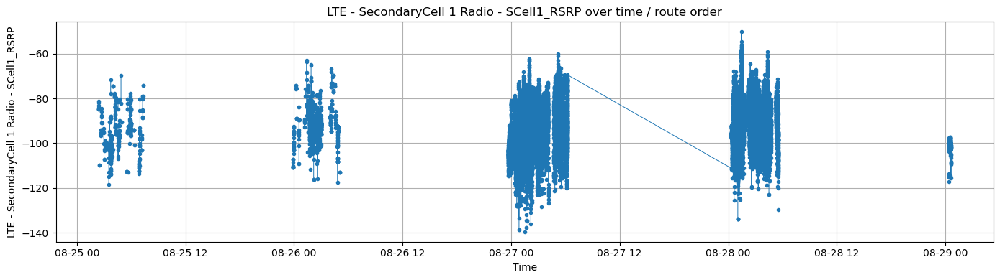

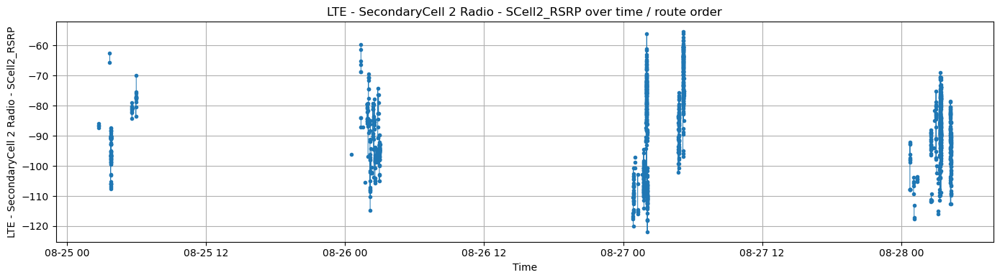

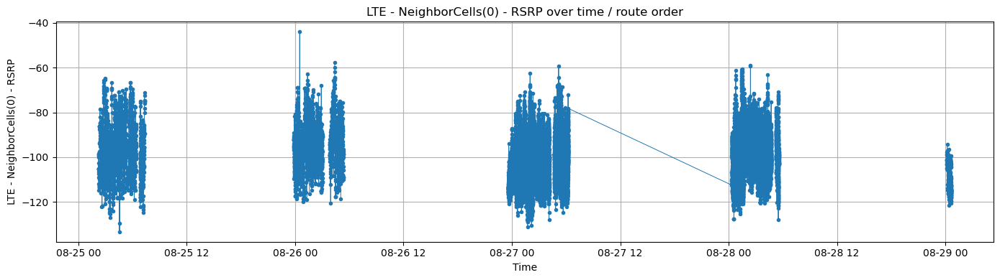

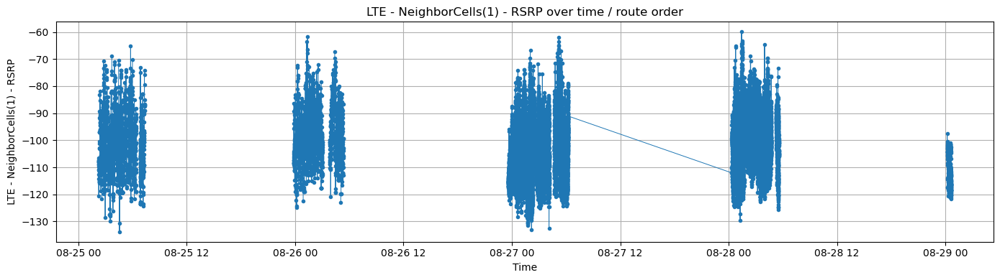

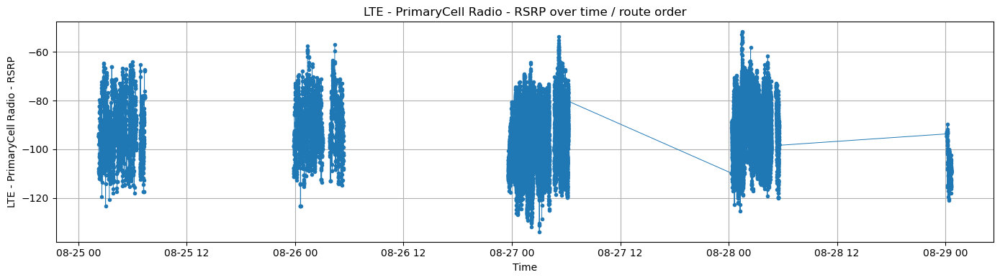

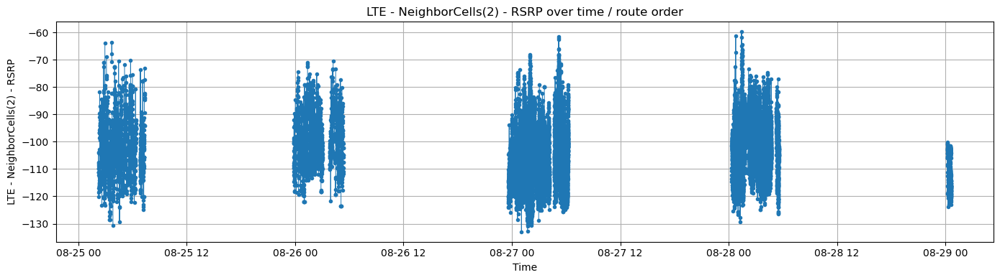

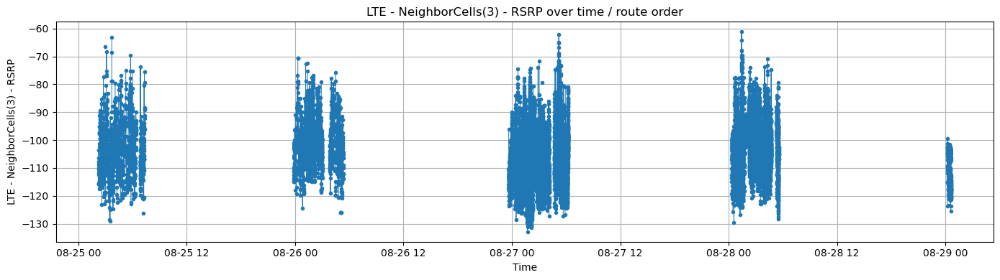

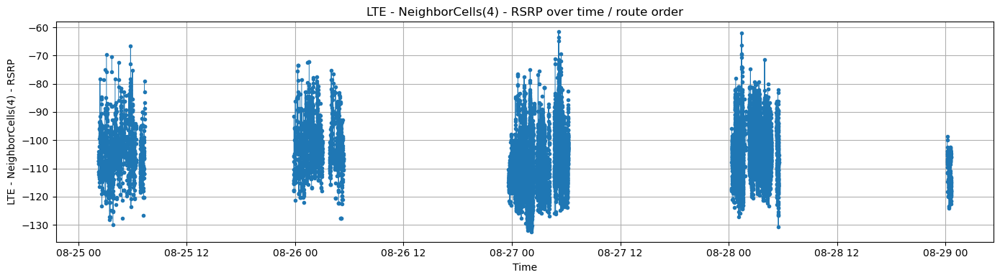

In [26]:
# Time-series plotting for selected KPIs.
if TIME_COL is not None and likely_kpi_cols:
    temp = add_parsed_datetime(drive_sample, TIME_COL, "time_parsed").dropna(subset=["time_parsed"])
    temp = temp.sort_values("time_parsed")
    for col in likely_kpi_cols[:8]:
        if col in temp.columns and pd.api.types.is_numeric_dtype(temp[col]):
            plt.figure(figsize=(14, 4))
            plt.plot(temp["time_parsed"], temp[col], marker=".", linewidth=0.7)
            plt.title(f"{col} over time / route order")
            plt.xlabel("Time")
            plt.ylabel(col)
            plt.tight_layout()
            plt.show()
else:
    print("Time-series plotting skipped because no TIME_COL or likely KPI columns were detected.")

# 9. Coordinate and map exploration

Coordinates allow you to connect measurements to the planning file. This is the first step toward:

- coverage heatmaps,
- nearest planned site comparison,
- overshooting detection,
- azimuth/sector mismatch checks,
- planning radius validation.

The notebook attempts to detect latitude and longitude columns automatically.

In [27]:
LAT_COL = choose_first_column(drive_column_groups, "latitude")
LON_COL = choose_first_column(drive_column_groups, "longitude")

print("Selected LAT_COL:", LAT_COL)
print("Selected LON_COL:", LON_COL)

if LAT_COL and LON_COL:
    coord_preview = drive_df[[LAT_COL, LON_COL]].dropna().head(10)
    display(coord_preview)
    print("Coordinate rows available:", f"{drive_df[[LAT_COL, LON_COL]].dropna().shape[0]:,}")
else:
    print("Latitude/longitude columns were not detected automatically. Set LAT_COL and LON_COL manually if needed.")

Selected LAT_COL: Location - Latitude
Selected LON_COL: Location - Longitude


,Location - Latitude,Location - Longitude
116423,-17.815987,177.395598
116424,-17.815987,177.395598
116425,-17.815987,177.395598
116426,-17.815987,177.395598
116427,-17.815987,177.395597
116428,-17.815987,177.395598
116429,-17.815987,177.395598
116430,-17.815987,177.395597
116431,-17.815987,177.395598
116432,-17.815987,177.395597


Coordinate rows available: 64,949


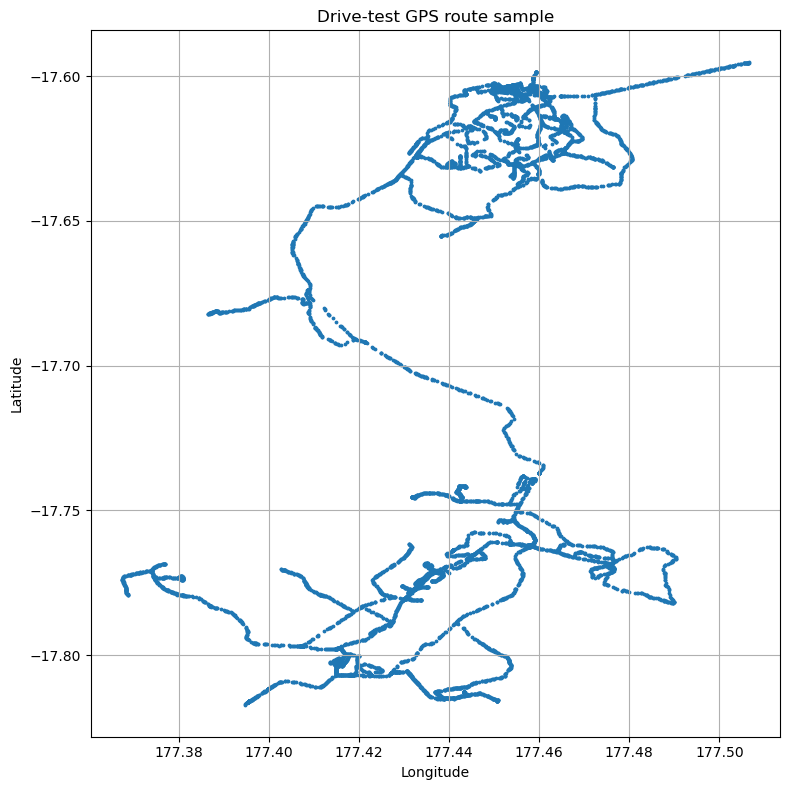

In [28]:
# Scatter plot of the drive route.
if LAT_COL and LON_COL:
    route = drive_map_sample.dropna(subset=[LAT_COL, LON_COL]).copy()
    route[LAT_COL] = pd.to_numeric(route[LAT_COL], errors="coerce")
    route[LON_COL] = pd.to_numeric(route[LON_COL], errors="coerce")
    route = route.dropna(subset=[LAT_COL, LON_COL])

    plt.figure(figsize=(8, 8))
    plt.scatter(route[LON_COL], route[LAT_COL], s=3)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title("Drive-test GPS route sample")
    plt.tight_layout()
    plt.show()
else:
    print("Route scatter skipped because coordinates were not detected.")

In [54]:
# Optional interactive map using folium.
# If folium is not installed, run: pip install folium

def create_drive_map(df: pd.DataFrame, lat_col: str, lon_col: str, value_col: Optional[str] = None, output_name: str = "drive_test_map.html"):
    try:
        import folium
        from folium.plugins import MarkerCluster
    except Exception:
        print("folium is not installed. Install it with: pip install folium")
        return None

    mdf = df.dropna(subset=[lat_col, lon_col]).copy()
    mdf[lat_col] = pd.to_numeric(mdf[lat_col], errors="coerce")
    mdf[lon_col] = pd.to_numeric(mdf[lon_col], errors="coerce")
    mdf = mdf.dropna(subset=[lat_col, lon_col])
    if mdf.empty:
        print("No valid coordinates for map.")
        return None

    center = [mdf[lat_col].median(), mdf[lon_col].median()]
    fmap = folium.Map(location=center, zoom_start=12, tiles="OpenStreetMap")
    cluster = MarkerCluster().add_to(fmap)

    for _, row in mdf.head(MAP_SAMPLE_ROWS).iterrows():
        popup = ""
        if value_col and value_col in mdf.columns:
            popup = f"{value_col}: {row[value_col]}"
        folium.CircleMarker(
            location=[row[lat_col], row[lon_col]],
            radius=2,
            fill=True,
            fill_opacity=0.6,
            popup=popup,
        ).add_to(cluster)

    out_path = OUTPUT_DIR / output_name
    fmap.save(out_path)
    print("Saved map:", out_path)
    return fmap

if LAT_COL and LON_COL:
    value_col = likely_kpi_cols[0] if likely_kpi_cols else None
    drive_map = create_drive_map(drive_map_sample, LAT_COL, LON_COL, value_col=value_col, output_name="drive_test_route_map.html")
    display(drive_map) if drive_map is not None else None
else:
    print("Interactive map skipped because coordinates were not detected.")

Saved map: EDA_Outputs\drive_test_route_map.html


# 10. Telecom KPI quality bins

This section creates starting-point quality categories for common radio KPIs.

These thresholds are **not universal**. They are practical initial bins for exploration and should be adjusted according to your operator, vendor, band, bandwidth, test scenario, and project objective.

Typical starting points:

| KPI | Excellent | Good | Fair | Poor |
|---|---:|---:|---:|---:|
| RSRP | `>= -80 dBm` | `[-90, -80)` | `[-100, -90)` | `< -100` |
| RSRQ | `>= -10 dB` | `[-15, -10)` | `[-20, -15)` | `< -20` |
| SINR | `>= 20 dB` | `[13, 20)` | `[0, 13)` | `< 0` |

Use these bins to identify coverage holes, quality/interference issues, and throughput degradation causes.

In [30]:
def bin_rsrp(x):
    if pd.isna(x): return np.nan
    if x >= -80: return "Excellent"
    if x >= -90: return "Good"
    if x >= -100: return "Fair"
    return "Poor"


def bin_rsrq(x):
    if pd.isna(x): return np.nan
    if x >= -10: return "Excellent"
    if x >= -15: return "Good"
    if x >= -20: return "Fair"
    return "Poor"


def bin_sinr(x):
    if pd.isna(x): return np.nan
    if x >= 20: return "Excellent"
    if x >= 13: return "Good"
    if x >= 0: return "Fair"
    return "Poor"


def add_kpi_bins(df: pd.DataFrame, groups: Dict[str, List[str]]) -> pd.DataFrame:
    out = df.copy()
    for col in groups.get("RSRP", []):
        if col in out.columns:
            out[f"{col}_quality_bin"] = pd.to_numeric(out[col], errors="coerce").map(bin_rsrp)
    for col in groups.get("RSRQ", []):
        if col in out.columns:
            out[f"{col}_quality_bin"] = pd.to_numeric(out[col], errors="coerce").map(bin_rsrq)
    for col in groups.get("SINR/SNR", []):
        if col in out.columns:
            out[f"{col}_quality_bin"] = pd.to_numeric(out[col], errors="coerce").map(bin_sinr)
    return out


drive_kpi_sample = add_kpi_bins(drive_sample, drive_column_groups)
quality_cols = [c for c in drive_kpi_sample.columns if c.endswith("_quality_bin")]

print("Quality bin columns created:", quality_cols)
for col in quality_cols[:12]:
    print("\n", col)
    display(drive_kpi_sample[col].value_counts(dropna=False).to_frame("count"))

Quality bin columns created: ['LTE - SecondaryCell 1 Radio - SCell1_RSRP_quality_bin', 'LTE - SecondaryCell 2 Radio - SCell2_RSRP_quality_bin', 'LTE - NeighborCells(0) - RSRP_quality_bin', 'LTE - NeighborCells(1) - RSRP_quality_bin', 'LTE - PrimaryCell Radio - RSRP_quality_bin', 'LTE - NeighborCells(2) - RSRP_quality_bin', 'LTE - NeighborCells(3) - RSRP_quality_bin', 'LTE - NeighborCells(4) - RSRP_quality_bin', 'LTE - NeighborCells(5) - RSRP_quality_bin', 'LTE - NeighborCells(6) - RSRP_quality_bin', 'LTE - NeighborCells(7) - RSRP_quality_bin', 'LTE - NeighborCells(8) - RSRP_quality_bin', 'LTE - NeighborCells(9) - RSRP_quality_bin', 'LTE - NeighborCells(10) - RSRP_quality_bin', 'LTE - NeighborCells(11) - RSRP_quality_bin', 'LTE - NeighborCells(12) - RSRP_quality_bin', 'LTE - NeighborCells(13) - RSRP_quality_bin', 'LTE - NeighborCells(14) - RSRP_quality_bin', 'LTE - NeighborCells(15) - RSRP_quality_bin', 'LTE - NeighborCells(16) - RSRP_quality_bin', 'LTE - NeighborCells(17) - RSRP_qualit

,count
LTE - SecondaryCell 1 Radio - SCell1_RSRP_quality_bin,
NaN,30890
Fair,6953
Poor,5923
Good,4326
Excellent,1908



 LTE - SecondaryCell 2 Radio - SCell2_RSRP_quality_bin


,count
LTE - SecondaryCell 2 Radio - SCell2_RSRP_quality_bin,
NaN,48674
Excellent,366
Good,356
Fair,329
Poor,275



 LTE - NeighborCells(0) - RSRP_quality_bin


,count
LTE - NeighborCells(0) - RSRP_quality_bin,
NaN,21100
Poor,15255
Fair,9015
Good,3843
Excellent,787



 LTE - NeighborCells(1) - RSRP_quality_bin


,count
LTE - NeighborCells(1) - RSRP_quality_bin,
NaN,22869
Poor,16142
Fair,7687
Good,2855
Excellent,447



 LTE - PrimaryCell Radio - RSRP_quality_bin


,count
LTE - PrimaryCell Radio - RSRP_quality_bin,
NaN,21017
Poor,9800
Fair,9575
Good,6490
Excellent,3118



 LTE - NeighborCells(2) - RSRP_quality_bin


,count
LTE - NeighborCells(2) - RSRP_quality_bin,
NaN,27153
Poor,15191
Fair,5501
Good,1861
Excellent,294



 LTE - NeighborCells(3) - RSRP_quality_bin


,count
LTE - NeighborCells(3) - RSRP_quality_bin,
NaN,31031
Poor,13236
Fair,4276
Good,1276
Excellent,181



 LTE - NeighborCells(4) - RSRP_quality_bin


,count
LTE - NeighborCells(4) - RSRP_quality_bin,
NaN,35322
Poor,10890
Fair,2950
Good,736
Excellent,102



 LTE - NeighborCells(5) - RSRP_quality_bin


,count
LTE - NeighborCells(5) - RSRP_quality_bin,
NaN,38459
Poor,8965
Fair,2088
Good,432
Excellent,56



 LTE - NeighborCells(6) - RSRP_quality_bin


,count
LTE - NeighborCells(6) - RSRP_quality_bin,
NaN,41389
Poor,6906
Fair,1398
Good,277
Excellent,30



 LTE - NeighborCells(7) - RSRP_quality_bin


,count
LTE - NeighborCells(7) - RSRP_quality_bin,
NaN,43480
Poor,5379
Fair,939
Good,189
Excellent,13



 LTE - NeighborCells(8) - RSRP_quality_bin


,count
LTE - NeighborCells(8) - RSRP_quality_bin,
NaN,45120
Poor,4125
Fair,607
Good,137
Excellent,11


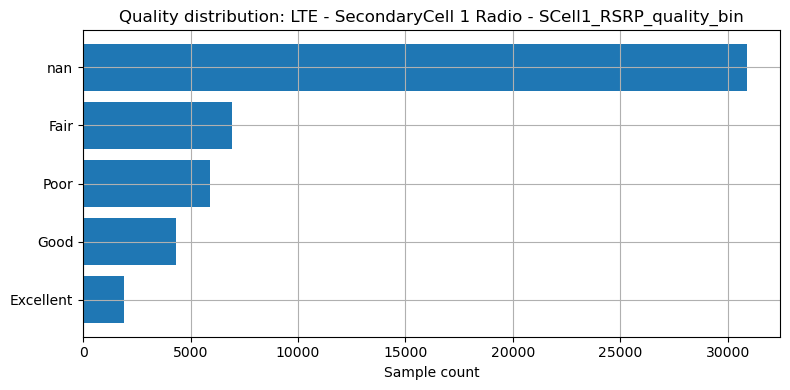

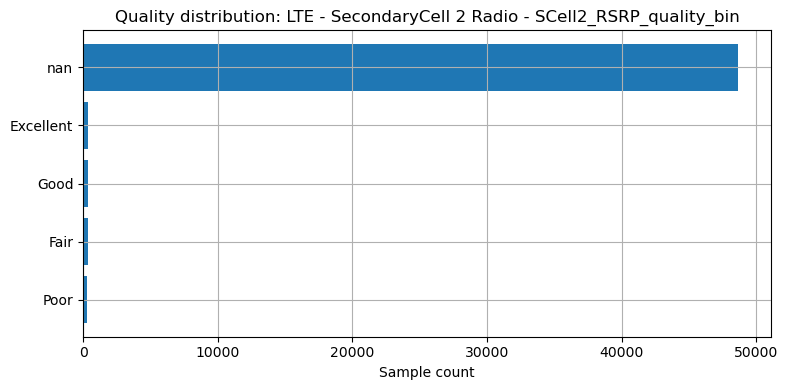

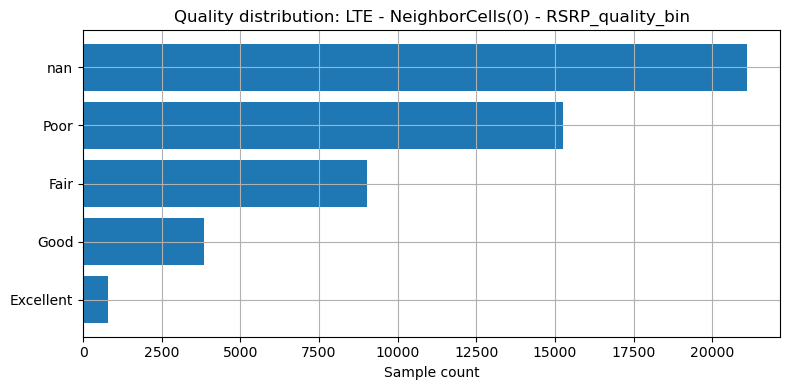

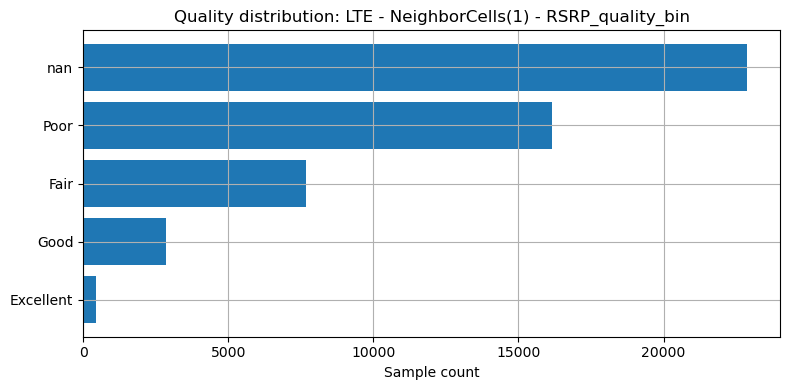

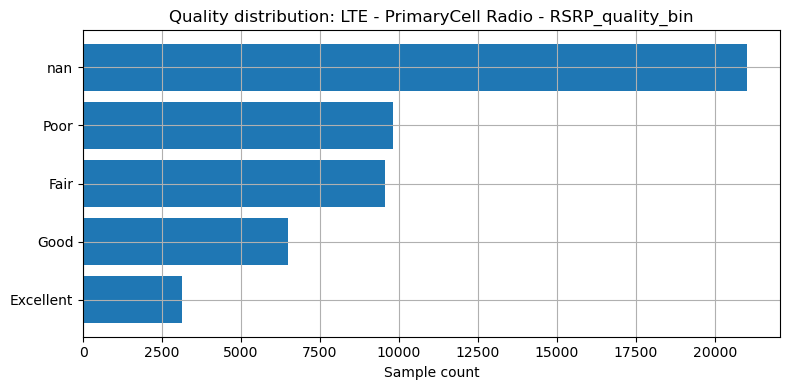

...

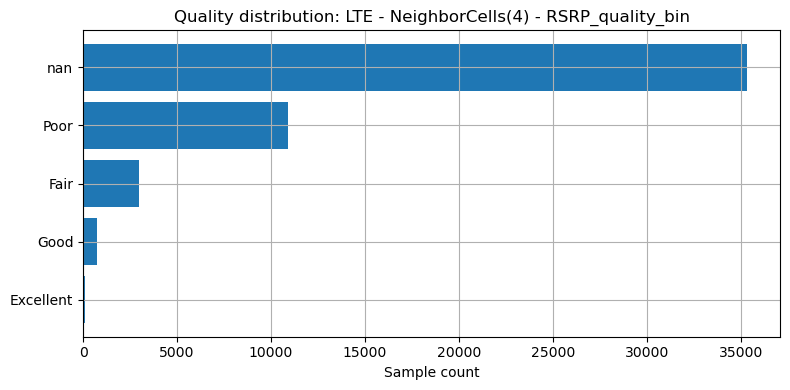

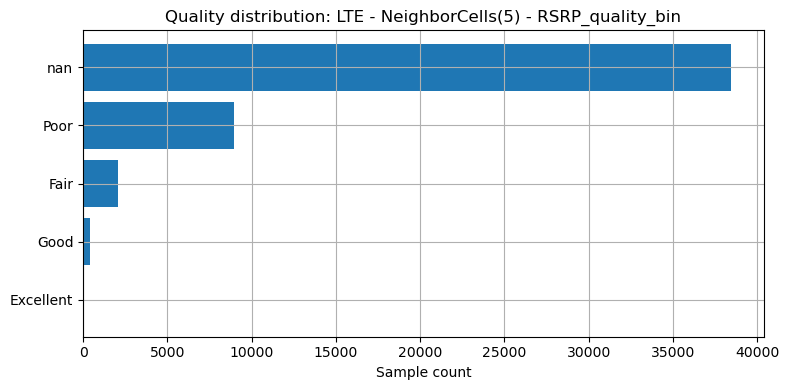

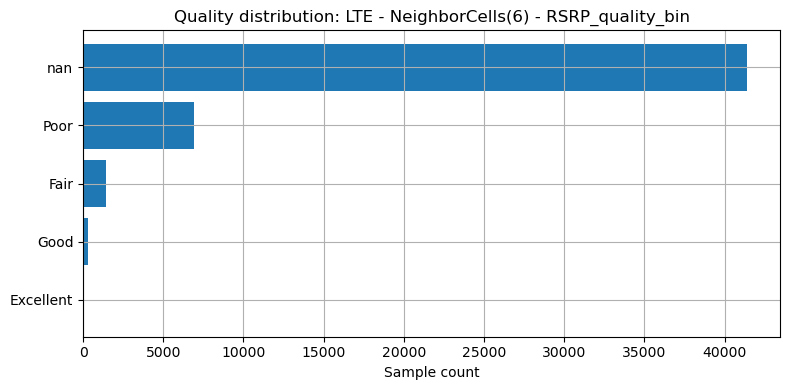

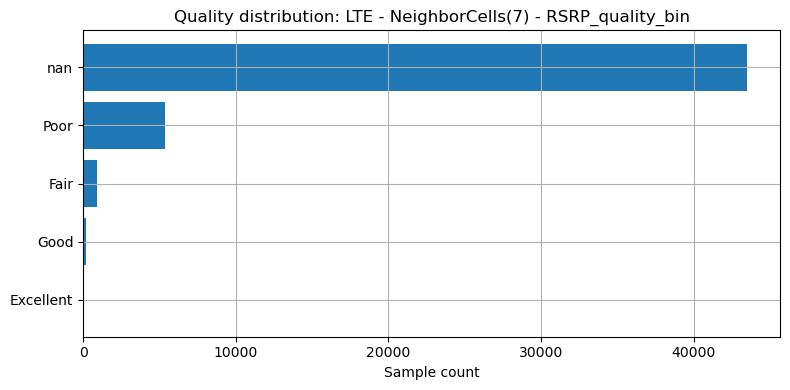

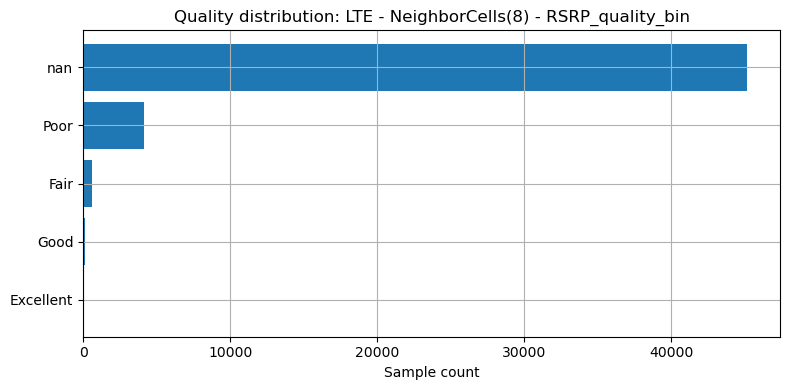

In [31]:
# Plot quality bin distributions.
for col in quality_cols[:12]:
    vc = drive_kpi_sample[col].value_counts(dropna=False).sort_values()
    plt.figure(figsize=(8, 4))
    plt.barh(vc.index.astype(str), vc.values)
    plt.title(f"Quality distribution: {col}")
    plt.xlabel("Sample count")
    plt.tight_layout()
    plt.show()

# 11. Load and explore the planning workbook

The planning workbook is much smaller than the drive-test pickle, so we can load all sheets.

The uploaded file has:

- `Planning` sheet: sector-level planned PCI/RSI/mod4/site/location/azimuth/radius data.
- `Stats` sheet: before/after clash statistics.

In [32]:
if not PLANNING_XLSX.exists():
    raise FileNotFoundError(f"Planning workbook not found: {PLANNING_XLSX}")

xls = pd.ExcelFile(PLANNING_XLSX)
print("Planning workbook sheets:", xls.sheet_names)

planning_sheets = {}
for sheet in xls.sheet_names:
    df_sheet = pd.read_excel(PLANNING_XLSX, sheet_name=sheet)
    # Drop completely empty rows/columns while preserving meaningful blanks.
    df_sheet = df_sheet.dropna(how="all").dropna(axis=1, how="all")
    planning_sheets[sheet] = df_sheet
    print(f"\nSheet: {sheet}, shape: {df_sheet.shape}")
    display(df_sheet.head(10))

Planning workbook sheets: ['Planning', 'Stats']

Sheet: Planning, shape: (2554, 14)


,site_sector_ID,siteID,sectors_count,sectorID,Requires_Planning,Azimuth,Latitude,Longitude,Freq Band,Cell Radius,RSI,PCI,Mod4,Unnamed: 15
0,ALX3282-1,ALX3282,3,91,True,45,31.235092,29.956882,N41,7000,NaN,NaN,NaN,NaN
1,ALX3282-2,ALX3282,3,92,True,165,31.235092,29.956882,N41,7000,NaN,NaN,NaN,NaN
2,ALX3282-3,ALX3282,3,93,True,235,31.235092,29.956882,N41,7000,NaN,NaN,NaN,NaN
3,ALX3744-1,ALX3744,4,91,True,90,31.357010,27.224460,N41,7000,NaN,NaN,NaN,NaN
4,ALX3744-2,ALX3744,4,92,True,165,31.357010,27.224460,N41,7000,NaN,NaN,NaN,NaN
5,ALX3744-3,ALX3744,4,93,True,245,31.357010,27.224460,N41,7000,NaN,NaN,NaN,NaN
6,ALX3744-4,ALX3744,4,94,True,330,31.357010,27.224460,N41,7000,NaN,NaN,NaN,NaN
7,ALX6116-1,ALX6116,4,91,True,15,31.356861,27.264692,N41,7000,NaN,NaN,NaN,NaN
8,ALX6116-2,ALX6116,4,92,True,80,31.356861,27.264692,N41,7000,NaN,NaN,NaN,NaN
9,ALX6116-3,ALX6116,4,93,True,200,31.356861,27.264692,N41,7000,NaN,NaN,NaN,NaN



Sheet: Stats, shape: (7, 4)


,CLASH,Clash_Description,BEFORE,AFTER
0,Total Clashes,,819.0,815.0
2,(PCI Collision),Adjacent 1st Neigh PCI clash,0.0,0.0
3,(PCI Confusion),2nd Neigh PCI clash,1.0,1.0
4,,,NaN,NaN
5,(Mod4 Inter-site),Adjacent 1st Neigh mod4 clash,794.0,790.0
6,(Mod4 Intra-site),Adjacent 1st Neigh co-site mod4 clash,24.0,24.0
7,(Mod4 non-adj Intra-site ),Non-Adjacent 1st Neigh co-site mod4 clash,11.0,11.0


In [33]:
planning_df = planning_sheets.get("Planning")
stats_df = planning_sheets.get("Stats")

if planning_df is None:
    # Fallback: use the largest sheet as the planning sheet.
    planning_df = max(planning_sheets.values(), key=lambda d: d.shape[0] * d.shape[1])

show_basic_df_overview(planning_df, "Planning Sheet")
planning_column_groups = display_column_groups(planning_df, "Planning")

===== Planning Sheet =====
Shape: (2554, 14)
Rows: 2,554
Columns: 14
Memory: 676.06 KB
Duplicate rows: skipped for speed (set RUN_FULL_DUPLICATE_CHECK=True to run exact check)


,column_index,column_name,dtype,non_null_count,missing_count,missing_pct
0,1,site_sector_ID,object,2554,0,0.00
1,2,siteID,object,2554,0,0.00
2,3,sectors_count,int64,2554,0,0.00
3,4,sectorID,int64,2554,0,0.00
4,5,Requires_Planning,bool,2554,0,0.00
5,6,Azimuth,int64,2554,0,0.00
6,7,Latitude,float64,2554,0,0.00
7,8,Longitude,float64,2554,0,0.00
8,9,Freq Band,object,2554,0,0.00
9,10,Cell Radius,int64,2554,0,0.00


Telecom-aware column groups for Planning


,group,matched_columns_count,matched_columns
3,site/cell identity,5,"site_sector_ID, siteID, sectors_count, sectorID, Cell Radius"
16,distance/radius,1,Cell Radius
2,longitude,1,Longitude
4,PCI,1,PCI
5,RSI,1,RSI
6,Mod4,1,Mod4
7,ARFCN/frequency/band,1,Freq Band
1,latitude,1,Latitude
15,azimuth/angle,1,Azimuth
12,throughput/speed,0,


In [34]:
planning_dictionary = build_data_dictionary(
    planning_df,
    sample=planning_df,
    name="planning",
    expensive_on_sample=False,
)

display(planning_dictionary)
save_table(planning_dictionary, "planning_data_dictionary.csv")

,dataset,column,dtype,full_non_null_count,full_missing_count,full_missing_pct,sample_unique_count,sample_unique_pct,sample_non_null_examples,stats_source,sample_top_values,sample_min,sample_max,sample_mean,sample_std
0,planning,Unnamed: 15,object,1,2553,99.961,1,100.000,[P],full,{'P': 1},None,None,NaN,NaN
1,planning,PCI,float64,2449,105,4.111,1002,40.915,"[439.0, 294.0, 484.0, 577.0, 367.0]",full,NaN,0.0,1007.0,519.742344,294.610900
2,planning,RSI,float64,2449,105,4.111,219,8.942,"[410.0, 310.0, 465.0, 480.0, 175.0]",full,NaN,0.0,830.0,312.809718,247.563199
3,planning,Mod4,float64,2449,105,4.111,4,0.163,"[3.0, 2.0, 0.0, 1.0, 3.0]",full,NaN,0.0,3.0,1.499796,1.123183
4,planning,site_sector_ID,object,2554,0,0.000,2554,100.000,"[ALX3282-1, ALX3282-2, ALX3282-3, ALX3744-1, ALX3744-2]",full,"{'ALX3282-1': 1, 'SIN4311-1': 1, 'SIN4308-1': 1, 'SIN4308-2': 1, 'SIN4308-3': 1}",None,None,NaN,NaN
5,planning,siteID,object,2554,0,0.000,725,28.387,"[ALX3282, ALX3282, ALX3282, ALX3744, ALX3744]",full,"{'UPP2142': 5, 'UPP0163': 5, 'UPP5912': 4, 'ALX6249': 4, 'ALX6297': 4}",None,None,NaN,NaN
6,planning,Longitude,float64,2554,0,0.000,725,28.387,"[29.956882, 29.956882, 29.956882, 27.22446, 27.22446]",full,NaN,27.22446,34.5169,31.031592,2.088272
7,planning,Latitude,float64,2554,0,0.000,723,28.309,"[31.235092, 31.235092, 31.235092, 31.35701, 31.35701]",full,NaN,23.995,31.35701,29.454667,1.845878
8,planning,Azimuth,int64,2554,0,0.000,72,2.819,"[45, 165, 235, 90, 165]",full,NaN,0,355,169.755286,105.893364
9,planning,sectorID,int64,2554,0,0.000,10,0.392,"[91, 92, 93, 91, 92]",full,NaN,90,194,92.586139,4.980634


Saved: EDA_Outputs\planning_data_dictionary.csv


WindowsPath('EDA_Outputs/planning_data_dictionary.csv')

In [35]:
if stats_df is not None:
    print("Planning Stats sheet:")
    display(stats_df)
    save_table(stats_df, "planning_stats.csv")
else:
    print("No Stats sheet found.")

Planning Stats sheet:


,CLASH,Clash_Description,BEFORE,AFTER
0,Total Clashes,,819.0,815.0
2,(PCI Collision),Adjacent 1st Neigh PCI clash,0.0,0.0
3,(PCI Confusion),2nd Neigh PCI clash,1.0,1.0
4,,,NaN,NaN
5,(Mod4 Inter-site),Adjacent 1st Neigh mod4 clash,794.0,790.0
6,(Mod4 Intra-site),Adjacent 1st Neigh co-site mod4 clash,24.0,24.0
7,(Mod4 non-adj Intra-site ),Non-Adjacent 1st Neigh co-site mod4 clash,11.0,11.0


Saved: EDA_Outputs\planning_stats.csv


# 12. Planning-specific checks

This section checks the planning data itself before comparing it to drive-test observations.

Useful questions:

- Which sectors still require planning?
- Which rows are missing PCI or RSI?
- Is `Mod4` consistent with `PCI % 4`?
- Are there duplicated PCI/RSI values inside the same site?
- Are there possible nearby PCI or Mod4 clashes?

In [36]:
# Normalize expected planning columns.
# These names match the uploaded planning workbook, but the code also uses column detection where possible.
PLAN_SITE_SECTOR_COL = "site_sector_ID" if "site_sector_ID" in planning_df.columns else None
PLAN_SITE_COL = "siteID" if "siteID" in planning_df.columns else choose_first_column(planning_column_groups, "site/cell identity")
PLAN_SECTOR_COL = "sectorID" if "sectorID" in planning_df.columns else None
PLAN_REQUIRES_COL = "Requires_Planning" if "Requires_Planning" in planning_df.columns else None
PLAN_AZIMUTH_COL = "Azimuth" if "Azimuth" in planning_df.columns else choose_first_column(planning_column_groups, "azimuth/angle")
PLAN_LAT_COL = "Latitude" if "Latitude" in planning_df.columns else choose_first_column(planning_column_groups, "latitude")
PLAN_LON_COL = "Longitude" if "Longitude" in planning_df.columns else choose_first_column(planning_column_groups, "longitude")
PLAN_RADIUS_COL = "Cell Radius" if "Cell Radius" in planning_df.columns else choose_first_column(planning_column_groups, "distance/radius")
PLAN_PCI_COL = "PCI" if "PCI" in planning_df.columns else choose_first_column(planning_column_groups, "PCI")
PLAN_RSI_COL = "RSI" if "RSI" in planning_df.columns else choose_first_column(planning_column_groups, "RSI")
PLAN_MOD4_COL = "Mod4" if "Mod4" in planning_df.columns else choose_first_column(planning_column_groups, "Mod4")
PLAN_BAND_COL = "Freq Band" if "Freq Band" in planning_df.columns else choose_first_column(planning_column_groups, "ARFCN/frequency/band")

planning_core_cols = [
    PLAN_SITE_SECTOR_COL, PLAN_SITE_COL, PLAN_SECTOR_COL, PLAN_REQUIRES_COL,
    PLAN_AZIMUTH_COL, PLAN_LAT_COL, PLAN_LON_COL, PLAN_BAND_COL,
    PLAN_RADIUS_COL, PLAN_RSI_COL, PLAN_PCI_COL, PLAN_MOD4_COL,
]
planning_core_cols = [c for c in planning_core_cols if c is not None and c in planning_df.columns]

print("Detected planning core columns:")
for c in planning_core_cols:
    print("-", c)

display(planning_df[planning_core_cols].head(20))

Detected planning core columns:
- site_sector_ID
- siteID
- sectorID
- Requires_Planning
- Azimuth
- Latitude
- Longitude
- Freq Band
- Cell Radius
- RSI
- PCI
- Mod4


,site_sector_ID,siteID,sectorID,Requires_Planning,Azimuth,Latitude,Longitude,Freq Band,Cell Radius,RSI,PCI,Mod4
0,ALX3282-1,ALX3282,91,True,45,31.235092,29.956882,N41,7000,NaN,NaN,NaN
1,ALX3282-2,ALX3282,92,True,165,31.235092,29.956882,N41,7000,NaN,NaN,NaN
2,ALX3282-3,ALX3282,93,True,235,31.235092,29.956882,N41,7000,NaN,NaN,NaN
3,ALX3744-1,ALX3744,91,True,90,31.357010,27.224460,N41,7000,NaN,NaN,NaN
4,ALX3744-2,ALX3744,92,True,165,31.357010,27.224460,N41,7000,NaN,NaN,NaN
5,ALX3744-3,ALX3744,93,True,245,31.357010,27.224460,N41,7000,NaN,NaN,NaN
6,ALX3744-4,ALX3744,94,True,330,31.357010,27.224460,N41,7000,NaN,NaN,NaN
7,ALX6116-1,ALX6116,91,True,15,31.356861,27.264692,N41,7000,NaN,NaN,NaN
8,ALX6116-2,ALX6116,92,True,80,31.356861,27.264692,N41,7000,NaN,NaN,NaN
9,ALX6116-3,ALX6116,93,True,200,31.356861,27.264692,N41,7000,NaN,NaN,NaN


In [37]:
# Requires_Planning and missing planned PCI/RSI summary.
plan_check = planning_df.copy()

if PLAN_REQUIRES_COL:
    print("Requires_Planning distribution:")
    display(plan_check[PLAN_REQUIRES_COL].value_counts(dropna=False).to_frame("count"))

missing_cols = [c for c in [PLAN_PCI_COL, PLAN_RSI_COL, PLAN_MOD4_COL] if c]
if missing_cols:
    missing_summary = plan_check.groupby(PLAN_REQUIRES_COL)[missing_cols].apply(lambda d: d.isna().sum()) if PLAN_REQUIRES_COL else plan_check[missing_cols].isna().sum().to_frame("missing")
    print("Missing PCI/RSI/Mod4 summary:")
    display(missing_summary)

    missing_rows = plan_check[plan_check[missing_cols].isna().any(axis=1)]
    print("Rows with missing PCI/RSI/Mod4:", len(missing_rows))
    display(missing_rows[planning_core_cols].head(30))

Requires_Planning distribution:


,count
Requires_Planning,
False,2449
True,105


Missing PCI/RSI/Mod4 summary:


,PCI,RSI,Mod4
Requires_Planning,,,
False,0,0,0
True,105,105,105


Rows with missing PCI/RSI/Mod4: 105


,site_sector_ID,siteID,sectorID,Requires_Planning,Azimuth,Latitude,Longitude,Freq Band,Cell Radius,RSI,PCI,Mod4
0,ALX3282-1,ALX3282,91,True,45,31.235092,29.956882,N41,7000,NaN,NaN,NaN
1,ALX3282-2,ALX3282,92,True,165,31.235092,29.956882,N41,7000,NaN,NaN,NaN
2,ALX3282-3,ALX3282,93,True,235,31.235092,29.956882,N41,7000,NaN,NaN,NaN
3,ALX3744-1,ALX3744,91,True,90,31.357010,27.224460,N41,7000,NaN,NaN,NaN
4,ALX3744-2,ALX3744,92,True,165,31.357010,27.224460,N41,7000,NaN,NaN,NaN
5,ALX3744-3,ALX3744,93,True,245,31.357010,27.224460,N41,7000,NaN,NaN,NaN
6,ALX3744-4,ALX3744,94,True,330,31.357010,27.224460,N41,7000,NaN,NaN,NaN
7,ALX6116-1,ALX6116,91,True,15,31.356861,27.264692,N41,7000,NaN,NaN,NaN
8,ALX6116-2,ALX6116,92,True,80,31.356861,27.264692,N41,7000,NaN,NaN,NaN
9,ALX6116-3,ALX6116,93,True,200,31.356861,27.264692,N41,7000,NaN,NaN,NaN


In [38]:
# Check Mod4 consistency: Mod4 should equal PCI % 4 when PCI exists.
if PLAN_PCI_COL and PLAN_MOD4_COL:
    mod4_check = planning_df.copy()
    mod4_check["PCI_numeric"] = pd.to_numeric(mod4_check[PLAN_PCI_COL], errors="coerce")
    mod4_check["Mod4_numeric"] = pd.to_numeric(mod4_check[PLAN_MOD4_COL], errors="coerce")
    mod4_check["Expected_Mod4"] = mod4_check["PCI_numeric"] % 4
    mod4_check["Mod4_Matches"] = mod4_check["Expected_Mod4"] == mod4_check["Mod4_numeric"]
    mod4_valid = mod4_check.dropna(subset=["PCI_numeric", "Mod4_numeric"])
    print("Mod4 checked rows:", len(mod4_valid))
    print("Mod4 mismatch rows:", int((~mod4_valid["Mod4_Matches"]).sum()))
    display(mod4_valid.loc[~mod4_valid["Mod4_Matches"], planning_core_cols + ["Expected_Mod4", "Mod4_Matches"]].head(50))
else:
    print("PCI or Mod4 column not detected in planning data.")

Mod4 checked rows: 2449
Mod4 mismatch rows: 0


,site_sector_ID,siteID,sectorID,Requires_Planning,Azimuth,Latitude,Longitude,Freq Band,Cell Radius,RSI,PCI,Mod4,Expected_Mod4,Mod4_Matches


In [39]:
# Intra-site duplicate checks.
if PLAN_SITE_COL:
    for check_col in [PLAN_PCI_COL, PLAN_RSI_COL, PLAN_MOD4_COL]:
        if check_col:
            dup = (
                planning_df.dropna(subset=[PLAN_SITE_COL, check_col])
                .groupby([PLAN_SITE_COL, check_col])
                .size()
                .reset_index(name="count")
                .query("count > 1")
                .sort_values("count", ascending=False)
            )
            print(f"\nIntra-site duplicate {check_col} groups:", len(dup))
            display(dup.head(30))
else:
    print("Site column not detected.")


Intra-site duplicate PCI groups: 0


,siteID,PCI,count



Intra-site duplicate RSI groups: 5


,siteID,RSI,count
2157,UPP0280,70.0,2
2179,UPP0870,130.0,2
2231,UPP2140,60.0,2
2316,UPP2729,65.0,2
2438,UPP5873,50.0,2



Intra-site duplicate Mod4 groups: 29


,siteID,Mod4,count
32,ALX3033,0.0,3
2148,UPP0378,1.0,3
1651,SIN4374,3.0,3
2133,UPP0163,2.0,2
2313,UPP2896,2.0,2
2290,UPP2729,0.0,2
2288,UPP2728,1.0,2
2209,UPP2142,0.0,2
2208,UPP2140,1.0,2
2207,UPP2140,0.0,2


In [ ]:
# ============================================================
# Nearby planning-pair detection
# ============================================================
#
# Purpose of this section:
# ------------------------
# This function searches inside the planning data and finds pairs of planned
# sites/sectors that are geographically close to each other.
#
# Why this matters in telecom planning:
# -------------------------------------
# Nearby cells/sectors must be planned carefully because they can interfere
# with each other or cause confusion if some parameters are reused badly.
#
# Example checks that can be built after this:
#     - Nearby cells using the same PCI
#     - Nearby cells using conflicting PCI Mod4
#     - Nearby cells using the same RSI
#     - Nearby sectors pointing toward each other
#     - Dense areas with high PCI/RSI reuse risk
#
# Important:
# ----------
# This function only finds nearby pairs based on distance.
# It does not decide by itself whether the pair is problematic.
#
# After generating nearby_pairs, we can add extra checks such as:
#     left_PCI == right_PCI
#     left_RSI == right_RSI
#     left_Mod4 == right_Mod4
#     angular difference between azimuths
#     same band / same ARFCN


def find_nearby_planning_pairs(
    plan: pd.DataFrame,
    lat_col: str,
    lon_col: str,
    distance_km: float = DEFAULT_PLANNING_RADIUS_KM,
    max_pairs: int = 200_000,
) -> pd.DataFrame:
    """
    Find nearby sector/site pairs in the planning data within a distance threshold.

    Main idea:
    ----------
    For every planned row, search for other planned rows located within
    distance_km kilometers.

    Example:
    --------
    If distance_km = 1.0, the function finds planning rows that are within
    1 km of each other.

    Why this is useful:
    -------------------
    This is useful for planning validation because close cells/sectors are the
    most important ones to check for reuse conflicts.

    For example, if two nearby sectors have:
        - same PCI
        - same RSI
        - same PCI Mod4
        - same frequency layer

    then they may deserve deeper investigation.

    Parameters:
    -----------
    plan : pd.DataFrame
        Planning DataFrame containing site/sector information.

    lat_col : str
        Name of the latitude column in the planning DataFrame.

    lon_col : str
        Name of the longitude column in the planning DataFrame.

    distance_km : float
        Maximum distance threshold in kilometers.

        Only pairs with distance <= distance_km are returned.

        Example:
            distance_km = 1.0
            means find pairs within 1 km.

    max_pairs : int
        Maximum number of pairs to return.

        Why this exists:
        ----------------
        In dense networks, the number of nearby pairs can become very large.
        This limit prevents the notebook from producing millions of rows and
        consuming too much memory.

    Returns:
    --------
    pd.DataFrame
        A DataFrame where each row represents one nearby pair.

        The output contains:
            - columns from the left planning row, prefixed with "left_"
            - columns from the right planning row, prefixed with "right_"
            - distance_km between the two rows
    """

    # --------------------------------------------------------
    # Step 1: Keep only rows with valid coordinates
    # --------------------------------------------------------
    # We cannot calculate distance if latitude or longitude is missing.
    #
    # reset_index(drop=False):
    #     keeps the original row index as a column.
    #
    # rename(columns={"index": "original_index"}):
    #     makes that original index easier to understand.
    #
    # This is useful because after filtering/resetting, we may still want to
    # know where the row came from in the original planning DataFrame.
    p = (
        plan
        .dropna(subset=[lat_col, lon_col])
        .copy()
        .reset_index(drop=False)
        .rename(columns={"index": "original_index"})
    )

    # If no valid coordinates exist, return an empty DataFrame.
    if p.empty:
        return pd.DataFrame()

    # --------------------------------------------------------
    # Step 2: Convert coordinates to radians
    # --------------------------------------------------------
    # BallTree with haversine distance requires coordinates in radians.
    #
    # Coordinate order:
    #     latitude, longitude
    coords_rad = np.radians(
        p[[lat_col, lon_col]].astype(float).values
    )

    # This list will store nearby pair results.
    #
    # Each item will be:
    #     (left_row_position, right_row_position, distance_in_km)
    pairs = []

    # --------------------------------------------------------
    # Step 3: Try fast nearby search using BallTree
    # --------------------------------------------------------
    try:
        # BallTree is efficient for geographic neighbor search.
        #
        # metric="haversine":
        #     tells BallTree to calculate spherical distance.
        from sklearn.neighbors import BallTree

        # Build the tree using all planning coordinates.
        tree = BallTree(coords_rad, metric="haversine")

        # query_radius finds all neighbors within a given radius.
        #
        # r must be in radians, so:
        #     radius_radians = distance_km / EARTH_RADIUS_KM
        #
        # return_distance=True:
        #     also returns the distance to each neighbor.
        #
        # sort_results=True:
        #     sorts neighbors by distance.
        ind, dist = tree.query_radius(
            coords_rad,
            r=distance_km / EARTH_RADIUS_KM,
            return_distance=True,
            sort_results=True
        )

        # ----------------------------------------------------
        # Step 4: Convert BallTree output into pair rows
        # ----------------------------------------------------
        # ind and dist are lists/arrays where each item corresponds to one row.
        #
        # For each planning row i:
        #     neighbors  = nearby row indexes
        #     distances  = distances to those neighbors in radians
        for i, (neighbors, distances) in enumerate(zip(ind, dist)):

            # Loop over each neighbor of row i.
            for j, d_rad in zip(neighbors, distances):

                # Avoid duplicate and self-pairs.
                #
                # Self-pair:
                #     i == j
                #
                # Duplicate pair:
                #     If we already added pair A-B, we do not want to add B-A.
                #
                # By keeping only j > i, each pair appears once only.
                if j <= i:
                    continue

                # Convert distance from radians to kilometers and store pair.
                pairs.append((i, j, d_rad * EARTH_RADIUS_KM))

                # Stop if pair count reaches the safety limit.
                if len(pairs) >= max_pairs:
                    break

            # Also stop the outer loop if safety limit is reached.
            if len(pairs) >= max_pairs:
                break

    # --------------------------------------------------------
    # Step 5: Slower fallback if BallTree is unavailable
    # --------------------------------------------------------
    except Exception as e:

        print("BallTree unavailable; using slower pair search. Reason:", e)

        # This fallback compares each planning row against all other rows.
        #
        # It is slower than BallTree but avoids breaking the notebook if
        # scikit-learn is not installed.
        for i in range(len(p)):

            # Calculate distance from row i to every other planning row.
            d = haversine_km(
                p.loc[i, lat_col],
                p.loc[i, lon_col],
                p[lat_col].values,
                p[lon_col].values
            )

            # Select rows that are:
            #     - not the same point, so d > 0
            #     - within the selected threshold, so d <= distance_km
            nearby = np.where((d > 0) & (d <= distance_km))[0]

            # Convert nearby indexes into pair records.
            for j in nearby:

                # Avoid duplicate pairs and self-pairs.
                if j <= i:
                    continue

                # Store pair with distance in kilometers.
                pairs.append((i, j, float(d[j])))

                # Stop if the maximum number of pairs is reached.
                if len(pairs) >= max_pairs:
                    break

            # Stop outer loop if the maximum number of pairs is reached.
            if len(pairs) >= max_pairs:
                break

    # --------------------------------------------------------
    # Step 6: Convert pair list into a DataFrame
    # --------------------------------------------------------
    pair_df = pd.DataFrame(
        pairs,
        columns=["left_i", "right_i", "distance_km"]
    )

    # If no nearby pairs were found, return an empty DataFrame.
    if pair_df.empty:
        return pair_df

    # --------------------------------------------------------
    # Step 7: Attach full planning information for both sides
    # --------------------------------------------------------
    # For every pair, get the full row information of the left side.
    #
    # add_prefix("left_"):
    #     makes it clear these columns belong to the first cell/sector
    #     in the pair.
    left = (
        p
        .iloc[pair_df["left_i"]]
        .reset_index(drop=True)
        .add_prefix("left_")
    )

    # For every pair, get the full row information of the right side.
    #
    # add_prefix("right_"):
    #     makes it clear these columns belong to the second cell/sector
    #     in the pair.
    right = (
        p
        .iloc[pair_df["right_i"]]
        .reset_index(drop=True)
        .add_prefix("right_")
    )

    # --------------------------------------------------------
    # Step 8: Combine left row, right row, and distance
    # --------------------------------------------------------
    # Final output structure:
    #
    #     left_original_index | left_site | left_PCI | ...
    #     right_original_index | right_site | right_PCI | ...
    #     distance_km
    return pd.concat(
        [
            left,
            right,
            pair_df[["distance_km"]]
        ],
        axis=1
    )


# ============================================================
# Run nearby planning-pair detection
# ============================================================
#
# This block only runs if planning latitude and longitude columns were detected.
#
# PLAN_LAT_COL and PLAN_LON_COL should come from the earlier telecom-aware
# column detection step.


if PLAN_LAT_COL and PLAN_LON_COL:

    # Find nearby planning rows within DEFAULT_PLANNING_RADIUS_KM.
    #
    # Example:
    #     If DEFAULT_PLANNING_RADIUS_KM = 1.0,
    #     this finds planned cells/sectors within 1 km of each other.
    nearby_pairs = find_nearby_planning_pairs(
        planning_df,
        PLAN_LAT_COL,
        PLAN_LON_COL,
        distance_km=DEFAULT_PLANNING_RADIUS_KM
    )

    # Print how many nearby pairs were found.
    print("Nearby planning pairs found:", len(nearby_pairs))

    # Display the first 10 nearby pairs for inspection.
    display(nearby_pairs.head(10))

else:

    # If coordinate columns were not detected, skip this check safely.
    nearby_pairs = pd.DataFrame()

    print(
        "Nearby pair check skipped because planning coordinates were not detected."
    )

Nearby planning pairs found: 128032


,left_original_index,left_site_sector_ID,left_siteID,left_sectors_count,left_sectorID,left_Requires_Planning,left_Azimuth,left_Latitude,left_Longitude,left_Freq Band,left_Cell Radius,left_RSI,left_PCI,left_Mod4,left_Unnamed: 15,right_original_index,right_site_sector_ID,right_siteID,right_sectors_count,right_sectorID,right_Requires_Planning,right_Azimuth,right_Latitude,right_Longitude,right_Freq Band,right_Cell Radius,right_RSI,right_PCI,right_Mod4,right_Unnamed: 15,distance_km
0,0,ALX3282-1,ALX3282,3,91,True,45,31.235092,29.956882,N41,7000,NaN,NaN,NaN,NaN,2,ALX3282-3,ALX3282,3,93,True,235,31.235092,29.956882,N41,7000,NaN,NaN,NaN,NaN,0.000000
1,0,ALX3282-1,ALX3282,3,91,True,45,31.235092,29.956882,N41,7000,NaN,NaN,NaN,NaN,1,ALX3282-2,ALX3282,3,92,True,165,31.235092,29.956882,N41,7000,NaN,NaN,NaN,NaN,0.000000
2,0,ALX3282-1,ALX3282,3,91,True,45,31.235092,29.956882,N41,7000,NaN,NaN,NaN,NaN,248,ALX3178-1,ALX3178,3,91,False,40,31.237564,29.958428,N41,7000,175.0,362.0,2.0,NaN,0.311707
3,0,ALX3282-1,ALX3282,3,91,True,45,31.235092,29.956882,N41,7000,NaN,NaN,NaN,NaN,249,ALX3178-2,ALX3178,3,92,False,115,31.237564,29.958428,N41,7000,105.0,360.0,0.0,NaN,0.311707
4,0,ALX3282-1,ALX3282,3,91,True,45,31.235092,29.956882,N41,7000,NaN,NaN,NaN,NaN,250,ALX3178-3,ALX3178,3,93,False,265,31.237564,29.958428,N41,7000,100.0,361.0,1.0,NaN,0.311707
5,0,ALX3282-1,ALX3282,3,91,True,45,31.235092,29.956882,N41,7000,NaN,NaN,NaN,NaN,160,ALX3055-1,ALX3055,4,91,False,40,31.233253,29.949441,N41,7000,90.0,462.0,2.0,NaN,0.736444
6,0,ALX3282-1,ALX3282,3,91,True,45,31.235092,29.956882,N41,7000,NaN,NaN,NaN,NaN,162,ALX3055-3,ALX3055,4,93,False,170,31.233253,29.949441,N41,7000,80.0,253.0,1.0,NaN,0.736444
7,0,ALX3282-1,ALX3282,3,91,True,45,31.235092,29.956882,N41,7000,NaN,NaN,NaN,NaN,163,ALX3055-4,ALX3055,4,94,False,270,31.233253,29.949441,N41,7000,75.0,407.0,3.0,NaN,0.736444
8,0,ALX3282-1,ALX3282,3,91,True,45,31.235092,29.956882,N41,7000,NaN,NaN,NaN,NaN,161,ALX3055-2,ALX3055,4,92,False,105,31.233253,29.949441,N41,7000,85.0,1004.0,0.0,NaN,0.736444
9,0,ALX3282-1,ALX3282,3,91,True,45,31.235092,29.956882,N41,7000,NaN,NaN,NaN,NaN,271,ALX3197-1,ALX3197,3,91,False,70,31.231386,29.946457,N41,7000,375.0,773.0,1.0,NaN,1.073447


In [41]:
# PCI and Mod4 nearby clash candidates.
# Important: a duplicate PCI/Mod4 is not always wrong globally. It becomes suspicious when geographically close or in neighbor relation.
if not nearby_pairs.empty:
    checks = []
    if PLAN_PCI_COL:
        checks.append((PLAN_PCI_COL, "Possible nearby PCI collision/confusion candidate"))
    if PLAN_MOD4_COL:
        checks.append((PLAN_MOD4_COL, "Possible nearby Mod4 clash candidate"))
    if PLAN_RSI_COL:
        checks.append((PLAN_RSI_COL, "Possible nearby RSI reuse candidate"))

    for col, label in checks:
        left_col = "left_" + col
        right_col = "right_" + col
        if left_col in nearby_pairs.columns and right_col in nearby_pairs.columns:
            clash = nearby_pairs[
                nearby_pairs[left_col].notna()
                & nearby_pairs[right_col].notna()
                & (nearby_pairs[left_col] == nearby_pairs[right_col])
            ].copy()
            print(f"\n{label}: {len(clash)} pair(s)")
            useful_cols = [
                c for c in [
                    "distance_km",
                    "left_site_sector_ID", "right_site_sector_ID",
                    "left_siteID", "right_siteID",
                    left_col, right_col,
                    "left_Azimuth", "right_Azimuth",
                    "left_Latitude", "left_Longitude", "right_Latitude", "right_Longitude",
                ] if c in clash.columns
            ]
            display(clash[useful_cols].sort_values("distance_km").head(30))
else:
    print("No nearby pairs available for clash checks.")


Possible nearby PCI collision/confusion candidate: 12 pair(s)


,distance_km,left_site_sector_ID,right_site_sector_ID,left_siteID,right_siteID,left_PCI,right_PCI,left_Azimuth,right_Azimuth,left_Latitude,left_Longitude,right_Latitude,right_Longitude
120766,0.933447,UPP1318-1,UPP5199-1,UPP1318,UPP5199,632.0,632.0,65,60,26.176074,32.737635,26.183980,32.734490
119053,1.072435,UPP0140-3,UPP0378-2,UPP0140,UPP0378,429.0,429.0,170,125,28.079722,30.820000,28.071070,30.824830
127351,1.424826,UPP5099-2,UPP5461-1,UPP5099,UPP5461,837.0,837.0,180,60,28.090130,30.762920,28.101490,30.756200
119696,2.050166,UPP0280-2,UPP1992-3,UPP0280,UPP1992,785.0,785.0,100,240,26.567694,31.686910,26.551770,31.697300
119192,2.847958,UPP0141-3,UPP0378-4,UPP0141,UPP0378,909.0,909.0,260,300,28.091670,30.807580,28.071070,30.824830
120938,3.159518,UPP1325-1,UPP5668-2,UPP1325,UPP5668,551.0,551.0,65,90,26.179181,32.732658,26.160700,32.708610
125050,3.201485,UPP2282-1,UPP5025-3,UPP2282,UPP5025,83.0,83.0,70,260,25.704660,32.646230,25.681040,32.627960
120980,3.758099,UPP1325-2,UPP5752-1,UPP1325,UPP5752,552.0,552.0,150,80,26.179181,32.732658,26.155745,32.705525
92640,3.762873,SIN0570-4,SIN2850-3,SIN0570,SIN2850,699.0,699.0,285,335,31.236016,32.289700,31.269700,32.285900
120867,3.921611,UPP1318-3,UPP5752-4,UPP1318,UPP5752,441.0,441.0,245,280,26.176074,32.737635,26.155745,32.705525



Possible nearby Mod4 clash candidate: 29478 pair(s)


,distance_km,left_site_sector_ID,right_site_sector_ID,left_siteID,right_siteID,left_Mod4,right_Mod4,left_Azimuth,right_Azimuth,left_Latitude,left_Longitude,right_Latitude,right_Longitude
128024,0.0,UPP5873-2,UPP5873-4,UPP5873,UPP5873,3.0,3.0,170,340,27.173281,31.191091,27.173281,31.191091
120011,0.0,UPP0378-3,UPP0378-4,UPP0378,UPP0378,1.0,1.0,220,300,28.071070,30.824830,28.071070,30.824830
119992,0.0,UPP0378-2,UPP0378-3,UPP0378,UPP0378,1.0,1.0,125,220,28.071070,30.824830,28.071070,30.824830
119991,0.0,UPP0378-2,UPP0378-4,UPP0378,UPP0378,1.0,1.0,125,300,28.071070,30.824830,28.071070,30.824830
119950,0.0,UPP0367-1,UPP0367-4,UPP0367,UPP0367,0.0,0.0,40,210,26.461690,31.667510,26.461690,31.667510
119659,0.0,UPP0280-2,UPP0280-3,UPP0280,UPP0280,1.0,1.0,100,160,26.567694,31.686910,26.567694,31.686910
119572,0.0,UPP0280-1,UPP0280-4,UPP0280,UPP0280,0.0,0.0,10,310,26.567694,31.686910,26.567694,31.686910
119252,0.0,UPP0163-2,UPP0163-5,UPP0163,UPP0163,2.0,2.0,120,340,27.272226,31.263480,27.272226,31.263480
87529,0.0,ALX6164-2,ALX6164-4,ALX6164,ALX6164,2.0,2.0,80,250,31.283862,30.026830,31.283862,30.026830
125921,0.0,UPP2728-2,UPP2728-4,UPP2728,UPP2728,1.0,1.0,130,300,26.557625,31.714973,26.557625,31.714973



Possible nearby RSI reuse candidate: 317 pair(s)


,distance_km,left_site_sector_ID,right_site_sector_ID,left_siteID,right_siteID,left_RSI,right_RSI,left_Azimuth,right_Azimuth,left_Latitude,left_Longitude,right_Latitude,right_Longitude
128023,0.000000,UPP5873-2,UPP5873-3,UPP5873,UPP5873,50.0,50.0,170,280,27.173281,31.191091,27.173281,31.191091
126066,0.000000,UPP2729-1,UPP2729-3,UPP2729,UPP2729,65.0,65.0,30,220,26.561195,31.711111,26.561195,31.711111
119572,0.000000,UPP0280-1,UPP0280-4,UPP0280,UPP0280,70.0,70.0,10,310,26.567694,31.686910,26.567694,31.686910
122552,0.000000,UPP2140-1,UPP2140-3,UPP2140,UPP2140,60.0,60.0,125,270,27.183779,31.181248,27.183779,31.181248
120159,0.000000,UPP0870-2,UPP0870-3,UPP0870,UPP0870,130.0,130.0,105,165,26.445200,31.663220,26.445200,31.663220
49041,0.025539,ALX3467-2,ALX3962-4,ALX3467,ALX3962,40.0,40.0,155,345,31.089278,27.955528,31.089194,27.955778
73052,0.694213,ALX3969-2,ALX6035-2,ALX3969,ALX6035,600.0,600.0,180,170,30.830873,28.951216,30.829229,28.944202
118991,1.072435,UPP0140-1,UPP0378-4,UPP0140,UPP0378,25.0,25.0,10,300,28.079722,30.820000,28.071070,30.824830
120365,1.132017,UPP1070-2,UPP2890-3,UPP1070,UPP2890,5.0,5.0,130,240,25.686897,32.642358,25.696303,32.646680
120388,1.132017,UPP1070-3,UPP2890-4,UPP1070,UPP2890,0.0,0.0,240,310,25.686897,32.642358,25.696303,32.646680


# 13. Compare drive-test observations against planning

Because drive-test columns and planning columns are very different, the comparison must be built gradually.

The easiest starting comparisons are:

1. **Observed PCI values vs planned PCI values**  
   Are there drive-test PCI values not present in the planning file?

2. **Observed RSI values vs planned RSI values**  
   Useful if the drive-test file contains RSI/root sequence information.

3. **Coordinates vs planned sectors**  
   For every sampled drive-test point, find the nearest planned sector/site and calculate distance.

4. **Optional serving-cell validation**  
   If the drive-test file has serving cell name/site/PCI/NR Cell ID, compare it with nearest planned sector and planned PCI/RSI.

In [42]:
# Detect possible PCI and RSI columns in the drive-test data.
DRIVE_PCI_COLS = drive_column_groups.get("PCI", [])
DRIVE_RSI_COLS = drive_column_groups.get("RSI", [])

print("Drive-test PCI candidates:")
display(pd.DataFrame({"column": DRIVE_PCI_COLS}))

print("Drive-test RSI candidates:")
display(pd.DataFrame({"column": DRIVE_RSI_COLS}))

DRIVE_PCI_COL = DRIVE_PCI_COLS[0] if DRIVE_PCI_COLS else None
DRIVE_RSI_COL = DRIVE_RSI_COLS[0] if DRIVE_RSI_COLS else None

print("Selected DRIVE_PCI_COL:", DRIVE_PCI_COL)
print("Selected DRIVE_RSI_COL:", DRIVE_RSI_COL)

Drive-test PCI candidates:


,column
0,LTE - NeighborCells(0) - PCI
1,LTE - NeighborCells(1) - PCI
2,LTE - Serving - PCI
3,LTE - NeighborCells(2) - PCI
4,LTE - NeighborCells(3) - PCI
5,LTE - NeighborCells(4) - PCI
6,LTE - NeighborCells(5) - PCI
7,LTE - NeighborCells(6) - PCI
8,LTE - NeighborCells(7) - PCI
9,LTE - NeighborCells(8) - PCI


Drive-test RSI candidates:


,column


Selected DRIVE_PCI_COL: LTE - NeighborCells(0) - PCI
Selected DRIVE_RSI_COL: None


In [43]:
def compare_value_sets(observed_df: pd.DataFrame, observed_col: str, planned_df: pd.DataFrame, planned_col: str, label: str) -> Dict[str, pd.DataFrame]:
    """Compare unique observed values against planned values."""
    observed = pd.Series(pd.to_numeric(observed_df[observed_col], errors="coerce").dropna().astype(int).unique(), name=f"observed_{label}")
    planned = pd.Series(pd.to_numeric(planned_df[planned_col], errors="coerce").dropna().astype(int).unique(), name=f"planned_{label}")

    observed_set = set(observed.tolist())
    planned_set = set(planned.tolist())

    obs_not_plan = sorted(observed_set - planned_set)
    plan_not_obs = sorted(planned_set - observed_set)
    common = sorted(observed_set & planned_set)

    print(f"===== {label} comparison =====")
    print("Observed unique:", len(observed_set))
    print("Planned unique:", len(planned_set))
    print("Common:", len(common))
    print("Observed not in planning:", len(obs_not_plan))
    print("Planned not observed:", len(plan_not_obs))

    return {
        "observed_not_in_planning": pd.DataFrame({label: obs_not_plan}),
        "planned_not_observed": pd.DataFrame({label: plan_not_obs}),
        "common": pd.DataFrame({label: common}),
    }

comparison_outputs = {}

if DRIVE_PCI_COL and PLAN_PCI_COL:
    comparison_outputs["PCI"] = compare_value_sets(drive_sample, DRIVE_PCI_COL, planning_df, PLAN_PCI_COL, "PCI")
    display(comparison_outputs["PCI"]["observed_not_in_planning"].head(50))
else:
    print("PCI comparison skipped because drive-test or planning PCI column was not detected.")

if DRIVE_RSI_COL and PLAN_RSI_COL:
    comparison_outputs["RSI"] = compare_value_sets(drive_sample, DRIVE_RSI_COL, planning_df, PLAN_RSI_COL, "RSI")
    display(comparison_outputs["RSI"]["observed_not_in_planning"].head(50))
else:
    print("RSI comparison skipped because drive-test or planning RSI column was not detected.")

===== PCI comparison =====
Observed unique: 230
Planned unique: 1002
Common: 228
Observed not in planning: 2
Planned not observed: 774


,PCI
0,15
1,136


RSI comparison skipped because drive-test or planning RSI column was not detected.


Nearest planning comparison sample shape: (10000, 1380)


,Location - Latitude,Location - Longitude,plan_distance_km,LTE - NeighborCells(0) - PCI,plan_site_sector_ID,plan_siteID,plan_sectorID,plan_Azimuth,plan_PCI,plan_RSI,plan_Mod4,plan_Cell Radius
0,-17.801551,177.414812,16057.873478,NaN,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000
1,-17.622792,177.435256,16051.605309,169.0,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000
2,-17.808979,177.403553,16057.128500,149.0,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000
3,-17.622931,177.434996,16051.586699,169.0,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000
4,-17.766693,177.454610,16060.109926,NaN,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000
5,-17.803153,177.414798,16057.945696,146.0,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000
6,-17.812891,177.443264,16061.137521,151.0,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000
7,-17.773546,177.374553,16052.705517,157.0,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000
8,-17.772975,177.423574,16057.406240,129.0,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000
9,-17.796107,177.417047,16057.839165,363.0,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000


Saved: EDA_Outputs\drive_nearest_planning_sample.csv


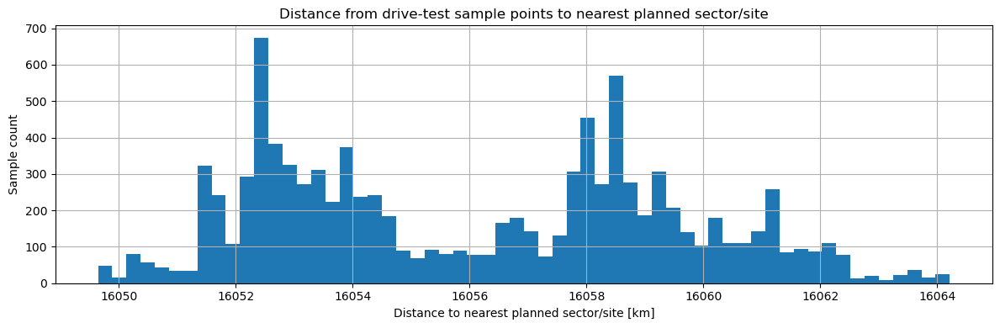

In [44]:
# Nearest planned sector/site for sampled drive-test points.
if LAT_COL and LON_COL and PLAN_LAT_COL and PLAN_LON_COL:
    nearest_plan_sample = nearest_neighbor_haversine(
        left_df=drive_map_sample,
        right_df=planning_df,
        left_lat=LAT_COL,
        left_lon=LON_COL,
        right_lat=PLAN_LAT_COL,
        right_lon=PLAN_LON_COL,
        right_prefix="plan",
    )
    print("Nearest planning comparison sample shape:", nearest_plan_sample.shape)

    selected_cols = [LAT_COL, LON_COL, "plan_distance_km"]
    for c in [DRIVE_PCI_COL, DRIVE_RSI_COL]:
        if c and c in nearest_plan_sample.columns:
            selected_cols.append(c)
    for c in [PLAN_SITE_SECTOR_COL, PLAN_SITE_COL, PLAN_SECTOR_COL, PLAN_AZIMUTH_COL, PLAN_PCI_COL, PLAN_RSI_COL, PLAN_MOD4_COL, PLAN_RADIUS_COL]:
        pc = "plan_" + c if c else None
        if pc and pc in nearest_plan_sample.columns:
            selected_cols.append(pc)

    display(nearest_plan_sample[selected_cols].head(30))
    save_table(nearest_plan_sample[selected_cols], "drive_nearest_planning_sample.csv")

    plt.figure(figsize=(12, 4))
    plt.hist(nearest_plan_sample["plan_distance_km"].dropna(), bins=60)
    plt.title("Distance from drive-test sample points to nearest planned sector/site")
    plt.xlabel("Distance to nearest planned sector/site [km]")
    plt.ylabel("Sample count")
    plt.tight_layout()
    plt.show()
else:
    nearest_plan_sample = pd.DataFrame()
    print("Nearest planning comparison skipped because drive-test or planning coordinates were not detected.")

In [45]:
# Compare drive PCI with nearest planned PCI when both exist.
# This is a starting point only: nearest site is not always the serving site, especially with overshooting, indoor routes, or high bands.
if not nearest_plan_sample.empty and DRIVE_PCI_COL and PLAN_PCI_COL:
    plan_pci_col_prefixed = "plan_" + PLAN_PCI_COL
    if plan_pci_col_prefixed in nearest_plan_sample.columns:
        temp = nearest_plan_sample.copy()
        temp["drive_pci_numeric"] = pd.to_numeric(temp[DRIVE_PCI_COL], errors="coerce")
        temp["nearest_plan_pci_numeric"] = pd.to_numeric(temp[plan_pci_col_prefixed], errors="coerce")
        temp["drive_pci_matches_nearest_plan_pci"] = temp["drive_pci_numeric"] == temp["nearest_plan_pci_numeric"]

        print("Drive PCI equals nearest planned PCI distribution:")
        display(temp["drive_pci_matches_nearest_plan_pci"].value_counts(dropna=False).to_frame("count"))

        mismatch = temp[temp["drive_pci_matches_nearest_plan_pci"] == False]
        print("Mismatch rows in sample:", len(mismatch))
        display(mismatch[[c for c in selected_cols + ["drive_pci_matches_nearest_plan_pci"] if c in mismatch.columns]].head(50))
else:
    print("Nearest planned PCI check skipped.")

Drive PCI equals nearest planned PCI distribution:


,count
drive_pci_matches_nearest_plan_pci,
False,10000


Mismatch rows in sample: 10000


,Location - Latitude,Location - Longitude,plan_distance_km,LTE - NeighborCells(0) - PCI,plan_site_sector_ID,plan_siteID,plan_sectorID,plan_Azimuth,plan_PCI,plan_RSI,plan_Mod4,plan_Cell Radius,drive_pci_matches_nearest_plan_pci
0,-17.801551,177.414812,16057.873478,NaN,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000,False
1,-17.622792,177.435256,16051.605309,169.0,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000,False
2,-17.808979,177.403553,16057.128500,149.0,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000,False
3,-17.622931,177.434996,16051.586699,169.0,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000,False
4,-17.766693,177.454610,16060.109926,NaN,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000,False
5,-17.803153,177.414798,16057.945696,146.0,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000,False
6,-17.812891,177.443264,16061.137521,151.0,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000,False
7,-17.773546,177.374553,16052.705517,157.0,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000,False
8,-17.772975,177.423574,16057.406240,129.0,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000,False
9,-17.796107,177.417047,16057.839165,363.0,SIN6252-3,SIN6252,93,270,642.0,395.0,2.0,7000,False


,Location - Latitude,Location - Longitude,plan_Azimuth,bearing_from_plan_to_drive,azimuth_error_deg,plan_distance_km
0,-17.801551,177.414812,270,80.727778,170.727778,16057.873478
1,-17.622792,177.435256,270,80.434568,170.434568,16051.605309
2,-17.808979,177.403553,270,80.747002,170.747002,16057.128500
3,-17.622931,177.434996,270,80.434963,170.434963,16051.586699
4,-17.766693,177.454610,270,80.646310,170.646310,16060.109926
5,-17.803153,177.414798,270,80.730294,170.730294,16057.945696
6,-17.812891,177.443264,270,80.726322,170.726322,16061.137521
7,-17.773546,177.374553,270,80.711152,170.711152,16052.705517
8,-17.772975,177.423574,270,80.677139,170.677139,16057.406240
9,-17.796107,177.417047,270,80.717748,170.717748,16057.839165


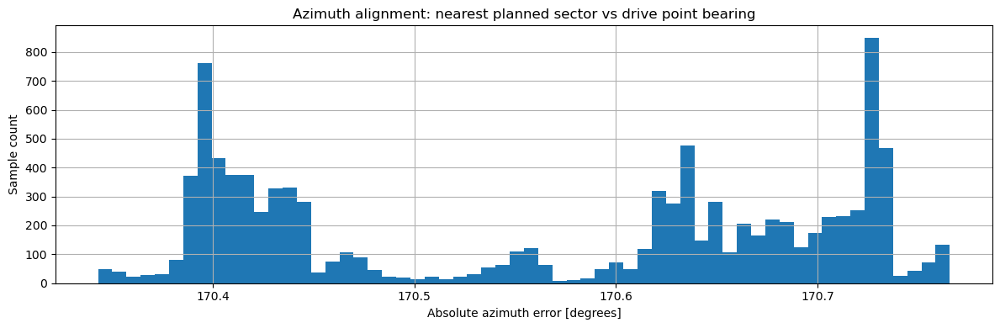

In [46]:
# Optional: if azimuth exists, calculate whether the drive point lies roughly in front of the nearest planned sector.
if not nearest_plan_sample.empty and PLAN_AZIMUTH_COL and PLAN_LAT_COL and PLAN_LON_COL:
    az_col = "plan_" + PLAN_AZIMUTH_COL
    site_lat_col = "plan_" + PLAN_LAT_COL
    site_lon_col = "plan_" + PLAN_LON_COL
    if all(c in nearest_plan_sample.columns for c in [az_col, site_lat_col, site_lon_col, LAT_COL, LON_COL]):
        az_df = nearest_plan_sample.copy()
        az_df["bearing_from_plan_to_drive"] = bearing_degrees(
            az_df[site_lat_col].astype(float),
            az_df[site_lon_col].astype(float),
            az_df[LAT_COL].astype(float),
            az_df[LON_COL].astype(float),
        )
        az_df["azimuth_error_deg"] = angular_difference_deg(
            pd.to_numeric(az_df[az_col], errors="coerce"),
            az_df["bearing_from_plan_to_drive"],
        )
        display(az_df[[LAT_COL, LON_COL, az_col, "bearing_from_plan_to_drive", "azimuth_error_deg", "plan_distance_km"]].head(30))

        plt.figure(figsize=(12, 4))
        plt.hist(az_df["azimuth_error_deg"].dropna(), bins=60)
        plt.title("Azimuth alignment: nearest planned sector vs drive point bearing")
        plt.xlabel("Absolute azimuth error [degrees]")
        plt.ylabel("Sample count")
        plt.tight_layout()
        plt.show()
    else:
        print("Required azimuth/coordinate columns were not found after prefixing.")
else:
    print("Azimuth alignment skipped.")

# 14. Candidate feature extraction ideas

After the EDA, you can start extracting features for anomaly detection, RCA, and ML.

## Drive-test-only features

| Feature family | Examples | Why useful |
|---|---|---|
| Coverage | RSRP min/mean/p5/p95, poor coverage ratio | Detect weak coverage zones |
| Quality/interference | RSRQ/SINR min/mean/p5, poor SINR ratio | Detect interference or bad radio quality |
| Throughput | DL/UL throughput mean/p5, zero-throughput ratio | Link radio quality to user experience |
| Mobility | handover count, handover failure count, PCI changes per km | Detect mobility problems |
| Stability | rolling KPI standard deviation, sudden drops | Detect local anomalies |
| Route context | speed, distance between samples, route segment ID | Separate radio problems from movement/test behavior |

## Planning + drive-test features

| Feature family | Examples | Why useful |
|---|---|---|
| Distance to planned site | nearest site distance, nearest same-PCI distance | Detect overshooting or wrong serving cell |
| Sector alignment | azimuth error between serving/nearest sector and drive point | Detect back-lobe/side-lobe serving or antenna direction issue |
| PCI/RSI consistency | observed PCI/RSI exists in planning, mismatch flags | Detect planning mismatch or missing plan updates |
| Mod4/PCI clash context | nearby same PCI/mod4 candidates | Explain interference/confusion anomalies |
| Radius validation | point distance > planned cell radius | Detect overshooting or incorrect radius assumption |

## Strong project ideas from this dataset

1. **5G NR planning validation dashboard**  
   Compare observed PCI/RSI from drive tests with the planned PCI/RSI sheet and flag missing/mismatched areas.

2. **Coverage anomaly detection**  
   Detect route segments with abnormal RSRP/SINR compared with nearby samples or same-cell historical behavior.

3. **Root cause analysis for poor SINR**  
   Use RSRP, RSRQ, distance to site, azimuth error, PCI/mod4 clash flags, and band/ARFCN to explain poor quality.

4. **Overshooting detection**  
   Find points served by cells far from their planned location or outside planned radius.

5. **PCI/Mod4 clash impact analysis**  
   Combine planning clash candidates with actual drive-test quality degradation.

In [47]:
# Example: create an initial feature table from the sampled drive-test data.
# This is intentionally generic because the exact drive-test columns are unknown until you inspect the file.

def create_initial_feature_table(
    df: pd.DataFrame,
    groups: Dict[str, List[str]],
    time_col: Optional[str] = None,
    lat_col: Optional[str] = None,
    lon_col: Optional[str] = None,
    pci_col: Optional[str] = None,
) -> pd.DataFrame:
    features = pd.DataFrame(index=df.index)

    if time_col and time_col in df.columns:
        features["time_parsed"] = pd.to_datetime(df[time_col], errors="coerce", infer_datetime_format=True)
        features["hour"] = features["time_parsed"].dt.hour
        features["dayofweek"] = features["time_parsed"].dt.dayofweek

    if lat_col and lon_col and lat_col in df.columns and lon_col in df.columns:
        features["latitude"] = pd.to_numeric(df[lat_col], errors="coerce")
        features["longitude"] = pd.to_numeric(df[lon_col], errors="coerce")

    if pci_col and pci_col in df.columns:
        features["pci"] = pd.to_numeric(df[pci_col], errors="coerce")
        features["pci_mod4"] = features["pci"] % 4

    # Add first matching KPI columns with standard names for easier modeling.
    for standard_name, group in [
        ("rsrp", "RSRP"),
        ("rsrq", "RSRQ"),
        ("sinr", "SINR/SNR"),
        ("rssi", "RSSI"),
    ]:
        cols = groups.get(group, [])
        if cols:
            features[standard_name] = pd.to_numeric(df[cols[0]], errors="coerce")

    # Quality flags using initial thresholds.
    if "rsrp" in features.columns:
        features["poor_rsrp_flag"] = features["rsrp"] < -100
    if "sinr" in features.columns:
        features["poor_sinr_flag"] = features["sinr"] < 0
    if "rsrq" in features.columns:
        features["poor_rsrq_flag"] = features["rsrq"] < -20

    return features

initial_features = create_initial_feature_table(
    drive_sample,
    drive_column_groups,
    time_col=TIME_COL,
    lat_col=LAT_COL,
    lon_col=LON_COL,
    pci_col=DRIVE_PCI_COL,
)

display(initial_features.head(20))
print("Initial feature table shape:", initial_features.shape)
save_table(initial_features, "initial_drive_test_feature_sample.csv")

,time_parsed,hour,dayofweek,latitude,longitude,pci,pci_mod4,rsrp,rsrq,sinr,rssi,poor_rsrp_flag,poor_sinr_flag,poor_rsrq_flag
123850,2025-08-25 04:22:27+02:00,4,0,-17.801551,177.414812,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False
178859,2025-08-28 04:37:32+02:00,4,3,-17.622792,177.435256,169.0,1.0,NaN,NaN,NaN,NaN,False,False,False
116696,2025-08-25 02:19:34+02:00,2,0,-17.808979,177.403553,149.0,1.0,NaN,NaN,NaN,NaN,False,False,False
172627,2025-08-28 02:41:54+02:00,2,3,-17.622931,177.434996,169.0,1.0,-85.362090,-10.906250,7.982609,-54.238453,False,False,False
117993,2025-08-25 02:41:36+02:00,2,0,-17.766693,177.454610,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False
157678,2025-08-27 02:54:16+02:00,2,2,-17.803153,177.414798,146.0,2.0,-91.178665,-8.665082,16.330437,-61.338993,False,False,False
180694,2025-08-29 00:24:12+02:00,0,4,-17.812891,177.443264,151.0,3.0,NaN,NaN,NaN,NaN,False,False,False
154661,2025-08-27 01:49:20+02:00,1,2,-17.773546,177.374553,157.0,1.0,-89.732680,-6.608434,23.033737,-62.617470,False,False,False
153588,2025-08-27 01:30:27+02:00,1,2,-17.772975,177.423574,129.0,1.0,-87.965000,-9.057500,27.793330,-58.605835,False,False,False
157987,2025-08-27 02:59:21+02:00,2,2,-17.796107,177.417047,363.0,3.0,NaN,NaN,NaN,NaN,False,False,False


Initial feature table shape: (50000, 14)
Saved: EDA_Outputs\initial_drive_test_feature_sample.csv


WindowsPath('EDA_Outputs/initial_drive_test_feature_sample.csv')

# 15. Save a compact EDA summary

This final section saves the key EDA tables to `EDA_Outputs` so you can review them outside the notebook.

The notebook already saved several CSV files while running. This section creates a short text summary too.

In [48]:
summary_lines = []
summary_lines.append("5G Drive Test + PCI/RSI Planning EDA Summary")
summary_lines.append("=" * 60)
summary_lines.append(f"Drive-test path: {DRIVE_TEST_PATH}")
summary_lines.append(f"Drive-test shape: {drive_df.shape}")
summary_lines.append(f"Drive-test memory: {human_bytes(drive_df.memory_usage(deep=True).sum())}")
summary_lines.append(f"Planning path: {PLANNING_XLSX}")
summary_lines.append(f"Planning shape: {planning_df.shape}")
summary_lines.append("")
summary_lines.append("Detected drive-test key columns:")
summary_lines.append(f"- Time: {TIME_COL}")
summary_lines.append(f"- Latitude: {LAT_COL}")
summary_lines.append(f"- Longitude: {LON_COL}")
summary_lines.append(f"- PCI: {DRIVE_PCI_COL}")
summary_lines.append(f"- RSI: {DRIVE_RSI_COL}")
summary_lines.append("")
summary_lines.append("Detected planning key columns:")
summary_lines.append(f"- Site sector: {PLAN_SITE_SECTOR_COL}")
summary_lines.append(f"- Site: {PLAN_SITE_COL}")
summary_lines.append(f"- Sector: {PLAN_SECTOR_COL}")
summary_lines.append(f"- Azimuth: {PLAN_AZIMUTH_COL}")
summary_lines.append(f"- Latitude: {PLAN_LAT_COL}")
summary_lines.append(f"- Longitude: {PLAN_LON_COL}")
summary_lines.append(f"- PCI: {PLAN_PCI_COL}")
summary_lines.append(f"- RSI: {PLAN_RSI_COL}")
summary_lines.append(f"- Mod4: {PLAN_MOD4_COL}")

summary_path = OUTPUT_DIR / "eda_summary.txt"
summary_path.write_text("\n".join(summary_lines), encoding="utf-8")
print(summary_path.read_text(encoding="utf-8"))
print("Saved:", summary_path)

5G Drive Test + PCI/RSI Planning EDA Summary
Drive-test path: Raw_Data\Network_Drive_Test.pkl
Drive-test shape: (64949, 1365)
Drive-test memory: 983.28 MB
Planning path: Raw_Data\NR5G_PCI_RSI_Planning.xlsx
Planning shape: (2554, 14)

Detected drive-test key columns:
- Time: timestamp
- Latitude: Location - Latitude
- Longitude: Location - Longitude
- PCI: LTE - NeighborCells(0) - PCI
- RSI: None

Detected planning key columns:
- Site sector: site_sector_ID
- Site: siteID
- Sector: sectorID
- Azimuth: Azimuth
- Latitude: Latitude
- Longitude: Longitude
- PCI: PCI
- RSI: RSI
- Mod4: Mod4
Saved: EDA_Outputs\eda_summary.txt


# Next recommended steps after you run this notebook

After you run the notebook and inspect the generated outputs, the next step is to decide the project direction.

The strongest next move is usually:

1. identify the exact drive-test columns for serving PCI, serving cell/site, RSRP, RSRQ, SINR, throughput, timestamp, latitude, and longitude;
2. define a clean comparison key against the planning file;
3. build a validation table with one row per drive-test sample or per route segment;
4. create flags such as `pci_not_in_plan`, `far_from_nearest_planned_site`, `outside_cell_radius`, `poor_sinr`, `poor_rsrp`, `possible_mod4_clash_area`;
5. use these flags as RCA/anomaly labels or ML features.

Once you share the actual discovered drive-test headers, the notebook can be tightened into a polished project pipeline.